## Maps for presentations
## Focus on: Central Valley, High Plains, Mississippi Embayment

In [1]:
# IMPORTS
import os
import pandas as pd 
import numpy as np
import seaborn as sns
import geopandas as gpd
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
#import contextily as cx
import requests
import calendar
from importlib import reload

from datetime import datetime, timedelta
from shapely.geometry import Point
from io import StringIO
from mpl_toolkits.axes_grid1 import make_axes_locatable
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
from matplotlib.patches import Patch

# Custom modules are imported in multiple locations to faciliate easy reloading when edits are made to their respective files
import Src.classes as cl
import Src.func_ko as fn
reload(cl)
reload(fn)

<module 'Src.func_ko' from 'C:\\Users\\kondr\\Documents\\GitHub\\DahlkeLab_LAWR\\Src\\func_ko.py'>

### Function to plot selected aquifers

In [2]:
#plot_huc4 = True
def get_aquifer_gdf(selected_aquifer):
    aquifer = selected_aquifer
    aq_gdf = gpd.read_file(aquifer.aq_shapefile)
    aq_gdf = aq_gdf.to_crs(epsg=4269)
    return aq_gdf



# if plot_huc4 == True:
#     # HUC4 Region Plot
#     for root, dirs, files in os.walk(aquifer.wb_dir):
#         #print(root, dirs, files)
#         if os.path.basename(root).startswith('NHD_H_'):
#             if aquifer.wb_shapefiles in files:
#                 shapefile_aq_path = os.path.join(root, aquifer.wb_shapefiles)
#                 ws_gdf = gpd.read_file(shapefile_aq_path)
#                 ws_gdf = ws_gdf.to_crs(epsg=4269)
#                 ws_gdf.plot(ax=ax, edgecolor='black', facecolor='darkblue', alpha=0.30, linewidth=0.5)

### Plot selected aquifers and streams

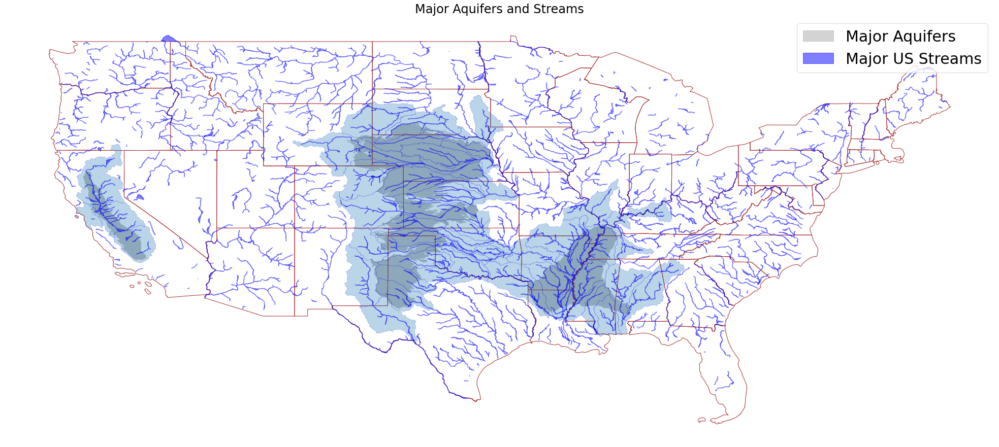

In [898]:
fig, ax = plt.subplots(figsize=(35, 35))

# Plot aquifers
high_plains_gdf = get_aquifer_gdf(cl.high_plains_aquifer)
high_plains_gdf.plot(ax=ax, edgecolor='none', facecolor='darkgrey', linewidth=1.25, alpha=0.75)

central_valley_gdf = get_aquifer_gdf(cl.central_valley_aquifer)
central_valley_gdf.plot(ax=ax, edgecolor='none', facecolor='darkgrey', linewidth=1.25, alpha=0.75)

meras_gdf = get_aquifer_gdf(cl.upper_clairborne_aquifer)
meras_gdf.plot(ax=ax, edgecolor='none', facecolor='darkgrey', linewidth=1.25, alpha=0.75)

# Plot US48
fn.plot_lower_48(ax)

# Plot streams
filepath = 'C:\\Users\\kondr\\Documents\\GitHub\\DahlkeLab_LAWR'
folder = 'Streams_us'
file = 'us_streams.shp'
shapefile_path = f'{filepath}\\ShapeFiles\\{folder}\\{file}'
st = gpd.read_file(shapefile_path)
#st = st.to_crs(epsg=4269)
st_plot = st.plot(ax=ax, edgecolor='blue', facecolor='blue', alpha = 0.5, legend=True)

aquifer = cl.central_valley_aquifer
# HUC4 Region Plot
for root, dirs, files in os.walk(aquifer.wb_dir):
    #print(root, dirs, files)
    if os.path.basename(root).startswith('NHD_H_'):
        if aquifer.wb_shapefiles in files:
            shapefile_aq_path = os.path.join(root, aquifer.wb_shapefiles)
            ws_gdf = gpd.read_file(shapefile_aq_path)
            ws_gdf = ws_gdf.to_crs(epsg=4269)
            ws_gdf.plot(ax=ax, edgecolor='blue', alpha=0.30, linewidth=0.5)
            
aquifer = cl.high_plains_aquifer
# HUC4 Region Plot
for root, dirs, files in os.walk(aquifer.wb_dir):
    #print(root, dirs, files)
    if os.path.basename(root).startswith('NHD_H_'):
        if aquifer.wb_shapefiles in files:
            shapefile_aq_path = os.path.join(root, aquifer.wb_shapefiles)
            ws_gdf = gpd.read_file(shapefile_aq_path)
            ws_gdf = ws_gdf.to_crs(epsg=4269)
            ws_gdf.plot(ax=ax, edgecolor='blue', alpha=0.30, linewidth=0.5)
            
aquifer = cl.upper_clairborne_aquifer
# HUC4 Region Plot
for root, dirs, files in os.walk(aquifer.wb_dir):
    #print(root, dirs, files)
    if os.path.basename(root).startswith('NHD_H_'):
        if aquifer.wb_shapefiles in files:
            shapefile_aq_path = os.path.join(root, aquifer.wb_shapefiles)
            ws_gdf = gpd.read_file(shapefile_aq_path)
            ws_gdf = ws_gdf.to_crs(epsg=4269)
            ws_gdf.plot(ax=ax, edgecolor='blue', alpha=0.30, linewidth=0.5)


plt.title('Major Aquifers and Streams', fontsize=24)

# Plot legend
handles = []  # Store handles for legend
labels = []   # Store labels for legend
handles.extend([Patch(color='darkgrey', alpha=0.5), Patch(color='blue', alpha=0.5)])  # Add the handle for legend
labels.extend(['Major Aquifers', 'Major US Streams'])  # Add the label for legend
#legend = ax.get_legend()
ax.legend(handles, labels, loc='upper right', fontsize=30)

ax.axis("off")

plt.savefig(f'Saved_Visuals/hyd201b_presentation/us_aquifers_streams_huc4s.png', bbox_inches='tight')

plt.show()

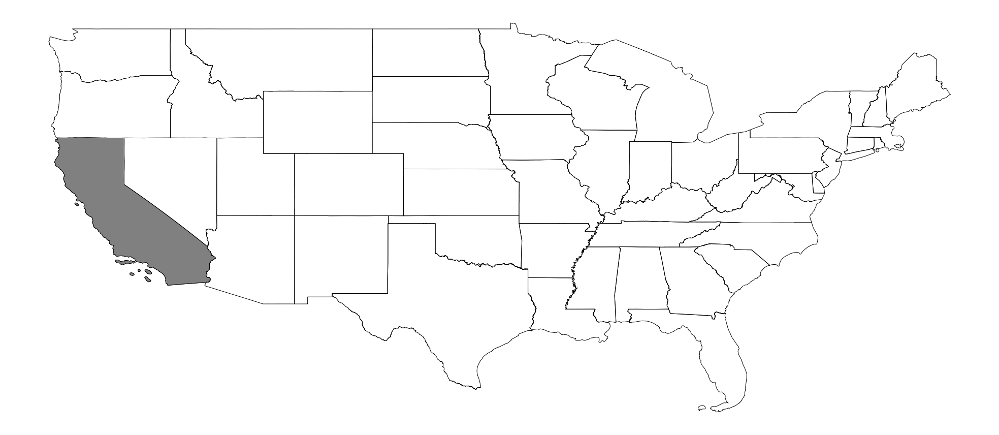

In [17]:
# Plot CA and streams only
fig, ax = plt.subplots(figsize=(35, 35))

# Plot US48
lower48 = gpd.read_file('ShapeFiles/Lower48/lower48.shp')        
lower48 = lower48.to_crs(epsg=4269)
lower48.plot(ax=ax, edgecolor='black', facecolor='none', linewidth=1.0)   

ca = lower48[lower48['NAME'] == 'California']
ca.plot(ax=ax, edgecolor='black', facecolor='grey', linewidth=1.0)   

ax.axis("off")

plt.savefig(f'Saved_Visuals/bsmar/us_map_ca.png', bbox_inches='tight')
    

# Plot streams
# filepath = 'C:\\Users\\kondr\\Documents\\GitHub\\DahlkeLab_LAWR'
# folder = 'Streams_us'
# file = 'us_streams.shp'
# shapefile_path = f'{filepath}\\ShapeFiles\\{folder}\\{file}'
# st = gpd.read_file(shapefile_path)
# #st = st.to_crs(epsg=4269)
# st_plot = st.plot(ax=ax, edgecolor='blue', facecolor='blue', alpha = 0.5, legend=True)



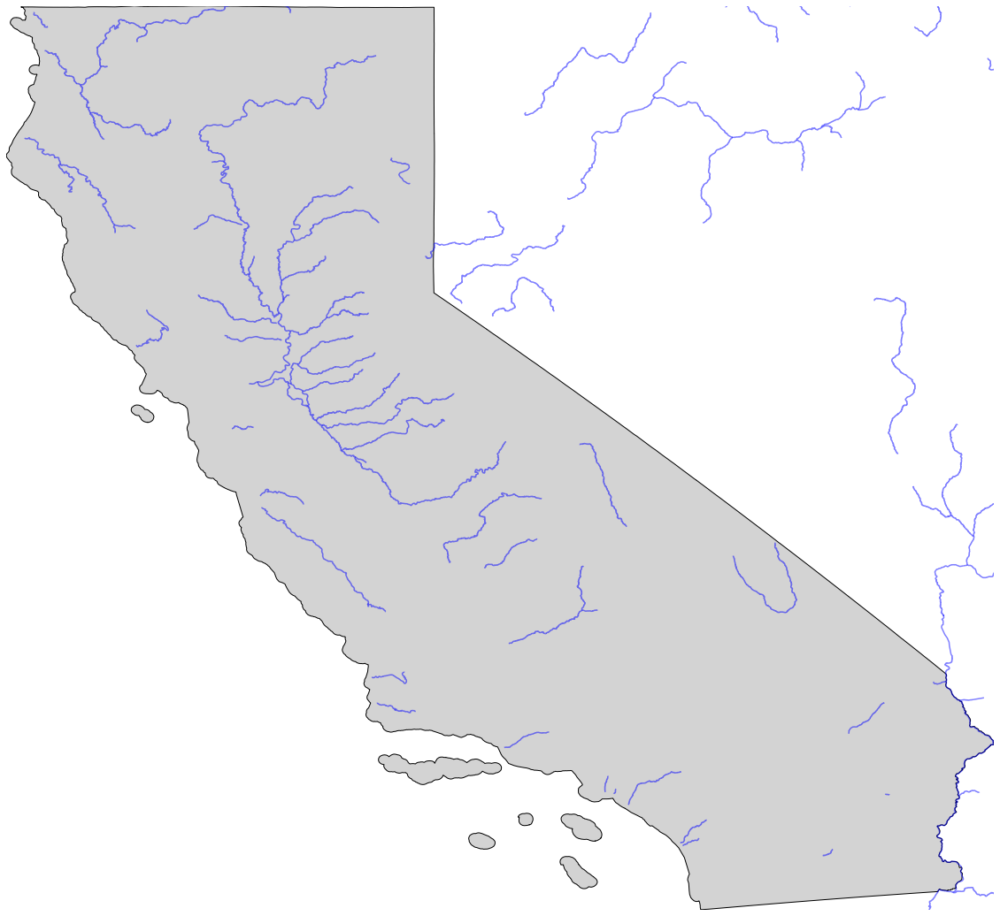

In [27]:
fig, ax = plt.subplots(figsize=(20, 20))
ca = lower48[lower48['NAME'] == 'California']
ca.plot(ax=ax, edgecolor='black', facecolor='lightgrey', linewidth=1.0)   

filepath = 'C:\\Users\\kondr\\Documents\\GitHub\\DahlkeLab_LAWR'
folder = 'Streams_us'
file = 'us_streams.shp'
shapefile_path = f'{filepath}\\ShapeFiles\\{folder}\\{file}'
st = gpd.read_file(shapefile_path)
#st = st.to_crs(epsg=4269)
st_plot = st.plot(ax=ax, edgecolor='blue', facecolor='none', alpha = 0.5, legend=True)

xmin, ymin, xmax, ymax = ca.total_bounds
padding = 0
xmin -= padding
ymin -= padding
xmax += padding
ymax += padding
ax.set_xlim(xmin, xmax)
ax.set_ylim(ymin, ymax)

ax.axis("off")

plt.savefig(f'Saved_Visuals/bsmar/ca_map_streams.png', bbox_inches='tight')

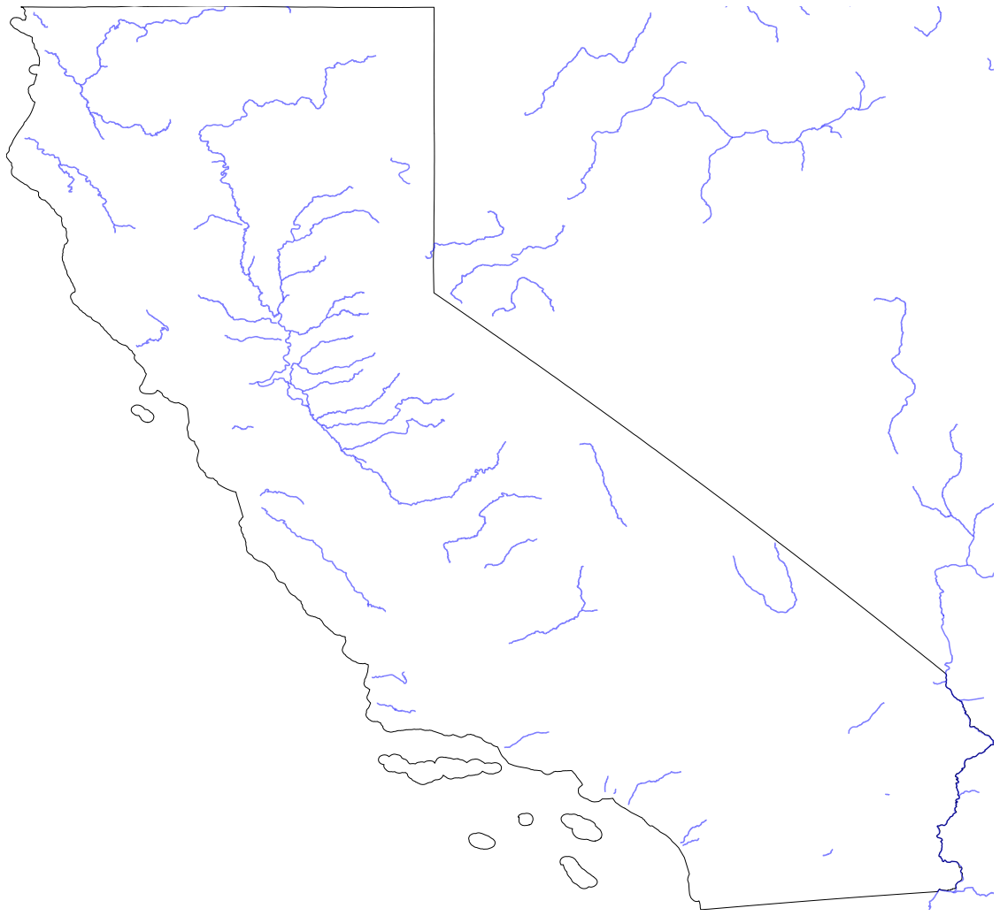

In [28]:
fig, ax = plt.subplots(figsize=(20, 20))
ca = lower48[lower48['NAME'] == 'California']
ca.plot(ax=ax, edgecolor='black', facecolor='none', linewidth=1.0)   

filepath = 'C:\\Users\\kondr\\Documents\\GitHub\\DahlkeLab_LAWR'
folder = 'Streams_us'
file = 'us_streams.shp'
shapefile_path = f'{filepath}\\ShapeFiles\\{folder}\\{file}'
st = gpd.read_file(shapefile_path)
#st = st.to_crs(epsg=4269)
st_plot = st.plot(ax=ax, edgecolor='blue', facecolor='none', alpha = 0.5, legend=True)

xmin, ymin, xmax, ymax = ca.total_bounds
padding = 0
xmin -= padding
ymin -= padding
xmax += padding
ymax += padding
ax.set_xlim(xmin, xmax)
ax.set_ylim(ymin, ymax)

ax.axis("off")

plt.savefig(f'Saved_Visuals/bsmar/ca_map_streams_only.png', bbox_inches='tight')

### Plot valid gages for all of US

In [515]:
data_range = 30
folder = 'National_Validity'
dataset = f'National_Validity_{data_range}.xlsx'
datapath = f'Prelim_Data/{folder}/{dataset}'
lower_48_shp_path = 'ShapeFiles/Lower48/lower48.shp'

show_huc2 = False
show_huc4 = False
show_rateb_aqs = False

df_validity = pd.read_excel(datapath, sheet_name='national_validity')

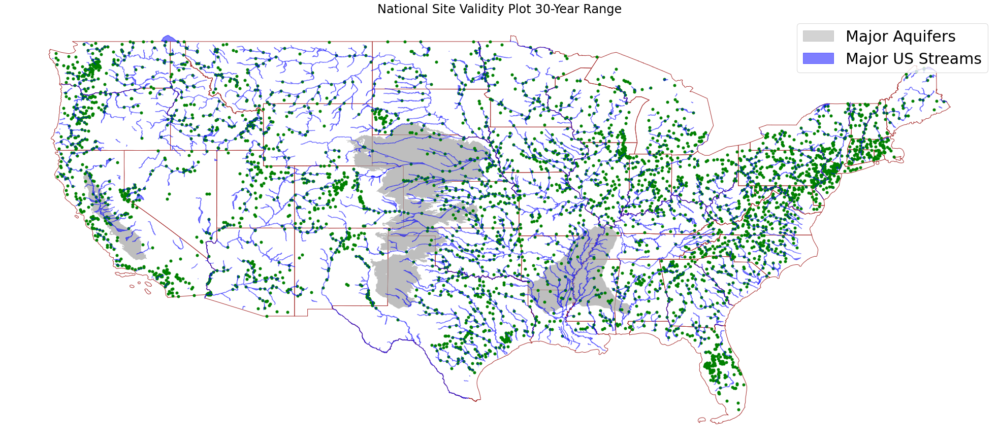

Total Sites with 00060_Mean Data: 8071
Valid Range and Continuity: 4088 (50.65%)
Valid Range, Invalid Continuity: 1209 (14.98%)
Invalid Range, Valid Continuity: 153 (1.9%)


In [776]:
fig, ax = plt.subplots(figsize=(35, 35))
plt.title(f"National Site Validity Plot {data_range}-Year Range", loc='center', fontsize=24)

fn.plot_lower_48(ax)

if show_rateb_aqs:
    fn.plot_rateb_aquifers(ax=ax, edgecolor='darkorange', facecolor='orange', alpha=0.5)
    
if show_huc2:
    fn.plot_huc2(ax=ax, codes=[], linewidth=2.0, edgecolor='fuchsia', facecolor='none', alpha=1.0)
    
if show_huc4:
    fn.plot_huc4(ax=ax, codes=[], linewidth=2.0, edgecolor='fuchsia', facecolor='none', alpha=1.0)
    
# Plot aquifers
high_plains_gdf = get_aquifer_gdf(cl.high_plains_aquifer)
high_plains_gdf.plot(ax=ax, edgecolor='none', facecolor='darkgrey', linewidth=1.25, alpha=0.75)

central_valley_gdf = get_aquifer_gdf(cl.central_valley_aquifer)
central_valley_gdf.plot(ax=ax, edgecolor='none', facecolor='darkgrey', linewidth=1.25, alpha=0.75)

meras_gdf = get_aquifer_gdf(cl.upper_clairborne_aquifer)
meras_gdf.plot(ax=ax, edgecolor='none', facecolor='darkgrey', linewidth=1.25, alpha=0.75)

geo_df = fn.convert_geometry(df_validity)

colors = df_validity['data_range'].astype(str) + df_validity['data_cont'].astype(str)
gdf_green = geo_df[colors == 'TrueTrue']
gdf_yellow = geo_df[colors == 'TrueFalse']
gdf_red = geo_df[colors == 'FalseTrue']
gdf_black = geo_df[colors == 'FalseFalse']

#gdf_black.plot(ax=ax, color='black', label='Invalid range and continuity', markersize=100, marker='.', alpha=1.0)
#gdf_red.plot(ax=ax, color='red', label='Invalid range, valid continuity', markersize=100, marker='.', alpha=1.0)
#gdf_yellow.plot(ax=ax, color='yellow', label='Valid range, invalid continuity', markersize=100, marker='.', alpha=1.0)
gdf_green.plot(ax=ax, color='green', label='Valid range and continuity', markersize=100, marker='.', alpha=1.0)
plt.legend(prop={'size': 22}, loc='lower right')

# order = {'TrueTrue': 0, 'TrueFalse': 1, 'FalseTrue': 2, 'FalseFalse': 3}
# colors = colors.map(order)
# axins = inset_axes(ax, width="30%", height="25%", loc='lower left', axes_kwargs={'frame_on': False})
# counts, edges, patches = axins.hist(colors, bins=4, edgecolor='black')

# # Define colors for each bin
# bin_colors = ['green', 'yellow', 'red', 'black']

# Iterate over patches (bars) and set their colors
# for patch, color in zip(patches, bin_colors):
#     patch.set_facecolor(color)

# for count, edge, patch in zip(counts, edges, patches):
#     height = patch.get_height()
#     center = edge + (patch.get_x() + patch.get_width() - edge) / 2
#     axins.text(center, height - 0.5, f'{count:.0f} ({round(count/len(df_validity)*100, 0):.0f}%)', ha='center', va='bottom', fontsize=20)

# axins.set_ylim(0, max(counts) + 5)
# axins.set_title(f'Total Sites: {len(df_validity)}', fontsize=22, loc='center')
# axins.set_xticks([])
# axins.set_yticks([])

# Plot streams
filepath = 'C:\\Users\\kondr\\Documents\\GitHub\\DahlkeLab_LAWR'
folder = 'Streams_us'
file = 'us_streams.shp'
shapefile_path = f'{filepath}\\ShapeFiles\\{folder}\\{file}'
st = gpd.read_file(shapefile_path)
#st = st.to_crs(epsg=4269)
st_plot = st.plot(ax=ax, edgecolor='blue', facecolor='blue', alpha = 0.5, legend=True)


# Plot legend
handles = []  # Store handles for legend
labels = []   # Store labels for legend
handles.extend([Patch(color='darkgrey', alpha=0.5), Patch(color='blue', alpha=0.5)])  # Add the handle for legend
labels.extend(['Major Aquifers', 'Major US Streams'])  # Add the label for legend
#legend = ax.get_legend()
ax.legend(handles, labels, loc='upper right', fontsize=30)

ax.set_xticks([])
ax.set_yticks([])

ax.axis("off")

plt.show()


print(f'Total Sites with 00060_Mean Data: {len(df_validity)}')
print(f'Valid Range and Continuity: {len(gdf_green)} ({round(len(gdf_green)/len(df_validity)*100, 2)}%)')
print(f'Valid Range, Invalid Continuity: {len(gdf_yellow)} ({round(len(gdf_yellow)/len(df_validity)*100, 2)}%)')
print(f'Invalid Range, Valid Continuity: {len(gdf_red)} ({round(len(gdf_red)/len(df_validity)*100, 2)}%)')

## Plot HMF metrics - Contiguous US

In [891]:
# Load dataset
data_range = 30
percentile = 90
folder = 'National_Metrics'
dataset = f'National_Metrics_{data_range}_{percentile}.xlsx'
datapath = f'Prelim_Data/{folder}/{dataset}'
lower_48_shp_path = 'ShapeFiles/Lower48/lower48.shp'

df_metrics = pd.read_excel(datapath, sheet_name='site_metrics')
df_valid = df_metrics[df_metrics['valid'] == True]

### Annual HMF

In [892]:
# Metric to be plotted where metrics are column names from the dataset
metric = 'annual_hmf' #'annual_hmf'

# True if you want to overwrite current images
overwrite = False
save_img = False

In [893]:
# Annual HMF 
bin_1 = 0.2
bin_2 = 0.7
bin_3 = 1.6
bin_4 = 3.0
bin_5 = 6.0
bin_6 = 14.1

bin_value_1 = 100
bin_value_2 = 500
bin_value_3 = 1000
bin_value_4 = 1500
bin_value_5 = 2000
bin_value_6 = 5000

for idx, value in df_valid[metric].iteritems():
    if value >= 0 and value < bin_1:
        df_valid.at[idx, metric+'_bin'] = bin_value_1
    elif value >= bin_1 and value < bin_2:
        df_valid.at[idx, metric+'_bin'] = bin_value_2
    elif value >= bin_2 and value < bin_3:
        df_valid.at[idx, metric+'_bin'] = bin_value_3
    elif value >= bin_3 and value < bin_4:
        df_valid.at[idx, metric+'_bin'] = bin_value_4
    elif value >= bin_4 and value < bin_5:
        df_valid.at[idx, metric+'_bin'] = bin_value_5
    elif value >= bin_5 and value < bin_6:
        df_valid.at[idx, metric+'_bin'] = bin_value_6

#print(df_valid['annual_hmf_bin'])
#print(df_valid['annual_hmf'])

bin_colors = {
    bin_value_1: 'midnightblue',
    bin_value_2: 'royalblue',
    bin_value_3: 'turquoise',
    bin_value_4: 'lightgreen',
    bin_value_5: 'yellow',
    bin_value_6: 'darkorange'
}

C:\Users\kondr\anaconda3\lib\site-packages\pandas\core\indexing.py:844: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[key] = _infer_fill_value(value)
C:\Users\kondr\anaconda3\lib\site-packages\pandas\core\indexing.py:965: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[item] = s


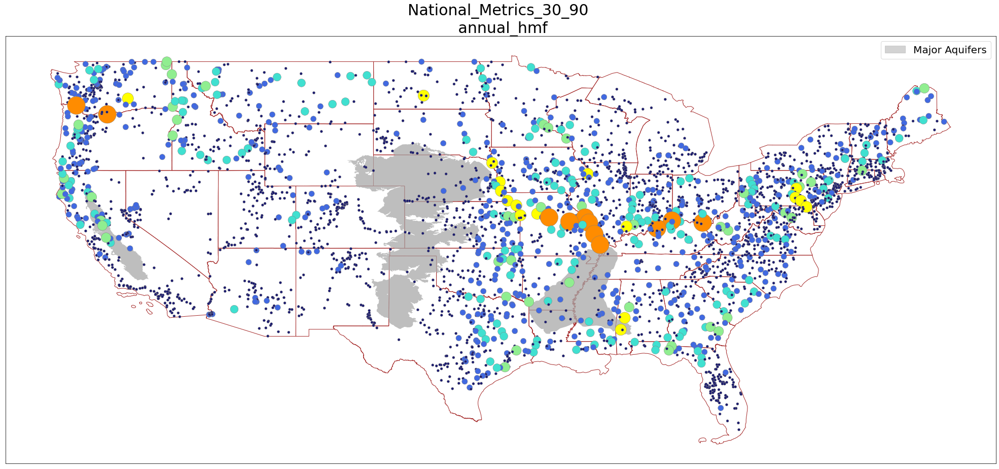

In [862]:
fig, ax = plt.subplots(figsize=(35, 35))
plt.title(f'{dataset[:-5]} \n {metric}', loc='center', fontsize=30)

# Lower-48 Plot
fn.plot_lower_48(ax)

# HUC4 Region Plot
'''for root, dirs, files in os.walk(aquifer.wb_dir):
    #print(root, dirs, files)
    if os.path.basename(root).startswith('NHD_H_'):
        if aquifer.wb_shapefiles in files:
            shapefile_aq_path = os.path.join(root, aquifer.wb_shapefiles)
            ws_gdf = gpd.read_file(shapefile_aq_path)
            ws_gdf = ws_gdf.to_crs(4269)
            ws_gdf.plot(ax=ax, edgecolor='blue', alpha=0.30, linewidth=0.5)'''

# Plot aquifers
high_plains_gdf = get_aquifer_gdf(cl.high_plains_aquifer)
high_plains_gdf.plot(ax=ax, edgecolor='none', facecolor='darkgrey', linewidth=1.25, alpha=0.75)

central_valley_gdf = get_aquifer_gdf(cl.central_valley_aquifer)
central_valley_gdf.plot(ax=ax, edgecolor='none', facecolor='darkgrey', linewidth=1.25, alpha=0.75)

meras_gdf = get_aquifer_gdf(cl.upper_clairborne_aquifer)
meras_gdf.plot(ax=ax, edgecolor='none', facecolor='darkgrey', linewidth=1.25, alpha=0.75)

# xmin, ymin, xmax, ymax = aq_gdf.total_bounds
# padding = 2.0
# xmin -= padding
# ymin -= padding
# xmax += padding
# ymax += padding

# aq_gdf.plot(ax=ax, edgecolor='red', facecolor='none', linewidth=1.25)
# ax.set_xlim(xmin, xmax)
# ax.set_ylim(ymin, ymax)

# Convert decimal lat/long to geo points
df_valid_geo = df_valid.reset_index()
geo_df = fn.convert_geometry(df_valid_geo)
geo_df.crs = 4269
geo_df = geo_df.merge(df_valid_geo, how='left', left_index=True, right_index=True)
geo_df.dropna(subset=[metric+'_bin'], inplace=True)

# Set colorbar limits and theme using undivided dataset so that scale is static
#cmap, mappable = fn.scale_colorbar(df_valid, metric)
#div = make_axes_locatable(ax)
#cax = div.append_axes("bottom", size="5%", pad=0.05)

# Watergauges plot - colormap
#bx = geo_df.plot(ax=ax, column='inter_annual', markersize=300, marker='.', cmap=cmap, edgecolor='black', linewidth=1, alpha=0.75)
#cbx = plt.colorbar(mappable, cax=cax, pad=0.05, aspect=25, orientation='horizontal', alpha=1.0)
#cbx.set_label(fn.FLOW_METRIC_UNITS[metric])

# Watergages plot - marker size
bx = geo_df.plot(ax=ax, markersize=geo_df[metric+'_bin'], marker='.', 
                 color=[bin_colors[bin_val] for bin_val in geo_df[metric+'_bin']], linewidth=0.5, alpha=1.0, edgecolor='grey') #column=metric
#cbx = plt.colorbar(mappable, cax=cax, pad=0.05, aspect=25, orientation='horizontal', alpha=1.0)
#cbx.set_label(fn.FLOW_METRIC_UNITS[metric])

ax.set_yticks([])
ax.set_xticks([])

# Plot legend
#handles = []  # Store handles for legend
#labels = []   # Store labels for legend
patch = Patch(color='darkgrey', alpha=0.5)  # Add the handle for legend
label = 'Major Aquifers'  # Add the label for legend
ax.legend([patch], [label], loc='upper right', fontsize=20)

# Save images if they don't exist or if overwrite is True
if save_img:
    img_path = f'Saved_Visuals/{dataset[:-5]}_{metric}.png'
    fn.save_plot_as_image(img_path, overwrite)

plt.savefig(f'Saved_Visuals/hyd201b_presentation/{dataset[:-5]}_{metric}.png', bbox_inches='tight')

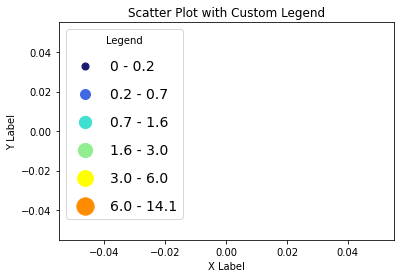

In [863]:
import matplotlib.patches as mpatches

# Define bin values and corresponding colors
bin_values = [bin_value_1, bin_value_2, bin_value_3, bin_value_4, bin_value_5, bin_value_6]
bin_colors = ['midnightblue', 'royalblue', 'turquoise', 'lightgreen', 'yellow', 'darkorange']

# Define bin ranges
bin_ranges = [(0, bin_1), (bin_1, bin_2), (bin_2, bin_3), (bin_3, bin_4), (bin_4, bin_5), (bin_5, bin_6)]

# Define marker sizes corresponding to bin values
marker_sizes = [50, 100, 150, 200, 250, 300]

# Plot dummy points for the legend
for i in range(len(bin_values)):
    plt.scatter([], [], c=bin_colors[i], s=marker_sizes[i], label=f'{bin_ranges[i][0]} - {bin_ranges[i][1]}')

# Create custom legend with markers, sizes, bin ranges, and colors
plt.legend(scatterpoints=1, frameon=True, labelspacing=1, title='Legend', loc='upper left', fontsize=14)

plt.xlabel('X Label')
plt.ylabel('Y Label')
plt.title('Scatter Plot with Custom Legend')
plt.savefig(f'Saved_Visuals/hyd201b_presentation/{dataset[:-5]}_{metric}_legend.png', bbox_inches='tight')
plt.show()

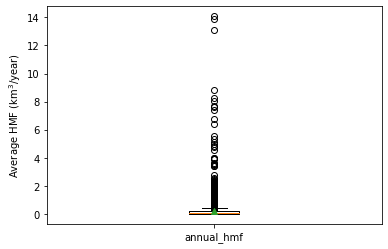

count    3367.000000
mean        0.230610
std         0.693946
min         0.000062
25%         0.021645
50%         0.066354
75%         0.188793
max        14.069366
Name: annual_hmf, dtype: float64

In [864]:
def plot_hmf_metric_boxplot(df, metric):
    plt.boxplot(df[metric], showmeans=True)
    #print(boxplot['fliers'])
    plt.xticks(ticks=[1], labels=[f'{metric}'])
    plt.ylabel(fn.FLOW_METRIC_UNITS[metric])
    plt.show()
    return

def get_boxplot_outliers(df, metric):
    boxplot = plt.boxplot(df[metric], showmeans=True)
    plt.xticks(ticks=[1], labels=[f'{metric}'])
    plt.ylabel(fn.FLOW_METRIC_UNITS[metric])
    plt.show()
    
    # Extract outliers
    outliers = [flier.get_ydata() for flier in boxplot['fliers']] # note: boxplot['fliers'] is a graphical object
    # Flatten the outliers list
    outliers = [item for sublist in outliers for item in sublist]
    outlier_site_nos = df.loc[df[metric].isin(outliers), 'site_no']
    return outliers, outlier_site_nos

# All HMF metrics
#for metric in metric_list:
#    plot_hmf_metric_boxplot(df_natl_30_90, metric)

# Singular HMF metric
#plot_hmf_metric_boxplot(df_natl_30_90, metric)
outliers, outlier_site_nos = get_boxplot_outliers(df_valid, metric)
df_valid[metric].describe()

### Annual duration

In [870]:
# Metric to be plotted where metrics are column names from the dataset
metric = 'annual_duration' #'annual_hmf'

# True if you want to overwrite current images
overwrite = False
save_img = False

In [871]:
# Annual duration
bin_1 = 20
bin_2 = 30
bin_3 = 35
bin_4 = 40
bin_5 = 45
bin_6 = 55
bin_7 = 75
bin_8 = 157

bin_value_1 = 10
bin_value_2 = 200
bin_value_3 = 400
bin_value_4 = 600
bin_value_5 = 800
bin_value_6 = 1000
bin_value_7 = 1200
bin_value_8 = 1400

for idx, value in df_valid[metric].iteritems():
    if value >= 0 and value < bin_1:
        df_valid.at[idx, metric+'_bin'] = bin_value_1
    elif value >= bin_1 and value < bin_2:
        df_valid.at[idx, metric+'_bin'] = bin_value_2
    elif value >= bin_2 and value < bin_3:
        df_valid.at[idx, metric+'_bin'] = bin_value_3
    elif value >= bin_3 and value < bin_4:
        df_valid.at[idx, metric+'_bin'] = bin_value_4
    elif value >= bin_4 and value < bin_5:
        df_valid.at[idx, metric+'_bin'] = bin_value_5
    elif value >= bin_5 and value < bin_6:
        df_valid.at[idx, metric+'_bin'] = bin_value_6
    elif value >= bin_6 and value < bin_7:
        df_valid.at[idx, metric+'_bin'] = bin_value_7
    elif value >= bin_7 and value < bin_8:
        df_valid.at[idx, metric+'_bin'] = bin_value_8
        
#print(df_valid['annual_hmf_bin'])
#print(df_valid['annual_hmf'])

bin_colors = {
    bin_value_1: 'midnightblue',
    bin_value_2: 'royalblue',
    bin_value_3: 'turquoise',
    bin_value_4: 'lightblue',
    bin_value_5: 'purple',
    bin_value_6: 'red',
    bin_value_7: 'darkorange',
    bin_value_8: 'yellow'
}

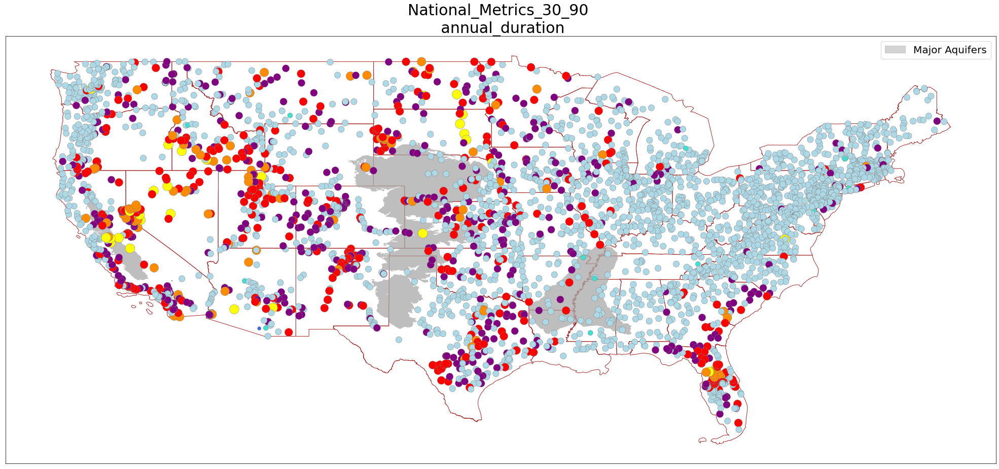

In [873]:
fig, ax = plt.subplots(figsize=(35, 35))
plt.title(f'{dataset[:-5]} \n {metric}', loc='center', fontsize=30)

# Lower-48 Plot
fn.plot_lower_48(ax)

# HUC4 Region Plot
'''for root, dirs, files in os.walk(aquifer.wb_dir):
    #print(root, dirs, files)
    if os.path.basename(root).startswith('NHD_H_'):
        if aquifer.wb_shapefiles in files:
            shapefile_aq_path = os.path.join(root, aquifer.wb_shapefiles)
            ws_gdf = gpd.read_file(shapefile_aq_path)
            ws_gdf = ws_gdf.to_crs(4269)
            ws_gdf.plot(ax=ax, edgecolor='blue', alpha=0.30, linewidth=0.5)'''

# Plot aquifers
high_plains_gdf = get_aquifer_gdf(cl.high_plains_aquifer)
high_plains_gdf.plot(ax=ax, edgecolor='none', facecolor='darkgrey', linewidth=1.25, alpha=0.75)

central_valley_gdf = get_aquifer_gdf(cl.central_valley_aquifer)
central_valley_gdf.plot(ax=ax, edgecolor='none', facecolor='darkgrey', linewidth=1.25, alpha=0.75)

meras_gdf = get_aquifer_gdf(cl.upper_clairborne_aquifer)
meras_gdf.plot(ax=ax, edgecolor='none', facecolor='darkgrey', linewidth=1.25, alpha=0.75)

# xmin, ymin, xmax, ymax = aq_gdf.total_bounds
# padding = 2.0
# xmin -= padding
# ymin -= padding
# xmax += padding
# ymax += padding

# aq_gdf.plot(ax=ax, edgecolor='red', facecolor='none', linewidth=1.25)
# ax.set_xlim(xmin, xmax)
# ax.set_ylim(ymin, ymax)

# Convert decimal lat/long to geo points
df_valid_geo = df_valid.reset_index()
geo_df = fn.convert_geometry(df_valid_geo)
geo_df.crs = 4269
geo_df = geo_df.merge(df_valid_geo, how='left', left_index=True, right_index=True)
geo_df.dropna(subset=[metric+'_bin'], inplace=True)

# Set colorbar limits and theme using undivided dataset so that scale is static
#cmap, mappable = fn.scale_colorbar(df_valid, metric)
#div = make_axes_locatable(ax)
#cax = div.append_axes("bottom", size="5%", pad=0.05)

# Watergauges plot - colormap
#bx = geo_df.plot(ax=ax, column='inter_annual', markersize=300, marker='.', cmap=cmap, edgecolor='black', linewidth=1, alpha=0.75)
#cbx = plt.colorbar(mappable, cax=cax, pad=0.05, aspect=25, orientation='horizontal', alpha=1.0)
#cbx.set_label(fn.FLOW_METRIC_UNITS[metric])

# Watergages plot - marker size
bx = geo_df.plot(ax=ax, markersize=geo_df[metric+'_bin'], marker='.', 
                 color=[bin_colors[bin_val] for bin_val in geo_df[metric+'_bin']], linewidth=0.5, alpha=1.0, edgecolor='grey') #column=metric
#cbx = plt.colorbar(mappable, cax=cax, pad=0.05, aspect=25, orientation='horizontal', alpha=1.0)
#cbx.set_label(fn.FLOW_METRIC_UNITS[metric])

ax.set_yticks([])
ax.set_xticks([])

# Plot legend
#handles = []  # Store handles for legend
#labels = []   # Store labels for legend
patch = Patch(color='darkgrey', alpha=0.5)  # Add the handle for legend
label = 'Major Aquifers'  # Add the label for legend
ax.legend([patch], [label], loc='upper right', fontsize=20)

# Save images if they don't exist or if overwrite is True
#if save_img:
#    img_path = f'Saved_Visuals/{dataset[:-5]}_{metric}.png'
#    fn.save_plot_as_image(img_path, overwrite)
    
plt.savefig(f'Saved_Visuals/hyd201b_presentation/{dataset[:-5]}_{metric}.png', bbox_inches='tight')

plt.show()

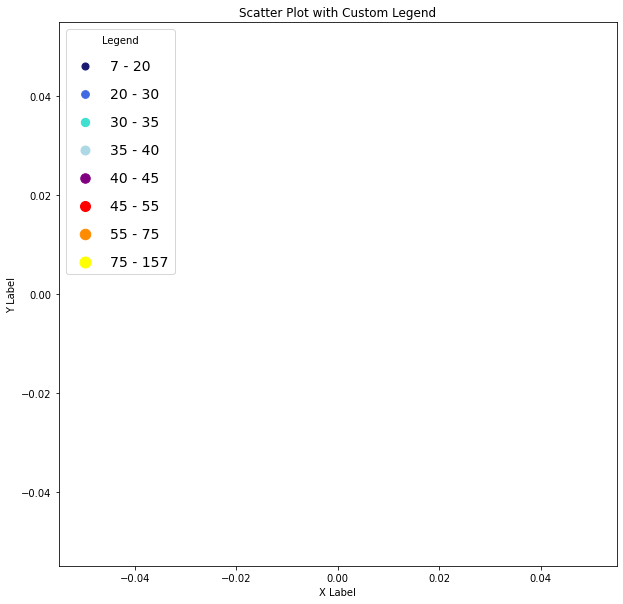

In [875]:
import matplotlib.patches as mpatches

# Define bin values and corresponding colors
bin_values = [bin_value_1, bin_value_2, bin_value_3, bin_value_4, bin_value_5, bin_value_6, bin_value_7, bin_value_8]
bin_colors = ['midnightblue', 'royalblue', 'turquoise', 'lightblue', 'purple', 'red', 'darkorange', 'yellow']

# Define bin ranges
bin_ranges = [(7, bin_1), (bin_1, bin_2), (bin_2, bin_3), (bin_3, bin_4), (bin_4, bin_5), (bin_5, bin_6), (bin_6, bin_7), (bin_7, bin_8)]

# Define marker sizes corresponding to bin values
marker_sizes = [50, 60, 70, 80, 90, 100, 110, 120]

# Plot dummy points for the legend
plt.figure(figsize=(10, 10))
for i in range(len(bin_values)):
    plt.scatter([], [], c=bin_colors[i], s=marker_sizes[i], label=f'{bin_ranges[i][0]} - {bin_ranges[i][1]}')

# Create custom legend with markers, sizes, bin ranges, and colors
plt.legend(scatterpoints=1, frameon=True, labelspacing=1, title='Legend', loc='upper left', fontsize=14)

plt.xlabel('X Label')
plt.ylabel('Y Label')
plt.title('Scatter Plot with Custom Legend')

plt.savefig(f'Saved_Visuals/hyd201b_presentation/{dataset[:-5]}_{metric}_legend.png', bbox_inches='tight')

plt.show()

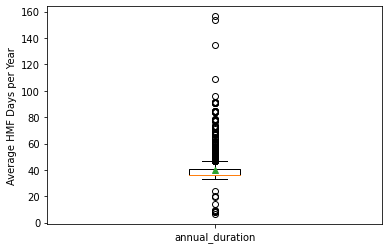

count    3367.000000
mean       39.902163
std         7.869594
min         6.583333
25%        36.433333
50%        36.533333
75%        40.481481
max       156.428571
Name: annual_duration, dtype: float64

In [845]:
def plot_hmf_metric_boxplot(df, metric):
    plt.boxplot(df[metric], showmeans=True)
    #print(boxplot['fliers'])
    plt.xticks(ticks=[1], labels=[f'{metric}'])
    plt.ylabel(fn.FLOW_METRIC_UNITS[metric])
    plt.show()
    return

def get_boxplot_outliers(df, metric):
    boxplot = plt.boxplot(df[metric], showmeans=True)
    plt.xticks(ticks=[1], labels=[f'{metric}'])
    plt.ylabel(fn.FLOW_METRIC_UNITS[metric])
    plt.show()
    
    # Extract outliers
    outliers = [flier.get_ydata() for flier in boxplot['fliers']] # note: boxplot['fliers'] is a graphical object
    # Flatten the outliers list
    outliers = [item for sublist in outliers for item in sublist]
    outlier_site_nos = df.loc[df[metric].isin(outliers), 'site_no']
    return outliers, outlier_site_nos

# All HMF metrics
#for metric in metric_list:
#    plot_hmf_metric_boxplot(df_natl_30_90, metric)

# Singular HMF metric
#plot_hmf_metric_boxplot(df_natl_30_90, metric)
outliers, outlier_site_nos = get_boxplot_outliers(df_valid, metric)
df_valid[metric].describe()

### Timing

In [894]:
# Metric to be plotted where metrics are column names from the dataset
metric = 'timing' #'annual_hmf'

# True if you want to overwrite current images
overwrite = False
save_img = False

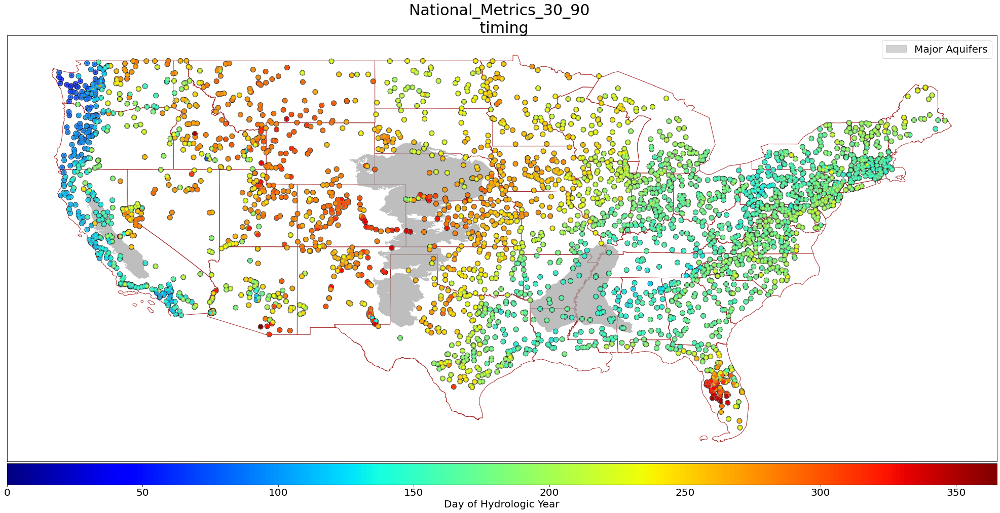

In [895]:
fig, ax = plt.subplots(figsize=(35, 35))
plt.title(f'{dataset[:-5]} \n {metric}', loc='center', fontsize=30)

# Lower-48 Plot
fn.plot_lower_48(ax)

# HUC4 Region Plot
'''for root, dirs, files in os.walk(aquifer.wb_dir):
    #print(root, dirs, files)
    if os.path.basename(root).startswith('NHD_H_'):
        if aquifer.wb_shapefiles in files:
            shapefile_aq_path = os.path.join(root, aquifer.wb_shapefiles)
            ws_gdf = gpd.read_file(shapefile_aq_path)
            ws_gdf = ws_gdf.to_crs(4269)
            ws_gdf.plot(ax=ax, edgecolor='blue', alpha=0.30, linewidth=0.5)'''

# Plot aquifers
high_plains_gdf = get_aquifer_gdf(cl.high_plains_aquifer)
high_plains_gdf.plot(ax=ax, edgecolor='none', facecolor='darkgrey', linewidth=1.25, alpha=0.75)

central_valley_gdf = get_aquifer_gdf(cl.central_valley_aquifer)
central_valley_gdf.plot(ax=ax, edgecolor='none', facecolor='darkgrey', linewidth=1.25, alpha=0.75)

meras_gdf = get_aquifer_gdf(cl.upper_clairborne_aquifer)
meras_gdf.plot(ax=ax, edgecolor='none', facecolor='darkgrey', linewidth=1.25, alpha=0.75)

# xmin, ymin, xmax, ymax = aq_gdf.total_bounds
# padding = 2.0
# xmin -= padding
# ymin -= padding
# xmax += padding
# ymax += padding

# aq_gdf.plot(ax=ax, edgecolor='red', facecolor='none', linewidth=1.25)
# ax.set_xlim(xmin, xmax)
# ax.set_ylim(ymin, ymax)

# Convert decimal lat/long to geo points
df_valid_geo = df_valid.reset_index()
geo_df = fn.convert_geometry(df_valid_geo)
geo_df.crs = 4269
geo_df = geo_df.merge(df_valid_geo, how='left', left_index=True, right_index=True)
#geo_df.dropna(subset=[metric+'_bin'], inplace=True)

# Set colorbar limits and theme using undivided dataset so that scale is static
#cmap, mappable = fn.scale_colorbar(df_valid, metric)
vmin = 0
vmax = 365        
norm = mcolors.Normalize(vmin, vmax)
cmap = 'jet'
mappable = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
mappable.set_array(df_valid[metric])
div = make_axes_locatable(ax)
div = make_axes_locatable(ax)
cax = div.append_axes("bottom", size="5%", pad=0.05)

# Watergauges plot - colormap
bx = geo_df.plot(ax=ax, column=metric, markersize=400, marker='.', cmap=cmap, edgecolor='black', linewidth=1, alpha=0.75)
cbx = plt.colorbar(mappable, cax=cax, pad=0.05, aspect=25, orientation='horizontal', alpha=1.0)
cbx.set_label(fn.FLOW_METRIC_UNITS[metric], fontsize=20)

# Watergages plot - marker size
bx = geo_df.plot(ax=ax, column=metric, markersize=geo_df[metric], marker='.', 
                 cmap='jet', linewidth=0.5, alpha=1.0, edgecolor='grey')
cbx = plt.colorbar(mappable, cax=cax, pad=0.05, aspect=25, orientation='horizontal', alpha=1.0)
cbx.set_label(fn.FLOW_METRIC_UNITS[metric])
cbx.ax.tick_params(labelsize=20)

ax.set_yticks([])
ax.set_xticks([])

# num_ticks = 12

# # Calculate the tick positions
# tick_positions = np.linspace(0, 365, num_ticks)

# # Set the tick positions and labels on the color bar
# cbx.set_ticks(tick_positions)
# cbx.set_ticklabels([f'{tick:.2f}' for tick in tick_positions])  # Format the tick labels as desired

# Plot legend
#handles = []  # Store handles for legend
#labels = []   # Store labels for legend
patch = Patch(color='darkgrey', alpha=0.5)  # Add the handle for legend
label = 'Major Aquifers'  # Add the label for legend
ax.legend([patch], [label], loc='upper right', fontsize=20)

# Save images if they don't exist or if overwrite is True
if save_img:
    img_path = f'Saved_Visuals/{dataset[:-5]}_{metric}.png'
    fn.save_plot_as_image(img_path, overwrite)
    
plt.savefig(f'Saved_Visuals/hyd201b_presentation/{dataset[:-5]}_{metric}.png', bbox_inches='tight')

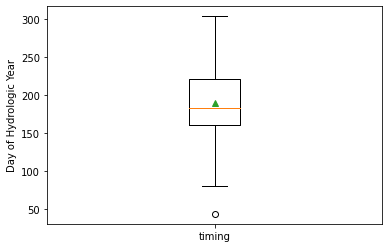

count    3367.000000
mean      189.443848
std        39.724960
min        43.545455
25%       161.223810
50%       183.100000
75%       221.708333
max       303.827586
Name: timing, dtype: float64

In [596]:
def plot_hmf_metric_boxplot(df, metric):
    plt.boxplot(df[metric], showmeans=True)
    #print(boxplot['fliers'])
    plt.xticks(ticks=[1], labels=[f'{metric}'])
    plt.ylabel(fn.FLOW_METRIC_UNITS[metric])
    plt.show()
    return

def get_boxplot_outliers(df, metric):
    boxplot = plt.boxplot(df[metric], showmeans=True)
    plt.xticks(ticks=[1], labels=[f'{metric}'])
    plt.ylabel(fn.FLOW_METRIC_UNITS[metric])
    plt.show()
    
    # Extract outliers
    outliers = [flier.get_ydata() for flier in boxplot['fliers']] # note: boxplot['fliers'] is a graphical object
    # Flatten the outliers list
    outliers = [item for sublist in outliers for item in sublist]
    outlier_site_nos = df.loc[df[metric].isin(outliers), 'site_no']
    return outliers, outlier_site_nos

# All HMF metrics
#for metric in metric_list:
#    plot_hmf_metric_boxplot(df_natl_30_90, metric)

# Singular HMF metric
#plot_hmf_metric_boxplot(df_natl_30_90, metric)
outliers, outlier_site_nos = get_boxplot_outliers(df_valid, metric)
df_valid[metric].describe()

### Inter-annual

In [876]:
# Metric to be plotted where metrics are column names from the dataset
metric = 'inter_annual%' #'annual_hmf'

# True if you want to overwrite current images
overwrite = False
save_img = False

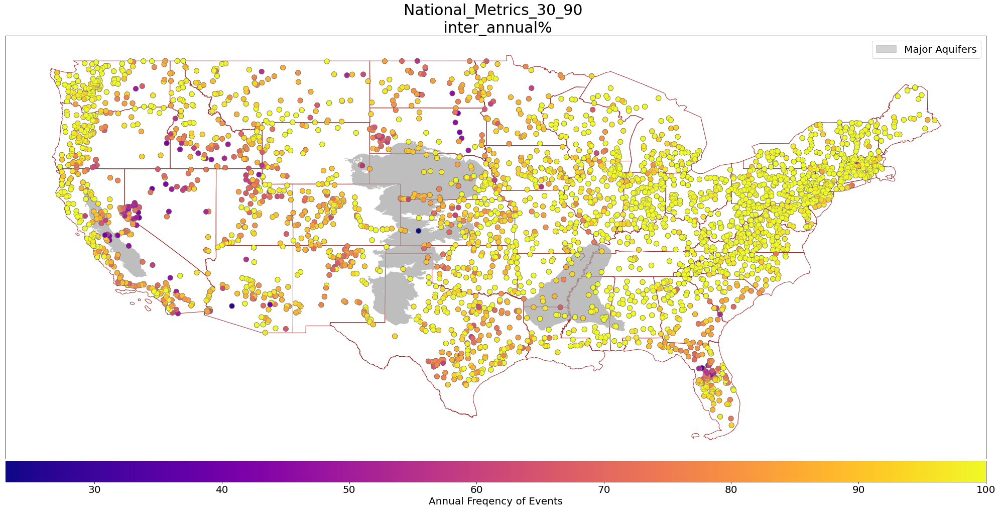

In [877]:
fig, ax = plt.subplots(figsize=(35, 35))
plt.title(f'{dataset[:-5]} \n {metric}', loc='center', fontsize=30)

# Lower-48 Plot
fn.plot_lower_48(ax)

# HUC4 Region Plot
'''for root, dirs, files in os.walk(aquifer.wb_dir):
    #print(root, dirs, files)
    if os.path.basename(root).startswith('NHD_H_'):
        if aquifer.wb_shapefiles in files:
            shapefile_aq_path = os.path.join(root, aquifer.wb_shapefiles)
            ws_gdf = gpd.read_file(shapefile_aq_path)
            ws_gdf = ws_gdf.to_crs(4269)
            ws_gdf.plot(ax=ax, edgecolor='blue', alpha=0.30, linewidth=0.5)'''

# Plot aquifers
high_plains_gdf = get_aquifer_gdf(cl.high_plains_aquifer)
high_plains_gdf.plot(ax=ax, edgecolor='none', facecolor='darkgrey', linewidth=1.25, alpha=0.75)

central_valley_gdf = get_aquifer_gdf(cl.central_valley_aquifer)
central_valley_gdf.plot(ax=ax, edgecolor='none', facecolor='darkgrey', linewidth=1.25, alpha=0.75)

meras_gdf = get_aquifer_gdf(cl.upper_clairborne_aquifer)
meras_gdf.plot(ax=ax, edgecolor='none', facecolor='darkgrey', linewidth=1.25, alpha=0.75)

# xmin, ymin, xmax, ymax = aq_gdf.total_bounds
# padding = 2.0
# xmin -= padding
# ymin -= padding
# xmax += padding
# ymax += padding

# aq_gdf.plot(ax=ax, edgecolor='red', facecolor='none', linewidth=1.25)
# ax.set_xlim(xmin, xmax)
# ax.set_ylim(ymin, ymax)

# Convert decimal lat/long to geo points
df_valid_geo = df_valid.reset_index()
geo_df = fn.convert_geometry(df_valid_geo)
geo_df.crs = 4269
geo_df = geo_df.merge(df_valid_geo, how='left', left_index=True, right_index=True)
#geo_df.dropna(subset=[metric+'_bin'], inplace=True)

# Set colorbar limits and theme using undivided dataset so that scale is static
cmap, mappable = fn.scale_colorbar(df_valid, metric, cmap='plasma')
div = make_axes_locatable(ax)
cax = div.append_axes("bottom", size="5%", pad=0.05)

# Watergauges plot - colormap
bx = geo_df.plot(ax=ax, column=metric, markersize=400, marker='.', cmap=cmap, edgecolor='black', linewidth=1, alpha=0.75)
cbx = plt.colorbar(mappable, cax=cax, pad=0.05, aspect=25, orientation='horizontal', alpha=1.0)
cbx.set_label(fn.FLOW_METRIC_UNITS[metric], fontsize=20)

# Watergages plot - marker size
bx = geo_df.plot(ax=ax, column=metric, markersize=400, marker='.', 
                 cmap='plasma', linewidth=0.5, alpha=1.0, edgecolor='grey')
cbx = plt.colorbar(mappable, cax=cax, pad=0.05, aspect=25, orientation='horizontal', alpha=1.0)
cbx.set_label(fn.FLOW_METRIC_UNITS[metric])
cbx.ax.tick_params(labelsize=20)

ax.set_yticks([])
ax.set_xticks([])

# num_ticks = 12

# # Calculate the tick positions
# tick_positions = np.linspace(0, 365, num_ticks)

# # Set the tick positions and labels on the color bar
# cbx.set_ticks(tick_positions)
# cbx.set_ticklabels([f'{tick:.2f}' for tick in tick_positions])  # Format the tick labels as desired

# Plot legend
#handles = []  # Store handles for legend
#labels = []   # Store labels for legend
patch = Patch(color='darkgrey', alpha=0.5)  # Add the handle for legend
label = 'Major Aquifers'  # Add the label for legend
ax.legend([patch], [label], loc='upper right', fontsize=20)

# Save images if they don't exist or if overwrite is True
if save_img:
    img_path = f'Saved_Visuals/{dataset[:-5]}_{metric}.png'
    fn.save_plot_as_image(img_path, overwrite)
    
plt.savefig(f'Saved_Visuals/hyd201b_presentation/{dataset[:-5]}_{metric}.png', bbox_inches='tight')

plt.show()

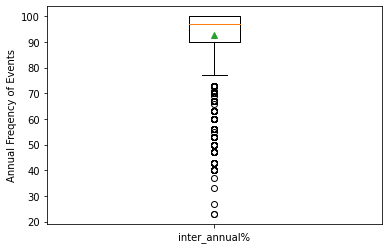

count    3367.000000
mean       92.683992
std        11.390620
min        23.000000
25%        90.000000
50%        97.000000
75%       100.000000
max       100.000000
Name: inter_annual%, dtype: float64

In [878]:
def plot_hmf_metric_boxplot(df, metric):
    plt.boxplot(df[metric], showmeans=True)
    #print(boxplot['fliers'])
    plt.xticks(ticks=[1], labels=[f'{metric}'])
    plt.ylabel(fn.FLOW_METRIC_UNITS[metric])
    plt.show()
    return

def get_boxplot_outliers(df, metric):
    boxplot = plt.boxplot(df[metric], showmeans=True)
    plt.xticks(ticks=[1], labels=[f'{metric}'])
    plt.ylabel(fn.FLOW_METRIC_UNITS[metric])
    plt.show()
    
    # Extract outliers
    outliers = [flier.get_ydata() for flier in boxplot['fliers']] # note: boxplot['fliers'] is a graphical object
    # Flatten the outliers list
    outliers = [item for sublist in outliers for item in sublist]
    outlier_site_nos = df.loc[df[metric].isin(outliers), 'site_no']
    return outliers, outlier_site_nos

# All HMF metrics
#for metric in metric_list:
#    plot_hmf_metric_boxplot(df_natl_30_90, metric)

# Singular HMF metric
#plot_hmf_metric_boxplot(df_natl_30_90, metric)
outliers, outlier_site_nos = get_boxplot_outliers(df_valid, metric)
df_valid[metric].describe()

### Intra-annual

In [613]:
# Metric to be plotted where metrics are column names from the dataset
metric = 'intra_annual' #'annual_hmf'

# True if you want to overwrite current images
overwrite = False
save_img = False

In [618]:
bin_1 = 3
bin_2 = 6
bin_3 = 10
bin_4 = 15
bin_5 = 20
bin_6 = 28

bin_value_1 = 100
bin_value_2 = 500
bin_value_3 = 1000
bin_value_4 = 1500
bin_value_5 = 2000
bin_value_6 = 4000

for idx, value in df_valid[metric].iteritems():
    if value >= 0 and value < bin_1:
        df_valid.at[idx, metric+'_bin'] = bin_value_1
    elif value >= bin_1 and value < bin_2:
        df_valid.at[idx, metric+'_bin'] = bin_value_2
    elif value >= bin_2 and value < bin_3:
        df_valid.at[idx, metric+'_bin'] = bin_value_3
    elif value >= bin_3 and value < bin_4:
        df_valid.at[idx, metric+'_bin'] = bin_value_4
    elif value >= bin_4 and value < bin_5:
        df_valid.at[idx, metric+'_bin'] = bin_value_5
    elif value >= bin_5 and value <= bin_6:
        df_valid.at[idx, metric+'_bin'] = bin_value_6

#print(df_valid['annual_hmf_bin'])
#print(df_valid['annual_hmf'])

bin_colors = {
    bin_value_1: 'red',
    bin_value_2: 'darkorange',
    bin_value_3: 'yellow',
    bin_value_4: 'magenta',
    bin_value_5: 'purple',
    bin_value_6: 'royalblue'
}

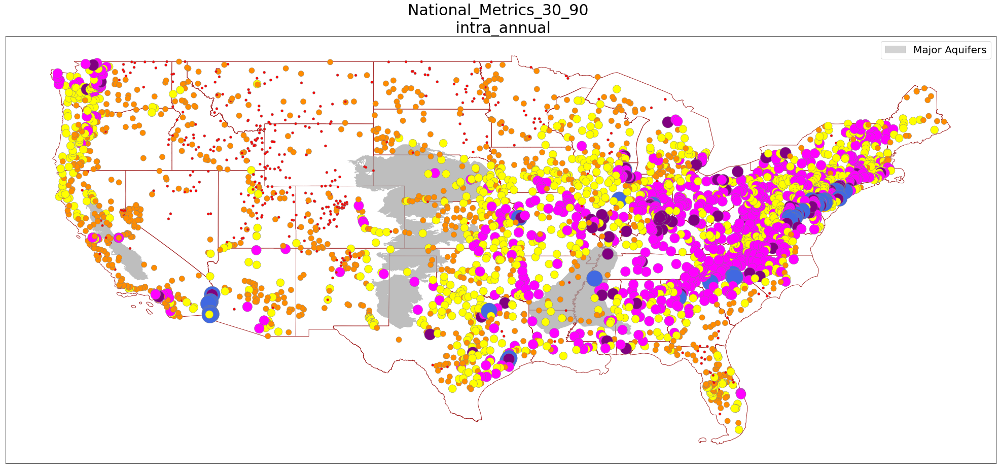

In [619]:
fig, ax = plt.subplots(figsize=(35, 35))
plt.title(f'{dataset[:-5]} \n {metric}', loc='center', fontsize=30)

# Lower-48 Plot
fn.plot_lower_48(ax)

# HUC4 Region Plot
'''for root, dirs, files in os.walk(aquifer.wb_dir):
    #print(root, dirs, files)
    if os.path.basename(root).startswith('NHD_H_'):
        if aquifer.wb_shapefiles in files:
            shapefile_aq_path = os.path.join(root, aquifer.wb_shapefiles)
            ws_gdf = gpd.read_file(shapefile_aq_path)
            ws_gdf = ws_gdf.to_crs(4269)
            ws_gdf.plot(ax=ax, edgecolor='blue', alpha=0.30, linewidth=0.5)'''

# Plot aquifers
high_plains_gdf = get_aquifer_gdf(cl.high_plains_aquifer)
high_plains_gdf.plot(ax=ax, edgecolor='none', facecolor='darkgrey', linewidth=1.25, alpha=0.75)

central_valley_gdf = get_aquifer_gdf(cl.central_valley_aquifer)
central_valley_gdf.plot(ax=ax, edgecolor='none', facecolor='darkgrey', linewidth=1.25, alpha=0.75)

meras_gdf = get_aquifer_gdf(cl.upper_clairborne_aquifer)
meras_gdf.plot(ax=ax, edgecolor='none', facecolor='darkgrey', linewidth=1.25, alpha=0.75)

# xmin, ymin, xmax, ymax = aq_gdf.total_bounds
# padding = 2.0
# xmin -= padding
# ymin -= padding
# xmax += padding
# ymax += padding

# aq_gdf.plot(ax=ax, edgecolor='red', facecolor='none', linewidth=1.25)
# ax.set_xlim(xmin, xmax)
# ax.set_ylim(ymin, ymax)

# Convert decimal lat/long to geo points
df_valid_geo = df_valid.reset_index()
geo_df = fn.convert_geometry(df_valid_geo)
geo_df.crs = 4269
geo_df = geo_df.merge(df_valid_geo, how='left', left_index=True, right_index=True)
geo_df.dropna(subset=[metric+'_bin'], inplace=True)

# Set colorbar limits and theme using undivided dataset so that scale is static
#cmap, mappable = fn.scale_colorbar(df_valid, metric)
#div = make_axes_locatable(ax)
#cax = div.append_axes("bottom", size="5%", pad=0.05)

# Watergauges plot - colormap
#bx = geo_df.plot(ax=ax, column='inter_annual', markersize=300, marker='.', cmap=cmap, edgecolor='black', linewidth=1, alpha=0.75)
#cbx = plt.colorbar(mappable, cax=cax, pad=0.05, aspect=25, orientation='horizontal', alpha=1.0)
#cbx.set_label(fn.FLOW_METRIC_UNITS[metric])

# Watergages plot - marker size
bx = geo_df.plot(ax=ax, markersize=geo_df[metric+'_bin'], marker='.', 
                 color=[bin_colors[bin_val] for bin_val in geo_df[metric+'_bin']], linewidth=0.5, alpha=1.0, edgecolor='grey') #column=metric
#cbx = plt.colorbar(mappable, cax=cax, pad=0.05, aspect=25, orientation='horizontal', alpha=1.0)
#cbx.set_label(fn.FLOW_METRIC_UNITS[metric])

ax.set_yticks([])
ax.set_xticks([])

# Plot legend
#handles = []  # Store handles for legend
#labels = []   # Store labels for legend
patch = Patch(color='darkgrey', alpha=0.5)  # Add the handle for legend
label = 'Major Aquifers'  # Add the label for legend
ax.legend([patch], [label], loc='upper right', fontsize=20)

# Save images if they don't exist or if overwrite is True
if save_img:
    img_path = f'Saved_Visuals/{dataset[:-5]}_{metric}.png'
    fn.save_plot_as_image(img_path, overwrite)
    
plt.savefig(f'Saved_Visuals/hyd201b_presentation/{dataset[:-5]}_{metric}.png', bbox_inches='tight')

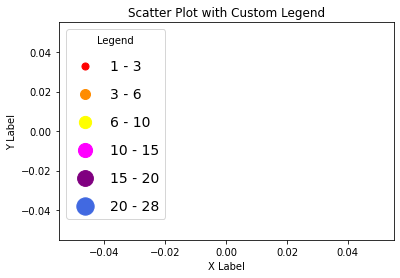

In [620]:
import matplotlib.patches as mpatches

# Define bin values and corresponding colors
bin_values = [bin_value_1, bin_value_2, bin_value_3, bin_value_4, bin_value_5, bin_value_6]
bin_colors = ['red', 'darkorange', 'yellow', 'magenta', 'purple', 'royalblue']

# Define bin ranges
bin_ranges = [(1, bin_1), (bin_1, bin_2), (bin_2, bin_3), (bin_3, bin_4), (bin_4, bin_5), (bin_5, bin_6)]

# Define marker sizes corresponding to bin values
marker_sizes = [50, 100, 150, 200, 250, 300]

# Plot dummy points for the legend
for i in range(len(bin_values)):
    plt.scatter([], [], c=bin_colors[i], s=marker_sizes[i], label=f'{bin_ranges[i][0]} - {bin_ranges[i][1]}')

# Create custom legend with markers, sizes, bin ranges, and colors
plt.legend(scatterpoints=1, frameon=True, labelspacing=1, title='Legend', loc='upper left', fontsize=14)

plt.xlabel('X Label')
plt.ylabel('Y Label')
plt.title('Scatter Plot with Custom Legend')

plt.savefig(f'Saved_Visuals/hyd201b_presentation/{dataset[:-5]}_{metric}_legend.png', bbox_inches='tight')

plt.show()

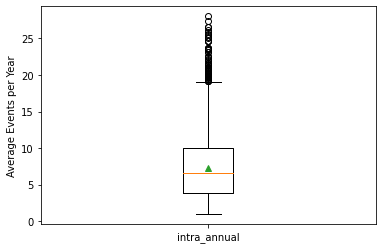

count    3367.000000
mean        7.318765
std         4.248026
min         1.000000
25%         3.904545
50%         6.583333
75%         9.966667
max        28.000000
Name: intra_annual, dtype: float64

In [621]:
def plot_hmf_metric_boxplot(df, metric):
    plt.boxplot(df[metric], showmeans=True)
    #print(boxplot['fliers'])
    plt.xticks(ticks=[1], labels=[f'{metric}'])
    plt.ylabel(fn.FLOW_METRIC_UNITS[metric])
    plt.show()
    return

def get_boxplot_outliers(df, metric):
    boxplot = plt.boxplot(df[metric], showmeans=True)
    plt.xticks(ticks=[1], labels=[f'{metric}'])
    plt.ylabel(fn.FLOW_METRIC_UNITS[metric])
    plt.show()
    
    # Extract outliers
    outliers = [flier.get_ydata() for flier in boxplot['fliers']] # note: boxplot['fliers'] is a graphical object
    # Flatten the outliers list
    outliers = [item for sublist in outliers for item in sublist]
    outlier_site_nos = df.loc[df[metric].isin(outliers), 'site_no']
    return outliers, outlier_site_nos

# All HMF metrics
#for metric in metric_list:
#    plot_hmf_metric_boxplot(df_natl_30_90, metric)

# Singular HMF metric
#plot_hmf_metric_boxplot(df_natl_30_90, metric)
outliers, outlier_site_nos = get_boxplot_outliers(df_valid, metric)
df_valid[metric].describe()

### Event HMF

In [622]:
# Metric to be plotted where metrics are column names from the dataset
metric = 'event_hmf' #'annual_hmf'

# True if you want to overwrite current images
overwrite = False
save_img = False

In [623]:
bin_1 = 0.005
bin_2 = 0.01
bin_3 = 0.1
bin_4 = 0.5
bin_5 = 1.0
bin_6 = 5.8

bin_value_1 = 100
bin_value_2 = 500
bin_value_3 = 1000
bin_value_4 = 1500
bin_value_5 = 2000
bin_value_6 = 5000

for idx, value in df_valid[metric].iteritems():
    if value >= 0 and value < bin_1:
        df_valid.at[idx, metric+'_bin'] = bin_value_1
    elif value >= bin_1 and value < bin_2:
        df_valid.at[idx, metric+'_bin'] = bin_value_2
    elif value >= bin_2 and value < bin_3:
        df_valid.at[idx, metric+'_bin'] = bin_value_3
    elif value >= bin_3 and value < bin_4:
        df_valid.at[idx, metric+'_bin'] = bin_value_4
    elif value >= bin_4 and value < bin_5:
        df_valid.at[idx, metric+'_bin'] = bin_value_5
    elif value >= bin_5 and value < bin_6:
        df_valid.at[idx, metric+'_bin'] = bin_value_6

#print(df_valid['annual_hmf_bin'])
#print(df_valid['annual_hmf'])

bin_colors = {
    bin_value_1: 'midnightblue',
    bin_value_2: 'royalblue',
    bin_value_3: 'turquoise',
    bin_value_4: 'lightgreen',
    bin_value_5: 'yellow',
    bin_value_6: 'darkorange'
}

C:\Users\kondr\anaconda3\lib\site-packages\pandas\core\indexing.py:844: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[key] = _infer_fill_value(value)
C:\Users\kondr\anaconda3\lib\site-packages\pandas\core\indexing.py:965: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[item] = s


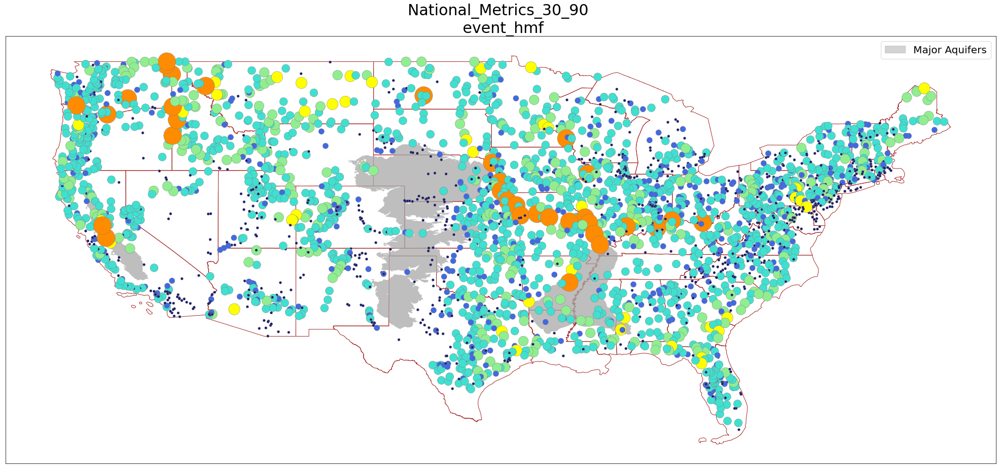

In [624]:
fig, ax = plt.subplots(figsize=(35, 35))
plt.title(f'{dataset[:-5]} \n {metric}', loc='center', fontsize=30)

# Lower-48 Plot
fn.plot_lower_48(ax)

# HUC4 Region Plot
'''for root, dirs, files in os.walk(aquifer.wb_dir):
    #print(root, dirs, files)
    if os.path.basename(root).startswith('NHD_H_'):
        if aquifer.wb_shapefiles in files:
            shapefile_aq_path = os.path.join(root, aquifer.wb_shapefiles)
            ws_gdf = gpd.read_file(shapefile_aq_path)
            ws_gdf = ws_gdf.to_crs(4269)
            ws_gdf.plot(ax=ax, edgecolor='blue', alpha=0.30, linewidth=0.5)'''

# Plot aquifers
high_plains_gdf = get_aquifer_gdf(cl.high_plains_aquifer)
high_plains_gdf.plot(ax=ax, edgecolor='none', facecolor='darkgrey', linewidth=1.25, alpha=0.75)

central_valley_gdf = get_aquifer_gdf(cl.central_valley_aquifer)
central_valley_gdf.plot(ax=ax, edgecolor='none', facecolor='darkgrey', linewidth=1.25, alpha=0.75)

meras_gdf = get_aquifer_gdf(cl.upper_clairborne_aquifer)
meras_gdf.plot(ax=ax, edgecolor='none', facecolor='darkgrey', linewidth=1.25, alpha=0.75)

# xmin, ymin, xmax, ymax = aq_gdf.total_bounds
# padding = 2.0
# xmin -= padding
# ymin -= padding
# xmax += padding
# ymax += padding

# aq_gdf.plot(ax=ax, edgecolor='red', facecolor='none', linewidth=1.25)
# ax.set_xlim(xmin, xmax)
# ax.set_ylim(ymin, ymax)

# Convert decimal lat/long to geo points
df_valid_geo = df_valid.reset_index()
geo_df = fn.convert_geometry(df_valid_geo)
geo_df.crs = 4269
geo_df = geo_df.merge(df_valid_geo, how='left', left_index=True, right_index=True)
geo_df.dropna(subset=[metric+'_bin'], inplace=True)

# Set colorbar limits and theme using undivided dataset so that scale is static
#cmap, mappable = fn.scale_colorbar(df_valid, metric)
#div = make_axes_locatable(ax)
#cax = div.append_axes("bottom", size="5%", pad=0.05)

# Watergauges plot - colormap
#bx = geo_df.plot(ax=ax, column='inter_annual', markersize=300, marker='.', cmap=cmap, edgecolor='black', linewidth=1, alpha=0.75)
#cbx = plt.colorbar(mappable, cax=cax, pad=0.05, aspect=25, orientation='horizontal', alpha=1.0)
#cbx.set_label(fn.FLOW_METRIC_UNITS[metric])

# Watergages plot - marker size
bx = geo_df.plot(ax=ax, markersize=geo_df[metric+'_bin'], marker='.', 
                 color=[bin_colors[bin_val] for bin_val in geo_df[metric+'_bin']], linewidth=0.5, alpha=1.0, edgecolor='grey') #column=metric
#cbx = plt.colorbar(mappable, cax=cax, pad=0.05, aspect=25, orientation='horizontal', alpha=1.0)
#cbx.set_label(fn.FLOW_METRIC_UNITS[metric])

ax.set_yticks([])
ax.set_xticks([])

# Plot legend
#handles = []  # Store handles for legend
#labels = []   # Store labels for legend
patch = Patch(color='darkgrey', alpha=0.5)  # Add the handle for legend
label = 'Major Aquifers'  # Add the label for legend
ax.legend([patch], [label], loc='upper right', fontsize=20)

# Save images if they don't exist or if overwrite is True
if save_img:
    img_path = f'Saved_Visuals/{dataset[:-5]}_{metric}.png'
    fn.save_plot_as_image(img_path, overwrite)
    
plt.savefig(f'Saved_Visuals/hyd201b_presentation/{dataset[:-5]}_{metric}.png', bbox_inches='tight')

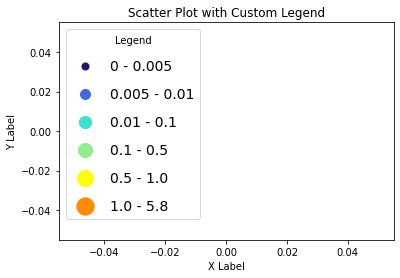

In [625]:
import matplotlib.patches as mpatches

# Define bin values and corresponding colors
bin_values = [bin_value_1, bin_value_2, bin_value_3, bin_value_4, bin_value_5, bin_value_6]
bin_colors = ['midnightblue', 'royalblue', 'turquoise', 'lightgreen', 'yellow', 'darkorange']

# Define bin ranges
bin_ranges = [(0, bin_1), (bin_1, bin_2), (bin_2, bin_3), (bin_3, bin_4), (bin_4, bin_5), (bin_5, bin_6)]

# Define marker sizes corresponding to bin values
marker_sizes = [50, 100, 150, 200, 250, 300]

# Plot dummy points for the legend
for i in range(len(bin_values)):
    plt.scatter([], [], c=bin_colors[i], s=marker_sizes[i], label=f'{bin_ranges[i][0]} - {bin_ranges[i][1]}')

# Create custom legend with markers, sizes, bin ranges, and colors
plt.legend(scatterpoints=1, frameon=True, labelspacing=1, title='Legend', loc='upper left', fontsize=14)

plt.xlabel('X Label')
plt.ylabel('Y Label')
plt.title('Scatter Plot with Custom Legend')

plt.savefig(f'Saved_Visuals/hyd201b_presentation/{dataset[:-5]}_{metric}_legend.png', bbox_inches='tight')

plt.show()

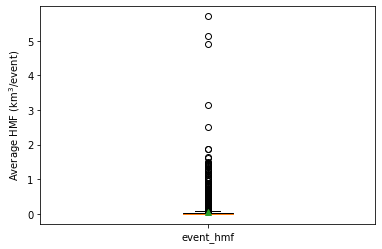

count    3367.000000
mean        0.058997
std         0.228665
min         0.000007
25%         0.003122
50%         0.010300
75%         0.035466
max         5.707410
Name: event_hmf, dtype: float64

In [626]:
def plot_hmf_metric_boxplot(df, metric):
    plt.boxplot(df[metric], showmeans=True)
    #print(boxplot['fliers'])
    plt.xticks(ticks=[1], labels=[f'{metric}'])
    plt.ylabel(fn.FLOW_METRIC_UNITS[metric])
    plt.show()
    return

def get_boxplot_outliers(df, metric):
    boxplot = plt.boxplot(df[metric], showmeans=True)
    plt.xticks(ticks=[1], labels=[f'{metric}'])
    plt.ylabel(fn.FLOW_METRIC_UNITS[metric])
    plt.show()
    
    # Extract outliers
    outliers = [flier.get_ydata() for flier in boxplot['fliers']] # note: boxplot['fliers'] is a graphical object
    # Flatten the outliers list
    outliers = [item for sublist in outliers for item in sublist]
    outlier_site_nos = df.loc[df[metric].isin(outliers), 'site_no']
    return outliers, outlier_site_nos

# All HMF metrics
#for metric in metric_list:
#    plot_hmf_metric_boxplot(df_natl_30_90, metric)

# Singular HMF metric
#plot_hmf_metric_boxplot(df_natl_30_90, metric)
outliers, outlier_site_nos = get_boxplot_outliers(df_valid, metric)
df_valid[metric].describe()

### Event duration

In [627]:
# Metric to be plotted where metrics are column names from the dataset
metric = 'event_duration' #'annual_hmf'

# True if you want to overwrite current images
overwrite = False
save_img = False

In [636]:
# Event duration
bin_1 = 3
bin_2 = 7
bin_3 = 10
bin_4 = 15
bin_5 = 20
bin_6 = 30
bin_7 = 40
bin_8 = 72

bin_value_1 = 10
bin_value_2 = 200
bin_value_3 = 400
bin_value_4 = 600
bin_value_5 = 800
bin_value_6 = 1000
bin_value_7 = 1200
bin_value_8 = 1400

for idx, value in df_valid[metric].iteritems():
    if value >= 0 and value < bin_1:
        df_valid.at[idx, metric+'_bin'] = bin_value_1
    elif value >= bin_1 and value < bin_2:
        df_valid.at[idx, metric+'_bin'] = bin_value_2
    elif value >= bin_2 and value < bin_3:
        df_valid.at[idx, metric+'_bin'] = bin_value_3
    elif value >= bin_3 and value < bin_4:
        df_valid.at[idx, metric+'_bin'] = bin_value_4
    elif value >= bin_4 and value < bin_5:
        df_valid.at[idx, metric+'_bin'] = bin_value_5
    elif value >= bin_5 and value < bin_6:
        df_valid.at[idx, metric+'_bin'] = bin_value_6
    elif value >= bin_6 and value < bin_7:
        df_valid.at[idx, metric+'_bin'] = bin_value_7
    elif value >= bin_7 and value < bin_8:
        df_valid.at[idx, metric+'_bin'] = bin_value_8
        
#print(df_valid['annual_hmf_bin'])
#print(df_valid['annual_hmf'])

bin_colors = {
    bin_value_1: 'midnightblue',
    bin_value_2: 'royalblue',
    bin_value_3: 'turquoise',
    bin_value_4: 'lightblue',
    bin_value_5: 'purple',
    bin_value_6: 'red',
    bin_value_7: 'darkorange',
    bin_value_8: 'yellow'
}

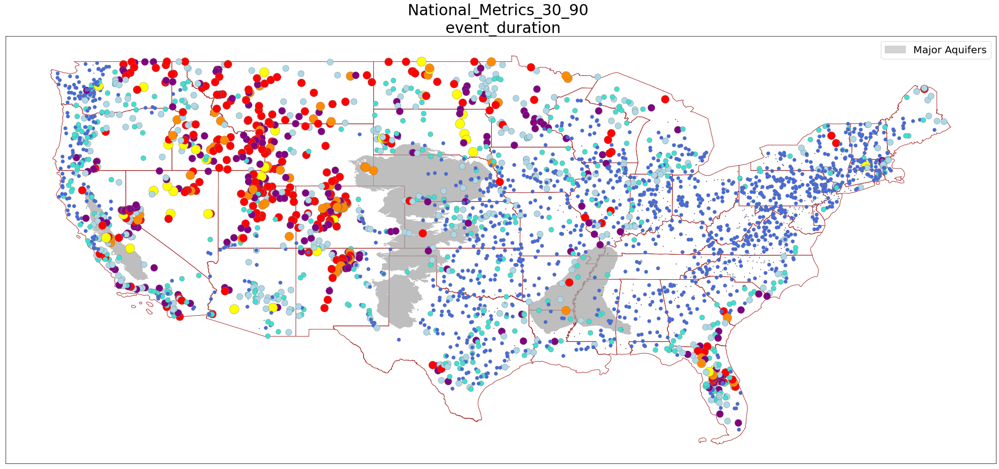

In [637]:
fig, ax = plt.subplots(figsize=(35, 35))
plt.title(f'{dataset[:-5]} \n {metric}', loc='center', fontsize=30)

# Lower-48 Plot
fn.plot_lower_48(ax)

# HUC4 Region Plot
'''for root, dirs, files in os.walk(aquifer.wb_dir):
    #print(root, dirs, files)
    if os.path.basename(root).startswith('NHD_H_'):
        if aquifer.wb_shapefiles in files:
            shapefile_aq_path = os.path.join(root, aquifer.wb_shapefiles)
            ws_gdf = gpd.read_file(shapefile_aq_path)
            ws_gdf = ws_gdf.to_crs(4269)
            ws_gdf.plot(ax=ax, edgecolor='blue', alpha=0.30, linewidth=0.5)'''

# Plot aquifers
high_plains_gdf = get_aquifer_gdf(cl.high_plains_aquifer)
high_plains_gdf.plot(ax=ax, edgecolor='none', facecolor='darkgrey', linewidth=1.25, alpha=0.75)

central_valley_gdf = get_aquifer_gdf(cl.central_valley_aquifer)
central_valley_gdf.plot(ax=ax, edgecolor='none', facecolor='darkgrey', linewidth=1.25, alpha=0.75)

meras_gdf = get_aquifer_gdf(cl.upper_clairborne_aquifer)
meras_gdf.plot(ax=ax, edgecolor='none', facecolor='darkgrey', linewidth=1.25, alpha=0.75)

# xmin, ymin, xmax, ymax = aq_gdf.total_bounds
# padding = 2.0
# xmin -= padding
# ymin -= padding
# xmax += padding
# ymax += padding

# aq_gdf.plot(ax=ax, edgecolor='red', facecolor='none', linewidth=1.25)
# ax.set_xlim(xmin, xmax)
# ax.set_ylim(ymin, ymax)

# Convert decimal lat/long to geo points
df_valid_geo = df_valid.reset_index()
geo_df = fn.convert_geometry(df_valid_geo)
geo_df.crs = 4269
geo_df = geo_df.merge(df_valid_geo, how='left', left_index=True, right_index=True)
#geo_df.dropna(subset=[metric+'_bin'], inplace=True)

# Set colorbar limits and theme using undivided dataset so that scale is static
#cmap, mappable = fn.scale_colorbar(df_valid, metric)
#div = make_axes_locatable(ax)
#cax = div.append_axes("bottom", size="5%", pad=0.05)

# Watergauges plot - colormap
#bx = geo_df.plot(ax=ax, column='inter_annual', markersize=300, marker='.', cmap=cmap, edgecolor='black', linewidth=1, alpha=0.75)
#cbx = plt.colorbar(mappable, cax=cax, pad=0.05, aspect=25, orientation='horizontal', alpha=1.0)
#cbx.set_label(fn.FLOW_METRIC_UNITS[metric])

# Watergages plot - marker size
bx = geo_df.plot(ax=ax, markersize=geo_df[metric+'_bin'], marker='.', 
                 color=[bin_colors[bin_val] for bin_val in geo_df[metric+'_bin']], linewidth=0.5, alpha=1.0, edgecolor='grey') #column=metric
#cbx = plt.colorbar(mappable, cax=cax, pad=0.05, aspect=25, orientation='horizontal', alpha=1.0)
#cbx.set_label(fn.FLOW_METRIC_UNITS[metric])

ax.set_yticks([])
ax.set_xticks([])

# Plot legend
#handles = []  # Store handles for legend
#labels = []   # Store labels for legend
patch = Patch(color='darkgrey', alpha=0.5)  # Add the handle for legend
label = 'Major Aquifers'  # Add the label for legend
ax.legend([patch], [label], loc='upper right', fontsize=20)

# Save images if they don't exist or if overwrite is True
if save_img:
    img_path = f'Saved_Visuals/{dataset[:-5]}_{metric}.png'
    fn.save_plot_as_image(img_path, overwrite)
    
plt.savefig(f'Saved_Visuals/hyd201b_presentation/{dataset[:-5]}_{metric}.png', bbox_inches='tight')

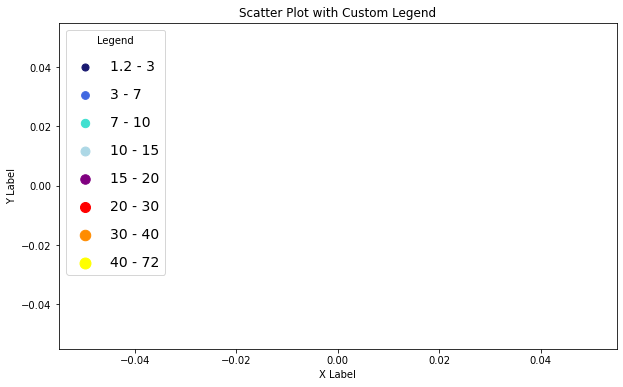

In [638]:
import matplotlib.patches as mpatches

# Define bin values and corresponding colors
bin_values = [bin_value_1, bin_value_2, bin_value_3, bin_value_4, bin_value_5, bin_value_6, bin_value_7, bin_value_8]
bin_colors = ['midnightblue', 'royalblue', 'turquoise', 'lightblue', 'purple', 'red', 'darkorange', 'yellow']

# Define bin ranges
bin_ranges = [(1.2, bin_1), (bin_1, bin_2), (bin_2, bin_3), (bin_3, bin_4), (bin_4, bin_5), (bin_5, bin_6), (bin_6, bin_7), (bin_7, bin_8)]

# Define marker sizes corresponding to bin values
marker_sizes = [50, 60, 70, 80, 90, 100, 110, 120]

# Plot dummy points for the legend
plt.figure(figsize=(10, 6))
for i in range(len(bin_values)):
    plt.scatter([], [], c=bin_colors[i], s=marker_sizes[i], label=f'{bin_ranges[i][0]} - {bin_ranges[i][1]}')

# Create custom legend with markers, sizes, bin ranges, and colors
plt.legend(scatterpoints=1, frameon=True, labelspacing=1, title='Legend', loc='upper left', fontsize=14)

plt.xlabel('X Label')
plt.ylabel('Y Label')
plt.title('Scatter Plot with Custom Legend')

plt.savefig(f'Saved_Visuals/hyd201b_presentation/{dataset[:-5]}_{metric}_legend.png', bbox_inches='tight')

plt.show()

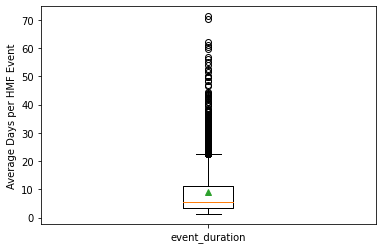

count    3367.000000
mean        8.957354
std         8.403287
min         1.290653
25%         3.550532
50%         5.495949
75%        11.156908
max        71.290842
Name: event_duration, dtype: float64

In [639]:
def plot_hmf_metric_boxplot(df, metric):
    plt.boxplot(df[metric], showmeans=True)
    #print(boxplot['fliers'])
    plt.xticks(ticks=[1], labels=[f'{metric}'])
    plt.ylabel(fn.FLOW_METRIC_UNITS[metric])
    plt.show()
    return

def get_boxplot_outliers(df, metric):
    boxplot = plt.boxplot(df[metric], showmeans=True)
    plt.xticks(ticks=[1], labels=[f'{metric}'])
    plt.ylabel(fn.FLOW_METRIC_UNITS[metric])
    plt.show()
    
    # Extract outliers
    outliers = [flier.get_ydata() for flier in boxplot['fliers']] # note: boxplot['fliers'] is a graphical object
    # Flatten the outliers list
    outliers = [item for sublist in outliers for item in sublist]
    outlier_site_nos = df.loc[df[metric].isin(outliers), 'site_no']
    return outliers, outlier_site_nos

# All HMF metrics
#for metric in metric_list:
#    plot_hmf_metric_boxplot(df_natl_30_90, metric)

# Singular HMF metric
#plot_hmf_metric_boxplot(df_natl_30_90, metric)
outliers, outlier_site_nos = get_boxplot_outliers(df_valid, metric)
df_valid[metric].describe()

<hr>

## Plot HMF metrics - Central Valley Aquifer

In [899]:
# Load dataset
data_range = 30
percentile = 90
folder = 'National_Metrics'
dataset = f'National_Metrics_{data_range}_{percentile}.xlsx'
datapath = f'Prelim_Data/{folder}/{dataset}'
lower_48_shp_path = 'ShapeFiles/Lower48/lower48.shp'

df_metrics = pd.read_excel(datapath, sheet_name='site_metrics')
df_valid = df_metrics[df_metrics['valid'] == True]

In [900]:
# Select aquifer
aquifer = cl.central_valley_aquifer
aquifer_name = 'central_valley'
df_valid = df_valid[df_valid['huc4_code'].isin(aquifer.huc4s)]

In [906]:
import pickle
sites_cv = df_valid['site_no'].to_list()

with open("test", "wb") as fp:
    pickle.dump(sites_cv, fp)

### Annual HMF

In [770]:
# Metric to be plotted where metrics are column names from the dataset
metric = 'annual_hmf'

# True if you want to overwrite current images
overwrite = False
save_img = False

In [771]:
# Annual HMF 
bin_1 = 0.2
bin_2 = 0.7
bin_3 = 1.6
bin_4 = 3.0
bin_5 = 6.0
bin_6 = 14.1

bin_value_1 = 100
bin_value_2 = 500
bin_value_3 = 1000
bin_value_4 = 1500
bin_value_5 = 2000
bin_value_6 = 5000

for idx, value in df_valid[metric].iteritems():
    if value >= 0 and value < bin_1:
        df_valid.at[idx, metric+'_bin'] = bin_value_1
    elif value >= bin_1 and value < bin_2:
        df_valid.at[idx, metric+'_bin'] = bin_value_2
    elif value >= bin_2 and value < bin_3:
        df_valid.at[idx, metric+'_bin'] = bin_value_3
    elif value >= bin_3 and value < bin_4:
        df_valid.at[idx, metric+'_bin'] = bin_value_4
    elif value >= bin_4 and value < bin_5:
        df_valid.at[idx, metric+'_bin'] = bin_value_5
    elif value >= bin_5 and value < bin_6:
        df_valid.at[idx, metric+'_bin'] = bin_value_6

#print(df_valid['annual_hmf_bin'])
#print(df_valid['annual_hmf'])

bin_colors = {
    bin_value_1: 'midnightblue',
    bin_value_2: 'royalblue',
    bin_value_3: 'turquoise',
    bin_value_4: 'lightgreen',
    bin_value_5: 'yellow',
    bin_value_6: 'darkorange'
}

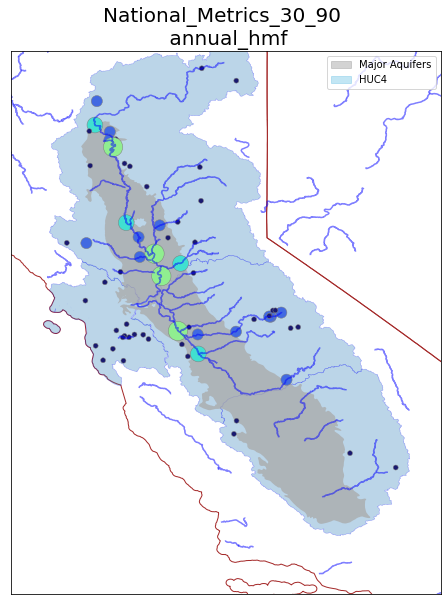

In [772]:
fig, ax = plt.subplots(figsize=(10, 10))
plt.title(f'{dataset[:-5]} \n {metric}', loc='center', fontsize=20)

# Lower-48 Plot
fn.plot_lower_48(ax)

# Plot streams
filepath = 'C:\\Users\\kondr\\Documents\\GitHub\\DahlkeLab_LAWR'
folder = 'Streams_us'
file = 'us_streams.shp'
shapefile_path = f'{filepath}\\ShapeFiles\\{folder}\\{file}'
st = gpd.read_file(shapefile_path)
#st = st.to_crs(epsg=4269)
st_plot = st.plot(ax=ax, edgecolor='blue', alpha = 0.5, legend=True)

# HUC4 Region Plot
for root, dirs, files in os.walk(aquifer.wb_dir):
    #print(root, dirs, files)
    if os.path.basename(root).startswith('NHD_H_'):
        if aquifer.wb_shapefiles in files:
            shapefile_aq_path = os.path.join(root, aquifer.wb_shapefiles)
            ws_gdf = gpd.read_file(shapefile_aq_path)
            ws_gdf = ws_gdf.to_crs(epsg=4269)
            ws_gdf.plot(ax=ax, edgecolor='blue', alpha=0.30, linewidth=0.5)

# Plot aquifers
high_plains_gdf = get_aquifer_gdf(cl.high_plains_aquifer)
high_plains_gdf.plot(ax=ax, edgecolor='none', facecolor='darkgrey', linewidth=1.25, alpha=0.75)

central_valley_gdf = get_aquifer_gdf(cl.central_valley_aquifer)
central_valley_gdf.plot(ax=ax, edgecolor='none', facecolor='darkgrey', linewidth=1.25, alpha=0.75)

meras_gdf = get_aquifer_gdf(cl.upper_clairborne_aquifer)
meras_gdf.plot(ax=ax, edgecolor='none', facecolor='darkgrey', linewidth=1.25, alpha=0.75)

xmin, ymin, xmax, ymax = central_valley_gdf.total_bounds
padding = 1.0
xmin -= padding
ymin -= padding
xmax += padding
ymax += padding

#aq_gdf.plot(ax=ax, edgecolor='red', facecolor='none', linewidth=1.25)
ax.set_xlim(xmin, xmax)
ax.set_ylim(ymin, ymax)

# Convert decimal lat/long to geo points
df_valid_geo = df_valid.reset_index()
geo_df = fn.convert_geometry(df_valid_geo)
geo_df.crs = 4269
geo_df = geo_df.merge(df_valid_geo, how='left', left_index=True, right_index=True)
geo_df.dropna(subset=[metric+'_bin'], inplace=True)

# Set colorbar limits and theme using undivided dataset so that scale is static
#cmap, mappable = fn.scale_colorbar(df_valid, metric)
#div = make_axes_locatable(ax)
#cax = div.append_axes("bottom", size="5%", pad=0.05)

# Watergauges plot - colormap
#bx = geo_df.plot(ax=ax, column='inter_annual', markersize=300, marker='.', cmap=cmap, edgecolor='black', linewidth=1, alpha=0.75)
#cbx = plt.colorbar(mappable, cax=cax, pad=0.05, aspect=25, orientation='horizontal', alpha=1.0)
#cbx.set_label(fn.FLOW_METRIC_UNITS[metric])

# Watergages plot - marker size
bx = geo_df.plot(ax=ax, markersize=geo_df[metric+'_bin'], marker='.', 
                 color=[bin_colors[bin_val] for bin_val in geo_df[metric+'_bin']], linewidth=0.5, alpha=1.0, edgecolor='grey') #column=metric
#cbx = plt.colorbar(mappable, cax=cax, pad=0.05, aspect=25, orientation='horizontal', alpha=1.0)
#cbx.set_label(fn.FLOW_METRIC_UNITS[metric])

ax.set_yticks([])
ax.set_xticks([])

# Plot legend
handles = []  # Store handles for legend
labels = []   # Store labels for legend
handles.extend([Patch(color='darkgrey', alpha=0.5), Patch(color='skyblue', alpha=0.5)])  # Add the handle for legend
labels.extend(['Major Aquifers', 'HUC4'])  # Add the label for legend
ax.legend(handles, labels, loc='upper right', fontsize=10)

# Save images if they don't exist or if overwrite is True
if save_img:
    img_path = f'Saved_Visuals/{dataset[:-5]}_{metric}.png'
    fn.save_plot_as_image(img_path, overwrite)

plt.savefig(f'Saved_Visuals/hyd201b_presentation/{aquifer_name}_{metric}.png', bbox_inches='tight')

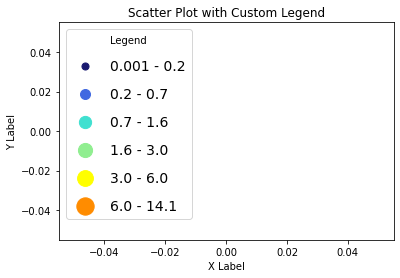

In [666]:
import matplotlib.patches as mpatches

# Define bin values and corresponding colors
bin_values = [bin_value_1, bin_value_2, bin_value_3, bin_value_4, bin_value_5, bin_value_6]
bin_colors = ['midnightblue', 'royalblue', 'turquoise', 'lightgreen', 'yellow', 'darkorange']

# Define bin ranges
bin_ranges = [(0.001, bin_1), (bin_1, bin_2), (bin_2, bin_3), (bin_3, bin_4), (bin_4, bin_5), (bin_5, bin_6)]

# Define marker sizes corresponding to bin values
marker_sizes = [50, 100, 150, 200, 250, 300]

# Plot dummy points for the legend
for i in range(len(bin_values)):
    plt.scatter([], [], c=bin_colors[i], s=marker_sizes[i], label=f'{bin_ranges[i][0]} - {bin_ranges[i][1]}')

# Create custom legend with markers, sizes, bin ranges, and colors
plt.legend(scatterpoints=1, frameon=True, labelspacing=1, title='Legend', loc='upper left', fontsize=14)

plt.xlabel('X Label')
plt.ylabel('Y Label')
plt.title('Scatter Plot with Custom Legend')
plt.savefig(f'Saved_Visuals/hyd201b_presentation/{aquifer_name}_{metric}_legend.png', bbox_inches='tight')
plt.show()

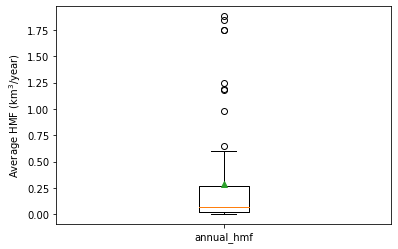

count    67.000000
mean      0.286369
std       0.480800
min       0.001376
25%       0.020915
50%       0.072782
75%       0.267644
max       1.881519
Name: annual_hmf, dtype: float64

In [667]:
def plot_hmf_metric_boxplot(df, metric):
    plt.boxplot(df[metric], showmeans=True)
    #print(boxplot['fliers'])
    plt.xticks(ticks=[1], labels=[f'{metric}'])
    plt.ylabel(fn.FLOW_METRIC_UNITS[metric])
    plt.show()
    return

def get_boxplot_outliers(df, metric):
    boxplot = plt.boxplot(df[metric], showmeans=True)
    plt.xticks(ticks=[1], labels=[f'{metric}'])
    plt.ylabel(fn.FLOW_METRIC_UNITS[metric])
    plt.show()
    
    # Extract outliers
    outliers = [flier.get_ydata() for flier in boxplot['fliers']] # note: boxplot['fliers'] is a graphical object
    # Flatten the outliers list
    outliers = [item for sublist in outliers for item in sublist]
    outlier_site_nos = df.loc[df[metric].isin(outliers), 'site_no']
    return outliers, outlier_site_nos

# All HMF metrics
#for metric in metric_list:
#    plot_hmf_metric_boxplot(df_natl_30_90, metric)

# Singular HMF metric
#plot_hmf_metric_boxplot(df_natl_30_90, metric)
outliers, outlier_site_nos = get_boxplot_outliers(df_valid, metric)
df_valid[metric].describe()

In [668]:
df_valid_cv = df_valid.sort_values(by='annual_hmf')
df_valid_cv.tail(10)

,site_no,analyze_start,analyze_end,analyze_range,quantile,valid,missing_data%,threshold,hmf_years,annual_hmf,...,dec_long_va,data_start,data_end,total_record,state,huc2_code,huc4_code,aquifer,HCDN_2009,annual_hmf_bin
3779,11421000,1990-10-01,2020-09-30,30,0.9,True,0,5250.0,24,0.599056,...,-121.524965,1943-10-01,2020-09-30,77.0,CA,18,1802,NaN,False,500.0
3737,11251000,1990-10-01,2020-09-30,30,0.9,True,0,1360.0,14,0.643850,...,-119.724312,1907-10-01,2020-09-30,113.0,CA,18,1804,NaN,False,500.0
3783,11446500,1990-10-01,2020-09-30,30,0.9,True,0,7170.0,18,0.984801,...,-121.227726,1904-10-01,2020-09-30,116.0,CA,18,1802,NaN,False,1000.0
3773,11389500,1990-10-01,2020-09-30,30,0.9,True,0,23400.0,27,1.181053,...,-122.000251,1921-04-11,2020-09-30,99.5,CA,18,1802,NaN,False,1000.0
3742,11274000,1990-10-01,2020-09-30,30,0.9,True,0,3873.0,13,1.187073,...,-120.977150,1912-05-01,2020-09-30,108.4,CA,18,1804,NaN,False,1000.0
3764,11370500,1990-10-01,2020-09-30,30,0.9,True,0,14800.0,22,1.252091,...,-122.444455,1938-10-01,2020-09-30,82.0,CA,18,1802,NaN,False,1000.0
4272,11447650,1990-10-01,2020-09-30,30,0.9,True,0,52600.0,20,1.750000,...,-121.501617,NaT,NaT,NaN,CA,18,1802,NaN,False,1500.0
3781,11425500,1990-10-01,2020-09-30,30,0.9,True,0,41100.0,26,1.755173,...,-121.598293,1929-10-01,2020-09-30,91.0,CA,18,1802,NaN,False,1500.0
3769,11377100,1990-10-01,2020-09-30,30,0.9,True,0,17600.0,28,1.847741,...,-122.186665,1900-10-01,2020-09-30,120.0,CA,18,1802,NaN,False,1500.0
3758,11303500,1990-10-01,2020-09-30,30,0.9,True,0,10500.0,12,1.881519,...,-121.266329,1923-10-01,2020-09-30,97.0,CA,18,1804,NaN,False,1500.0


### Annual duration

In [809]:
# Metric to be plotted where metrics are column names from the dataset
metric = 'annual_duration' #'annual_hmf'

# True if you want to overwrite current images
overwrite = False
save_img = False

In [810]:
# Annual duration
bin_1 = 20
bin_2 = 30
bin_3 = 35
bin_4 = 40
bin_5 = 45
bin_6 = 55
bin_7 = 75
bin_8 = 157

bin_value_1 = 10
bin_value_2 = 200
bin_value_3 = 400
bin_value_4 = 600
bin_value_5 = 800
bin_value_6 = 1000
bin_value_7 = 1200
bin_value_8 = 1400

for idx, value in df_valid[metric].iteritems():
    if value >= 0 and value < bin_1:
        df_valid.at[idx, metric+'_bin'] = bin_value_1
    elif value >= bin_1 and value < bin_2:
        df_valid.at[idx, metric+'_bin'] = bin_value_2
    elif value >= bin_2 and value < bin_3:
        df_valid.at[idx, metric+'_bin'] = bin_value_3
    elif value >= bin_3 and value < bin_4:
        df_valid.at[idx, metric+'_bin'] = bin_value_4
    elif value >= bin_4 and value < bin_5:
        df_valid.at[idx, metric+'_bin'] = bin_value_5
    elif value >= bin_5 and value < bin_6:
        df_valid.at[idx, metric+'_bin'] = bin_value_6
    elif value >= bin_6 and value < bin_7:
        df_valid.at[idx, metric+'_bin'] = bin_value_7
    elif value >= bin_7 and value < bin_8:
        df_valid.at[idx, metric+'_bin'] = bin_value_8
        
#print(df_valid['annual_hmf_bin'])
#print(df_valid['annual_hmf'])

bin_colors = {
    bin_value_1: 'midnightblue',
    bin_value_2: 'royalblue',
    bin_value_3: 'turquoise',
    bin_value_4: 'lightblue',
    bin_value_5: 'purple',
    bin_value_6: 'red',
    bin_value_7: 'darkorange',
    bin_value_8: 'yellow'
}

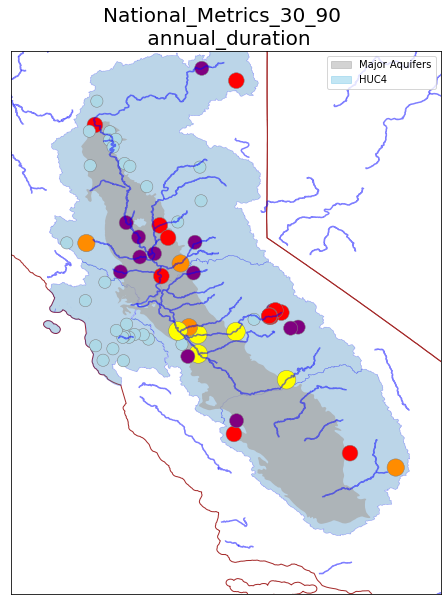

In [811]:
fig, ax = plt.subplots(figsize=(10, 10))
plt.title(f'{dataset[:-5]} \n {metric}', loc='center', fontsize=20)

# Lower-48 Plot
fn.plot_lower_48(ax)

# Plot streams
filepath = 'C:\\Users\\kondr\\Documents\\GitHub\\DahlkeLab_LAWR'
folder = 'Streams_us'
file = 'us_streams.shp'
shapefile_path = f'{filepath}\\ShapeFiles\\{folder}\\{file}'
st = gpd.read_file(shapefile_path)
#st = st.to_crs(epsg=4269)
st_plot = st.plot(ax=ax, edgecolor='blue', alpha = 0.5, legend=True)

# HUC4 Region Plot
for root, dirs, files in os.walk(aquifer.wb_dir):
    #print(root, dirs, files)
    if os.path.basename(root).startswith('NHD_H_'):
        if aquifer.wb_shapefiles in files:
            shapefile_aq_path = os.path.join(root, aquifer.wb_shapefiles)
            ws_gdf = gpd.read_file(shapefile_aq_path)
            ws_gdf = ws_gdf.to_crs(epsg=4269)
            ws_gdf.plot(ax=ax, edgecolor='blue', alpha=0.30, linewidth=0.5)

# Plot aquifers
high_plains_gdf = get_aquifer_gdf(cl.high_plains_aquifer)
high_plains_gdf.plot(ax=ax, edgecolor='none', facecolor='darkgrey', linewidth=1.25, alpha=0.75)

central_valley_gdf = get_aquifer_gdf(cl.central_valley_aquifer)
central_valley_gdf.plot(ax=ax, edgecolor='none', facecolor='darkgrey', linewidth=1.25, alpha=0.75)

meras_gdf = get_aquifer_gdf(cl.upper_clairborne_aquifer)
meras_gdf.plot(ax=ax, edgecolor='none', facecolor='darkgrey', linewidth=1.25, alpha=0.75)

xmin, ymin, xmax, ymax = central_valley_gdf.total_bounds
padding = 1.0
xmin -= padding
ymin -= padding
xmax += padding
ymax += padding

# aq_gdf.plot(ax=ax, edgecolor='red', facecolor='none', linewidth=1.25)
ax.set_xlim(xmin, xmax)
ax.set_ylim(ymin, ymax)

# Convert decimal lat/long to geo points
df_valid_geo = df_valid.reset_index()
geo_df = fn.convert_geometry(df_valid_geo)
geo_df.crs = 4269
geo_df = geo_df.merge(df_valid_geo, how='left', left_index=True, right_index=True)
geo_df.dropna(subset=[metric+'_bin'], inplace=True)

# Set colorbar limits and theme using undivided dataset so that scale is static
#cmap, mappable = fn.scale_colorbar(df_valid, metric)
#div = make_axes_locatable(ax)
#cax = div.append_axes("bottom", size="5%", pad=0.05)

# Watergauges plot - colormap
#bx = geo_df.plot(ax=ax, column='inter_annual', markersize=300, marker='.', cmap=cmap, edgecolor='black', linewidth=1, alpha=0.75)
#cbx = plt.colorbar(mappable, cax=cax, pad=0.05, aspect=25, orientation='horizontal', alpha=1.0)
#cbx.set_label(fn.FLOW_METRIC_UNITS[metric])

# Watergages plot - marker size
bx = geo_df.plot(ax=ax, markersize=geo_df[metric+'_bin'], marker='.', 
                 color=[bin_colors[bin_val] for bin_val in geo_df[metric+'_bin']], linewidth=0.5, alpha=1.0, edgecolor='grey') #column=metric
#cbx = plt.colorbar(mappable, cax=cax, pad=0.05, aspect=25, orientation='horizontal', alpha=1.0)
#cbx.set_label(fn.FLOW_METRIC_UNITS[metric])

ax.set_yticks([])
ax.set_xticks([])

# Plot legend
handles = []  # Store handles for legend
labels = []   # Store labels for legend
handles.extend([Patch(color='darkgrey', alpha=0.5), Patch(color='skyblue', alpha=0.5)])  # Add the handle for legend
labels.extend(['Major Aquifers', 'HUC4'])  # Add the label for legend
ax.legend(handles, labels, loc='upper right', fontsize=10)

# Save images if they don't exist or if overwrite is True
if save_img:
    img_path = f'Saved_Visuals/{dataset[:-5]}_{metric}.png'
    fn.save_plot_as_image(img_path, overwrite)

plt.savefig(f'Saved_Visuals/hyd201b_presentation/{aquifer_name}_{metric}.png', bbox_inches='tight')

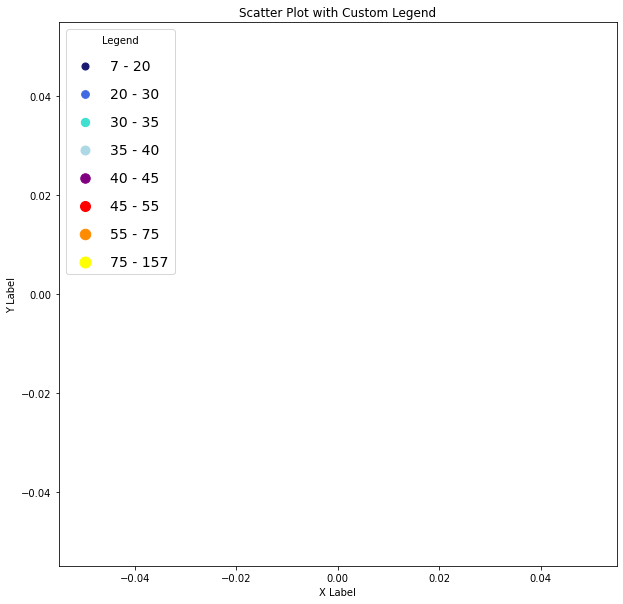

In [812]:
import matplotlib.patches as mpatches

# Define bin values and corresponding colors
bin_values = [bin_value_1, bin_value_2, bin_value_3, bin_value_4, bin_value_5, bin_value_6, bin_value_7, bin_value_8]
bin_colors = ['midnightblue', 'royalblue', 'turquoise', 'lightblue', 'purple', 'red', 'darkorange', 'yellow']

# Define bin ranges
bin_ranges = [(7, bin_1), (bin_1, bin_2), (bin_2, bin_3), (bin_3, bin_4), (bin_4, bin_5), (bin_5, bin_6), (bin_6, bin_7), (bin_7, bin_8)]

# Define marker sizes corresponding to bin values
marker_sizes = [50, 60, 70, 80, 90, 100, 110, 120]

# Plot dummy points for the legend
plt.figure(figsize=(10, 10))
for i in range(len(bin_values)):
    plt.scatter([], [], c=bin_colors[i], s=marker_sizes[i], label=f'{bin_ranges[i][0]} - {bin_ranges[i][1]}')

# Create custom legend with markers, sizes, bin ranges, and colors
plt.legend(scatterpoints=1, frameon=True, labelspacing=1, title='Legend', loc='upper left', fontsize=14)

plt.xlabel('X Label')
plt.ylabel('Y Label')
plt.title('Scatter Plot with Custom Legend')

plt.savefig(f'Saved_Visuals/hyd201b_presentation/{dataset[:-5]}_{metric}_legend.png', bbox_inches='tight')

plt.show()

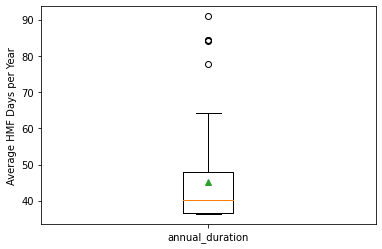

count    67.000000
mean     45.232667
std      13.099989
min      36.333333
25%      36.533333
50%      40.333333
75%      47.871542
max      90.916667
Name: annual_duration, dtype: float64

In [813]:
def plot_hmf_metric_boxplot(df, metric):
    plt.boxplot(df[metric], showmeans=True)
    #print(boxplot['fliers'])
    plt.xticks(ticks=[1], labels=[f'{metric}'])
    plt.ylabel(fn.FLOW_METRIC_UNITS[metric])
    plt.show()
    return

def get_boxplot_outliers(df, metric):
    boxplot = plt.boxplot(df[metric], showmeans=True)
    plt.xticks(ticks=[1], labels=[f'{metric}'])
    plt.ylabel(fn.FLOW_METRIC_UNITS[metric])
    plt.show()
    
    # Extract outliers
    outliers = [flier.get_ydata() for flier in boxplot['fliers']] # note: boxplot['fliers'] is a graphical object
    # Flatten the outliers list
    outliers = [item for sublist in outliers for item in sublist]
    outlier_site_nos = df.loc[df[metric].isin(outliers), 'site_no']
    return outliers, outlier_site_nos

# All HMF metrics
#for metric in metric_list:
#    plot_hmf_metric_boxplot(df_natl_30_90, metric)

# Singular HMF metric
#plot_hmf_metric_boxplot(df_natl_30_90, metric)
outliers, outlier_site_nos = get_boxplot_outliers(df_valid, metric)
df_valid[metric].describe()

### Inter-annaul frequency

In [671]:
# Metric to be plotted where metrics are column names from the dataset
metric = 'inter_annual%' #'annual_hmf'

# True if you want to overwrite current images
overwrite = False
save_img = False

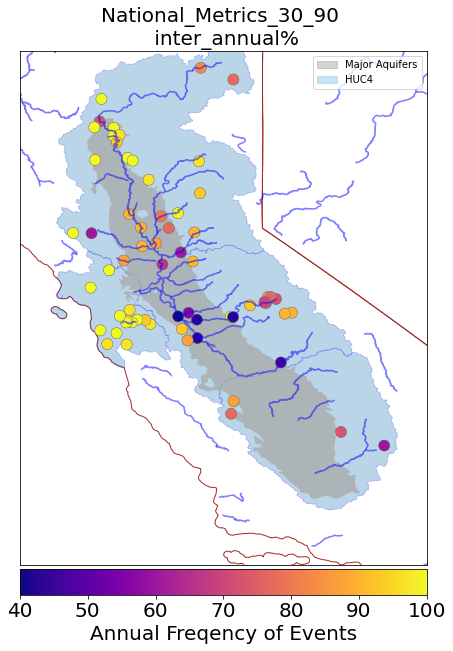

In [673]:
fig, ax = plt.subplots(figsize=(10, 10))
plt.title(f'{dataset[:-5]} \n {metric}', loc='center', fontsize=20)

# Lower-48 Plot
fn.plot_lower_48(ax)

# Plot streams
filepath = 'C:\\Users\\kondr\\Documents\\GitHub\\DahlkeLab_LAWR'
folder = 'Streams_us'
file = 'us_streams.shp'
shapefile_path = f'{filepath}\\ShapeFiles\\{folder}\\{file}'
st = gpd.read_file(shapefile_path)
#st = st.to_crs(epsg=4269)
st_plot = st.plot(ax=ax, edgecolor='blue', alpha = 0.5, legend=True)

# HUC4 Region Plot
for root, dirs, files in os.walk(aquifer.wb_dir):
    #print(root, dirs, files)
    if os.path.basename(root).startswith('NHD_H_'):
        if aquifer.wb_shapefiles in files:
            shapefile_aq_path = os.path.join(root, aquifer.wb_shapefiles)
            ws_gdf = gpd.read_file(shapefile_aq_path)
            ws_gdf = ws_gdf.to_crs(epsg=4269)
            ws_gdf.plot(ax=ax, edgecolor='blue', alpha=0.30, linewidth=0.5)

# Plot aquifers
high_plains_gdf = get_aquifer_gdf(cl.high_plains_aquifer)
high_plains_gdf.plot(ax=ax, edgecolor='none', facecolor='darkgrey', linewidth=1.25, alpha=0.75)

central_valley_gdf = get_aquifer_gdf(cl.central_valley_aquifer)
central_valley_gdf.plot(ax=ax, edgecolor='none', facecolor='darkgrey', linewidth=1.25, alpha=0.75)

meras_gdf = get_aquifer_gdf(cl.upper_clairborne_aquifer)
meras_gdf.plot(ax=ax, edgecolor='none', facecolor='darkgrey', linewidth=1.25, alpha=0.75)

xmin, ymin, xmax, ymax = central_valley_gdf.total_bounds
padding = 1.0
xmin -= padding
ymin -= padding
xmax += padding
ymax += padding

#aq_gdf.plot(ax=ax, edgecolor='red', facecolor='none', linewidth=1.25)
ax.set_xlim(xmin, xmax)
ax.set_ylim(ymin, ymax)

# Convert decimal lat/long to geo points
df_valid_geo = df_valid.reset_index()
geo_df = fn.convert_geometry(df_valid_geo)
geo_df.crs = 4269
geo_df = geo_df.merge(df_valid_geo, how='left', left_index=True, right_index=True)
#geo_df.dropna(subset=[metric+'_bin'], inplace=True)

# Set colorbar limits and theme using undivided dataset so that scale is static
cmap, mappable = fn.scale_colorbar(df_valid, metric, cmap='plasma')
div = make_axes_locatable(ax)
cax = div.append_axes("bottom", size="5%", pad=0.05)

# Watergauges plot - colormap
bx = geo_df.plot(ax=ax, column=metric, markersize=400, marker='.', cmap=cmap, edgecolor='black', linewidth=1, alpha=0.75)
cbx = plt.colorbar(mappable, cax=cax, pad=0.05, aspect=25, orientation='horizontal', alpha=1.0)
cbx.set_label(fn.FLOW_METRIC_UNITS[metric], fontsize=20)

# Watergages plot - marker size
bx = geo_df.plot(ax=ax, column=metric, markersize=500, marker='.', 
                 cmap='plasma', linewidth=0.5, alpha=1.0, edgecolor='grey')
cbx = plt.colorbar(mappable, cax=cax, pad=0.05, aspect=25, orientation='horizontal', alpha=1.0)
cbx.set_label(fn.FLOW_METRIC_UNITS[metric])
cbx.ax.tick_params(labelsize=20)

ax.set_yticks([])
ax.set_xticks([])

# num_ticks = 12

# # Calculate the tick positions
# tick_positions = np.linspace(0, 365, num_ticks)

# # Set the tick positions and labels on the color bar
# cbx.set_ticks(tick_positions)
# cbx.set_ticklabels([f'{tick:.2f}' for tick in tick_positions])  # Format the tick labels as desired

# Plot legend
handles = []  # Store handles for legend
labels = []   # Store labels for legend
handles.extend([Patch(color='darkgrey', alpha=0.5), Patch(color='skyblue', alpha=0.5)])  # Add the handle for legend
labels.extend(['Major Aquifers', 'HUC4'])  # Add the label for legend
ax.legend(handles, labels, loc='upper right', fontsize=15)

# Save images if they don't exist or if overwrite is True
if save_img:
    img_path = f'Saved_Visuals/{dataset[:-5]}_{metric}.png'
    fn.save_plot_as_image(img_path, overwrite)
    
plt.savefig(f'Saved_Visuals/hyd201b_presentation/{aquifer_name}_{metric}.png', bbox_inches='tight')

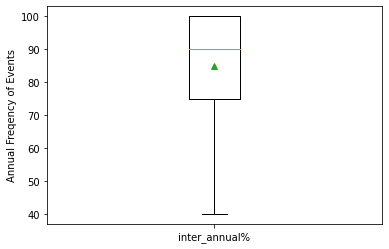

count     67.000000
mean      84.985075
std       17.151281
min       40.000000
25%       75.000000
50%       90.000000
75%      100.000000
max      100.000000
Name: inter_annual%, dtype: float64

In [674]:
def plot_hmf_metric_boxplot(df, metric):
    plt.boxplot(df[metric], showmeans=True)
    #print(boxplot['fliers'])
    plt.xticks(ticks=[1], labels=[f'{metric}'])
    plt.ylabel(fn.FLOW_METRIC_UNITS[metric])
    plt.show()
    return

def get_boxplot_outliers(df, metric):
    boxplot = plt.boxplot(df[metric], showmeans=True)
    plt.xticks(ticks=[1], labels=[f'{metric}'])
    plt.ylabel(fn.FLOW_METRIC_UNITS[metric])
    plt.show()
    
    # Extract outliers
    outliers = [flier.get_ydata() for flier in boxplot['fliers']] # note: boxplot['fliers'] is a graphical object
    # Flatten the outliers list
    outliers = [item for sublist in outliers for item in sublist]
    outlier_site_nos = df.loc[df[metric].isin(outliers), 'site_no']
    return outliers, outlier_site_nos

# All HMF metrics
#for metric in metric_list:
#    plot_hmf_metric_boxplot(df_natl_30_90, metric)

# Singular HMF metric
#plot_hmf_metric_boxplot(df_natl_30_90, metric)
outliers, outlier_site_nos = get_boxplot_outliers(df_valid, metric)
df_valid[metric].describe()

### Intra-annual

In [750]:
# Metric to be plotted where metrics are column names from the dataset
metric = 'intra_annual' #'annual_hmf'

# True if you want to overwrite current images
overwrite = False
save_img = False

In [751]:
bin_1 = 3
bin_2 = 6
bin_3 = 10
bin_4 = 15
bin_5 = 20
bin_6 = 28

bin_value_1 = 100
bin_value_2 = 500
bin_value_3 = 1000
bin_value_4 = 1500
bin_value_5 = 2000
bin_value_6 = 4000

for idx, value in df_valid[metric].iteritems():
    if value >= 0 and value < bin_1:
        df_valid.at[idx, metric+'_bin'] = bin_value_1
    elif value >= bin_1 and value < bin_2:
        df_valid.at[idx, metric+'_bin'] = bin_value_2
    elif value >= bin_2 and value < bin_3:
        df_valid.at[idx, metric+'_bin'] = bin_value_3
    elif value >= bin_3 and value < bin_4:
        df_valid.at[idx, metric+'_bin'] = bin_value_4
    elif value >= bin_4 and value < bin_5:
        df_valid.at[idx, metric+'_bin'] = bin_value_5
    elif value >= bin_5 and value <= bin_6:
        df_valid.at[idx, metric+'_bin'] = bin_value_6

#print(df_valid['annual_hmf_bin'])
#print(df_valid['annual_hmf'])

bin_colors = {
    bin_value_1: 'red',
    bin_value_2: 'darkorange',
    bin_value_3: 'yellow',
    bin_value_4: 'magenta',
    bin_value_5: 'purple',
    bin_value_6: 'royalblue'
}

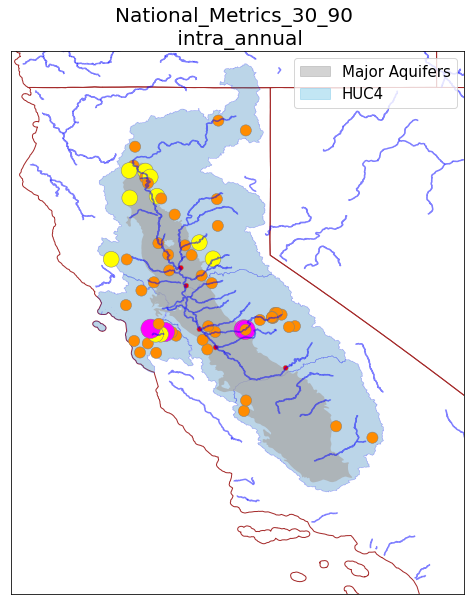

In [752]:
fig, ax = plt.subplots(figsize=(10, 10))
plt.title(f'{dataset[:-5]} \n {metric}', loc='center', fontsize=20)

# Lower-48 Plot
fn.plot_lower_48(ax)

# Plot streams
filepath = 'C:\\Users\\kondr\\Documents\\GitHub\\DahlkeLab_LAWR'
folder = 'Streams_us'
file = 'us_streams.shp'
shapefile_path = f'{filepath}\\ShapeFiles\\{folder}\\{file}'
st = gpd.read_file(shapefile_path)
#st = st.to_crs(epsg=4269)
st_plot = st.plot(ax=ax, edgecolor='blue', alpha = 0.5, legend=True)

# HUC4 Region Plot
for root, dirs, files in os.walk(aquifer.wb_dir):
    #print(root, dirs, files)
    if os.path.basename(root).startswith('NHD_H_'):
        if aquifer.wb_shapefiles in files:
            shapefile_aq_path = os.path.join(root, aquifer.wb_shapefiles)
            ws_gdf = gpd.read_file(shapefile_aq_path)
            ws_gdf = ws_gdf.to_crs(epsg=4269)
            ws_gdf.plot(ax=ax, edgecolor='blue', alpha=0.30, linewidth=0.5)

# Plot aquifers
high_plains_gdf = get_aquifer_gdf(cl.high_plains_aquifer)
high_plains_gdf.plot(ax=ax, edgecolor='none', facecolor='darkgrey', linewidth=1.25, alpha=0.75)

central_valley_gdf = get_aquifer_gdf(cl.central_valley_aquifer)
central_valley_gdf.plot(ax=ax, edgecolor='none', facecolor='darkgrey', linewidth=1.25, alpha=0.75)

meras_gdf = get_aquifer_gdf(cl.upper_clairborne_aquifer)
meras_gdf.plot(ax=ax, edgecolor='none', facecolor='darkgrey', linewidth=1.25, alpha=0.75)

xmin, ymin, xmax, ymax = central_valley_gdf.total_bounds
padding = 1.0
xmin -= padding
ymin -= padding
xmax += padding
ymax += padding

# aq_gdf.plot(ax=ax, edgecolor='red', facecolor='none', linewidth=1.25)
ax.set_xlim(xmin, xmax)
ax.set_ylim(ymin, ymax)

# Convert decimal lat/long to geo points
df_valid_geo = df_valid.reset_index()
geo_df = fn.convert_geometry(df_valid_geo)
geo_df.crs = 4269
geo_df = geo_df.merge(df_valid_geo, how='left', left_index=True, right_index=True)
geo_df.dropna(subset=[metric+'_bin'], inplace=True)

# Set colorbar limits and theme using undivided dataset so that scale is static
#cmap, mappable = fn.scale_colorbar(df_valid, metric)
#div = make_axes_locatable(ax)
#cax = div.append_axes("bottom", size="5%", pad=0.05)

# Watergauges plot - colormap
#bx = geo_df.plot(ax=ax, column='inter_annual', markersize=300, marker='.', cmap=cmap, edgecolor='black', linewidth=1, alpha=0.75)
#cbx = plt.colorbar(mappable, cax=cax, pad=0.05, aspect=25, orientation='horizontal', alpha=1.0)
#cbx.set_label(fn.FLOW_METRIC_UNITS[metric])

# Watergages plot - marker size
bx = geo_df.plot(ax=ax, markersize=geo_df[metric+'_bin'], marker='.', 
                 color=[bin_colors[bin_val] for bin_val in geo_df[metric+'_bin']], linewidth=0.5, alpha=1.0, edgecolor='grey') #column=metric
#cbx = plt.colorbar(mappable, cax=cax, pad=0.05, aspect=25, orientation='horizontal', alpha=1.0)
#cbx.set_label(fn.FLOW_METRIC_UNITS[metric])

ax.set_yticks([])
ax.set_xticks([])

# Plot legend
handles = []  # Store handles for legend
labels = []   # Store labels for legend
handles.extend([Patch(color='darkgrey', alpha=0.5), Patch(color='skyblue', alpha=0.5)])  # Add the handle for legend
labels.extend(['Major Aquifers', 'HUC4'])  # Add the label for legend
ax.legend(handles, labels, loc='upper right', fontsize=15)

# Save images if they don't exist or if overwrite is True
if save_img:
    img_path = f'Saved_Visuals/{dataset[:-5]}_{metric}.png'
    fn.save_plot_as_image(img_path, overwrite)
    
plt.savefig(f'Saved_Visuals/hyd201b_presentation/{aquifer_name}_{metric}.png', bbox_inches='tight')

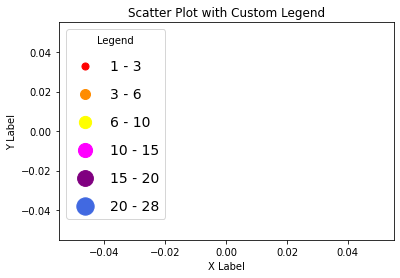

In [753]:
import matplotlib.patches as mpatches

# Define bin values and corresponding colors
bin_values = [bin_value_1, bin_value_2, bin_value_3, bin_value_4, bin_value_5, bin_value_6]
bin_colors = ['red', 'darkorange', 'yellow', 'magenta', 'purple', 'royalblue']

# Define bin ranges
bin_ranges = [(1, bin_1), (bin_1, bin_2), (bin_2, bin_3), (bin_3, bin_4), (bin_4, bin_5), (bin_5, bin_6)]

# Define marker sizes corresponding to bin values
marker_sizes = [50, 100, 150, 200, 250, 300]

# Plot dummy points for the legend
for i in range(len(bin_values)):
    plt.scatter([], [], c=bin_colors[i], s=marker_sizes[i], label=f'{bin_ranges[i][0]} - {bin_ranges[i][1]}')

# Create custom legend with markers, sizes, bin ranges, and colors
plt.legend(scatterpoints=1, frameon=True, labelspacing=1, title='Legend', loc='upper left', fontsize=14)

plt.xlabel('X Label')
plt.ylabel('Y Label')
plt.title('Scatter Plot with Custom Legend')

plt.savefig(f'Saved_Visuals/hyd201b_presentation/{dataset[:-5]}_{metric}_legend.png', bbox_inches='tight')

plt.show()

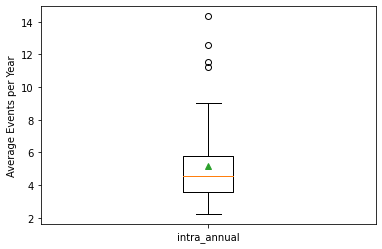

count    67.000000
mean      5.143611
std       2.402736
min       2.230769
25%       3.560386
50%       4.538462
75%       5.806034
max      14.333333
Name: intra_annual, dtype: float64

In [754]:
def plot_hmf_metric_boxplot(df, metric):
    plt.boxplot(df[metric], showmeans=True)
    #print(boxplot['fliers'])
    plt.xticks(ticks=[1], labels=[f'{metric}'])
    plt.ylabel(fn.FLOW_METRIC_UNITS[metric])
    plt.show()
    return

def get_boxplot_outliers(df, metric):
    boxplot = plt.boxplot(df[metric], showmeans=True)
    plt.xticks(ticks=[1], labels=[f'{metric}'])
    plt.ylabel(fn.FLOW_METRIC_UNITS[metric])
    plt.show()
    
    # Extract outliers
    outliers = [flier.get_ydata() for flier in boxplot['fliers']] # note: boxplot['fliers'] is a graphical object
    # Flatten the outliers list
    outliers = [item for sublist in outliers for item in sublist]
    outlier_site_nos = df.loc[df[metric].isin(outliers), 'site_no']
    return outliers, outlier_site_nos

# All HMF metrics
#for metric in metric_list:
#    plot_hmf_metric_boxplot(df_natl_30_90, metric)

# Singular HMF metric
#plot_hmf_metric_boxplot(df_natl_30_90, metric)
outliers, outlier_site_nos = get_boxplot_outliers(df_valid, metric)
df_valid[metric].describe()

### Timing

In [794]:
# Metric to be plotted where metrics are column names from the dataset
metric = 'timing' #'annual_hmf'

# True if you want to overwrite current images
overwrite = False
save_img = False

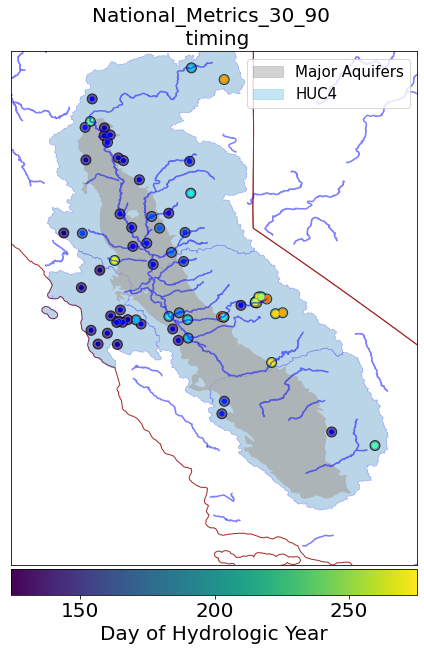

In [795]:
fig, ax = plt.subplots(figsize=(10, 10))
plt.title(f'{dataset[:-5]} \n {metric}', loc='center', fontsize=20)

# Lower-48 Plot
fn.plot_lower_48(ax)

# Plot streams
filepath = 'C:\\Users\\kondr\\Documents\\GitHub\\DahlkeLab_LAWR'
folder = 'Streams_us'
file = 'us_streams.shp'
shapefile_path = f'{filepath}\\ShapeFiles\\{folder}\\{file}'
st = gpd.read_file(shapefile_path)
#st = st.to_crs(epsg=4269)
st_plot = st.plot(ax=ax, edgecolor='blue', alpha = 0.5, legend=True)

# HUC4 Region Plot
for root, dirs, files in os.walk(aquifer.wb_dir):
    #print(root, dirs, files)
    if os.path.basename(root).startswith('NHD_H_'):
        if aquifer.wb_shapefiles in files:
            shapefile_aq_path = os.path.join(root, aquifer.wb_shapefiles)
            ws_gdf = gpd.read_file(shapefile_aq_path)
            ws_gdf = ws_gdf.to_crs(epsg=4269)
            ws_gdf.plot(ax=ax, edgecolor='blue', alpha=0.30, linewidth=0.5)

# Plot aquifers
high_plains_gdf = get_aquifer_gdf(cl.high_plains_aquifer)
high_plains_gdf.plot(ax=ax, edgecolor='none', facecolor='darkgrey', linewidth=1.25, alpha=0.75)

central_valley_gdf = get_aquifer_gdf(cl.central_valley_aquifer)
central_valley_gdf.plot(ax=ax, edgecolor='none', facecolor='darkgrey', linewidth=1.25, alpha=0.75)

meras_gdf = get_aquifer_gdf(cl.upper_clairborne_aquifer)
meras_gdf.plot(ax=ax, edgecolor='none', facecolor='darkgrey', linewidth=1.25, alpha=0.75)

xmin, ymin, xmax, ymax = central_valley_gdf.total_bounds
padding = 1.0
xmin -= padding
ymin -= padding
xmax += padding
ymax += padding

# aq_gdf.plot(ax=ax, edgecolor='red', facecolor='none', linewidth=1.25)
ax.set_xlim(xmin, xmax)
ax.set_ylim(ymin, ymax)

# Convert decimal lat/long to geo points
df_valid_geo = df_valid.reset_index()
geo_df = fn.convert_geometry(df_valid_geo)
geo_df.crs = 4269
geo_df = geo_df.merge(df_valid_geo, how='left', left_index=True, right_index=True)
#geo_df.dropna(subset=[metric+'_bin'], inplace=True)

# Set colorbar limits and theme using undivided dataset so that scale is static
cmap, mappable = fn.scale_colorbar(df_valid, metric)
div = make_axes_locatable(ax)
cax = div.append_axes("bottom", size="5%", pad=0.05)

# Watergauges plot - colormap
bx = geo_df.plot(ax=ax, column=metric, markersize=400, marker='.', cmap=cmap, edgecolor='black', linewidth=1, alpha=0.75)
cbx = plt.colorbar(mappable, cax=cax, pad=0.05, aspect=25, orientation='horizontal', alpha=1.0)
cbx.set_label(fn.FLOW_METRIC_UNITS[metric], fontsize=20)

# Watergages plot - marker size
bx = geo_df.plot(ax=ax, column=metric, markersize=geo_df[metric], marker='.', 
                 cmap='jet', linewidth=0.5, alpha=1.0, edgecolor='grey')
cbx = plt.colorbar(mappable, cax=cax, pad=0.05, aspect=25, orientation='horizontal', alpha=1.0)
cbx.set_label(fn.FLOW_METRIC_UNITS[metric])
cbx.ax.tick_params(labelsize=20)

ax.set_yticks([])
ax.set_xticks([])

# num_ticks = 12

# # Calculate the tick positions
# tick_positions = np.linspace(0, 365, num_ticks)

# # Set the tick positions and labels on the color bar
# cbx.set_ticks(tick_positions)
# cbx.set_ticklabels([f'{tick:.2f}' for tick in tick_positions])  # Format the tick labels as desired

# Plot legend
handles = []  # Store handles for legend
labels = []   # Store labels for legend
handles.extend([Patch(color='darkgrey', alpha=0.5), Patch(color='skyblue', alpha=0.5)])  # Add the handle for legend
labels.extend(['Major Aquifers', 'HUC4'])  # Add the label for legend
ax.legend(handles, labels, loc='upper right', fontsize=15)

# Save images if they don't exist or if overwrite is True
if save_img:
    img_path = f'Saved_Visuals/{dataset[:-5]}_{metric}.png'
    fn.save_plot_as_image(img_path, overwrite)
    
plt.savefig(f'Saved_Visuals/hyd201b_presentation/{aquifer_name}_{metric}.png', bbox_inches='tight')

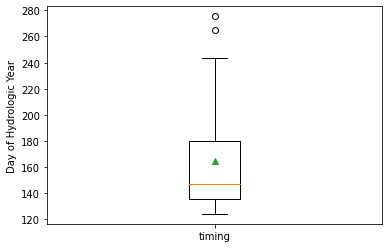

count     67.000000
mean     165.043085
std       39.713983
min      124.233333
25%      135.943678
50%      146.846154
75%      179.852564
max      275.400000
Name: timing, dtype: float64

In [796]:
def plot_hmf_metric_boxplot(df, metric):
    plt.boxplot(df[metric], showmeans=True)
    #print(boxplot['fliers'])
    plt.xticks(ticks=[1], labels=[f'{metric}'])
    plt.ylabel(fn.FLOW_METRIC_UNITS[metric])
    plt.show()
    return

def get_boxplot_outliers(df, metric):
    boxplot = plt.boxplot(df[metric], showmeans=True)
    plt.xticks(ticks=[1], labels=[f'{metric}'])
    plt.ylabel(fn.FLOW_METRIC_UNITS[metric])
    plt.show()
    
    # Extract outliers
    outliers = [flier.get_ydata() for flier in boxplot['fliers']] # note: boxplot['fliers'] is a graphical object
    # Flatten the outliers list
    outliers = [item for sublist in outliers for item in sublist]
    outlier_site_nos = df.loc[df[metric].isin(outliers), 'site_no']
    return outliers, outlier_site_nos

# All HMF metrics
#for metric in metric_list:
#    plot_hmf_metric_boxplot(df_natl_30_90, metric)

# Singular HMF metric
#plot_hmf_metric_boxplot(df_natl_30_90, metric)
outliers, outlier_site_nos = get_boxplot_outliers(df_valid, metric)
df_valid[metric].describe()

### Event HMF

In [702]:
# Metric to be plotted where metrics are column names from the dataset
metric = 'event_hmf' #'annual_hmf'

# True if you want to overwrite current images
overwrite = False
save_img = False

In [703]:
bin_1 = 0.005
bin_2 = 0.01
bin_3 = 0.1
bin_4 = 0.5
bin_5 = 1.0
bin_6 = 5.8

bin_value_1 = 100
bin_value_2 = 500
bin_value_3 = 1000
bin_value_4 = 1500
bin_value_5 = 2000
bin_value_6 = 5000

for idx, value in df_valid[metric].iteritems():
    if value >= 0 and value < bin_1:
        df_valid.at[idx, metric+'_bin'] = bin_value_1
    elif value >= bin_1 and value < bin_2:
        df_valid.at[idx, metric+'_bin'] = bin_value_2
    elif value >= bin_2 and value < bin_3:
        df_valid.at[idx, metric+'_bin'] = bin_value_3
    elif value >= bin_3 and value < bin_4:
        df_valid.at[idx, metric+'_bin'] = bin_value_4
    elif value >= bin_4 and value < bin_5:
        df_valid.at[idx, metric+'_bin'] = bin_value_5
    elif value >= bin_5 and value < bin_6:
        df_valid.at[idx, metric+'_bin'] = bin_value_6

#print(df_valid['annual_hmf_bin'])
#print(df_valid['annual_hmf'])

bin_colors = {
    bin_value_1: 'midnightblue',
    bin_value_2: 'royalblue',
    bin_value_3: 'turquoise',
    bin_value_4: 'lightgreen',
    bin_value_5: 'yellow',
    bin_value_6: 'darkorange'
}

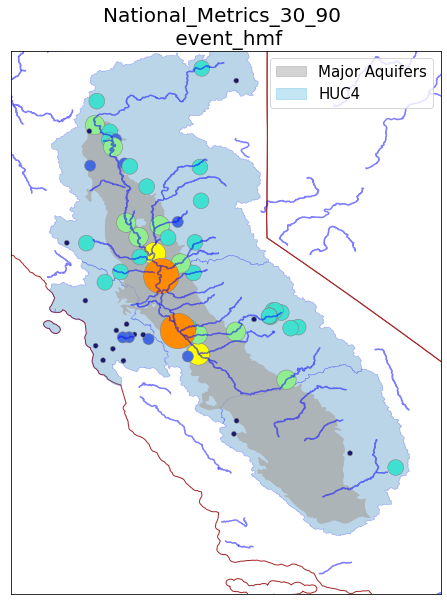

In [704]:
fig, ax = plt.subplots(figsize=(10, 10))
plt.title(f'{dataset[:-5]} \n {metric}', loc='center', fontsize=20)

# Lower-48 Plot
fn.plot_lower_48(ax)

# Plot streams
filepath = 'C:\\Users\\kondr\\Documents\\GitHub\\DahlkeLab_LAWR'
folder = 'Streams_us'
file = 'us_streams.shp'
shapefile_path = f'{filepath}\\ShapeFiles\\{folder}\\{file}'
st = gpd.read_file(shapefile_path)
#st = st.to_crs(epsg=4269)
st_plot = st.plot(ax=ax, edgecolor='blue', alpha = 0.5, legend=True)

# HUC4 Region Plot
for root, dirs, files in os.walk(aquifer.wb_dir):
    #print(root, dirs, files)
    if os.path.basename(root).startswith('NHD_H_'):
        if aquifer.wb_shapefiles in files:
            shapefile_aq_path = os.path.join(root, aquifer.wb_shapefiles)
            ws_gdf = gpd.read_file(shapefile_aq_path)
            ws_gdf = ws_gdf.to_crs(epsg=4269)
            ws_gdf.plot(ax=ax, edgecolor='blue', alpha=0.30, linewidth=0.5)

# Plot aquifers
high_plains_gdf = get_aquifer_gdf(cl.high_plains_aquifer)
high_plains_gdf.plot(ax=ax, edgecolor='none', facecolor='darkgrey', linewidth=1.25, alpha=0.75)

central_valley_gdf = get_aquifer_gdf(cl.central_valley_aquifer)
central_valley_gdf.plot(ax=ax, edgecolor='none', facecolor='darkgrey', linewidth=1.25, alpha=0.75)

meras_gdf = get_aquifer_gdf(cl.upper_clairborne_aquifer)
meras_gdf.plot(ax=ax, edgecolor='none', facecolor='darkgrey', linewidth=1.25, alpha=0.75)

xmin, ymin, xmax, ymax = central_valley_gdf.total_bounds
padding = 1.0
xmin -= padding
ymin -= padding
xmax += padding
ymax += padding

# aq_gdf.plot(ax=ax, edgecolor='red', facecolor='none', linewidth=1.25)
ax.set_xlim(xmin, xmax)
ax.set_ylim(ymin, ymax)

# Convert decimal lat/long to geo points
df_valid_geo = df_valid.reset_index()
geo_df = fn.convert_geometry(df_valid_geo)
geo_df.crs = 4269
geo_df = geo_df.merge(df_valid_geo, how='left', left_index=True, right_index=True)
geo_df.dropna(subset=[metric+'_bin'], inplace=True)

# Set colorbar limits and theme using undivided dataset so that scale is static
#cmap, mappable = fn.scale_colorbar(df_valid, metric)
#div = make_axes_locatable(ax)
#cax = div.append_axes("bottom", size="5%", pad=0.05)

# Watergauges plot - colormap
#bx = geo_df.plot(ax=ax, column='inter_annual', markersize=300, marker='.', cmap=cmap, edgecolor='black', linewidth=1, alpha=0.75)
#cbx = plt.colorbar(mappable, cax=cax, pad=0.05, aspect=25, orientation='horizontal', alpha=1.0)
#cbx.set_label(fn.FLOW_METRIC_UNITS[metric])

# Watergages plot - marker size
bx = geo_df.plot(ax=ax, markersize=geo_df[metric+'_bin'], marker='.', 
                 color=[bin_colors[bin_val] for bin_val in geo_df[metric+'_bin']], linewidth=0.5, alpha=1.0, edgecolor='grey') #column=metric
#cbx = plt.colorbar(mappable, cax=cax, pad=0.05, aspect=25, orientation='horizontal', alpha=1.0)
#cbx.set_label(fn.FLOW_METRIC_UNITS[metric])

ax.set_yticks([])
ax.set_xticks([])

# Plot legend
handles = []  # Store handles for legend
labels = []   # Store labels for legend
handles.extend([Patch(color='darkgrey', alpha=0.5), Patch(color='skyblue', alpha=0.5)])  # Add the handle for legend
labels.extend(['Major Aquifers', 'HUC4'])  # Add the label for legend
ax.legend(handles, labels, loc='upper right', fontsize=15)

# Save images if they don't exist or if overwrite is True
if save_img:
    img_path = f'Saved_Visuals/{dataset[:-5]}_{metric}.png'
    fn.save_plot_as_image(img_path, overwrite)
    
plt.savefig(f'Saved_Visuals/hyd201b_presentation/{aquifer_name}_{metric}.png', bbox_inches='tight')

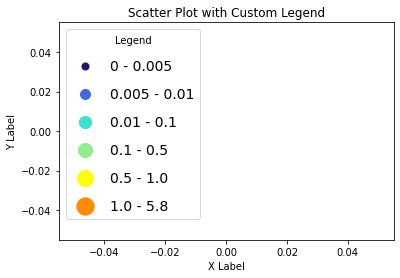

In [705]:
import matplotlib.patches as mpatches

# Define bin values and corresponding colors
bin_values = [bin_value_1, bin_value_2, bin_value_3, bin_value_4, bin_value_5, bin_value_6]
bin_colors = ['midnightblue', 'royalblue', 'turquoise', 'lightgreen', 'yellow', 'darkorange']

# Define bin ranges
bin_ranges = [(0, bin_1), (bin_1, bin_2), (bin_2, bin_3), (bin_3, bin_4), (bin_4, bin_5), (bin_5, bin_6)]

# Define marker sizes corresponding to bin values
marker_sizes = [50, 100, 150, 200, 250, 300]

# Plot dummy points for the legend
for i in range(len(bin_values)):
    plt.scatter([], [], c=bin_colors[i], s=marker_sizes[i], label=f'{bin_ranges[i][0]} - {bin_ranges[i][1]}')

# Create custom legend with markers, sizes, bin ranges, and colors
plt.legend(scatterpoints=1, frameon=True, labelspacing=1, title='Legend', loc='upper left', fontsize=14)

plt.xlabel('X Label')
plt.ylabel('Y Label')
plt.title('Scatter Plot with Custom Legend')

plt.savefig(f'Saved_Visuals/hyd201b_presentation/{dataset[:-5]}_{metric}_legend.png', bbox_inches='tight')

plt.show()

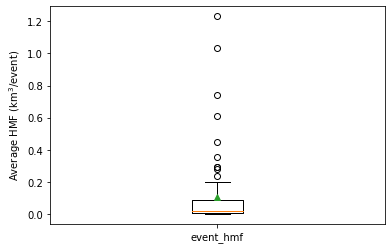

count    67.000000
mean      0.105319
std       0.231005
min       0.000239
25%       0.004133
50%       0.017010
75%       0.085535
max       1.230578
Name: event_hmf, dtype: float64

In [706]:
def plot_hmf_metric_boxplot(df, metric):
    plt.boxplot(df[metric], showmeans=True)
    #print(boxplot['fliers'])
    plt.xticks(ticks=[1], labels=[f'{metric}'])
    plt.ylabel(fn.FLOW_METRIC_UNITS[metric])
    plt.show()
    return

def get_boxplot_outliers(df, metric):
    boxplot = plt.boxplot(df[metric], showmeans=True)
    plt.xticks(ticks=[1], labels=[f'{metric}'])
    plt.ylabel(fn.FLOW_METRIC_UNITS[metric])
    plt.show()
    
    # Extract outliers
    outliers = [flier.get_ydata() for flier in boxplot['fliers']] # note: boxplot['fliers'] is a graphical object
    # Flatten the outliers list
    outliers = [item for sublist in outliers for item in sublist]
    outlier_site_nos = df.loc[df[metric].isin(outliers), 'site_no']
    return outliers, outlier_site_nos

# All HMF metrics
#for metric in metric_list:
#    plot_hmf_metric_boxplot(df_natl_30_90, metric)

# Singular HMF metric
#plot_hmf_metric_boxplot(df_natl_30_90, metric)
outliers, outlier_site_nos = get_boxplot_outliers(df_valid, metric)
df_valid[metric].describe()

### Event duration

In [725]:
# Metric to be plotted where metrics are column names from the dataset
metric = 'event_duration' #'annual_hmf'

# True if you want to overwrite current images
overwrite = False
save_img = False

In [726]:
# Event duration
bin_1 = 3
bin_2 = 7
bin_3 = 10
bin_4 = 15
bin_5 = 20
bin_6 = 30
bin_7 = 40
bin_8 = 72

bin_value_1 = 10
bin_value_2 = 200
bin_value_3 = 400
bin_value_4 = 600
bin_value_5 = 800
bin_value_6 = 1000
bin_value_7 = 1200
bin_value_8 = 1400

for idx, value in df_valid[metric].iteritems():
    if value >= 0 and value < bin_1:
        df_valid.at[idx, metric+'_bin'] = bin_value_1
    elif value >= bin_1 and value < bin_2:
        df_valid.at[idx, metric+'_bin'] = bin_value_2
    elif value >= bin_2 and value < bin_3:
        df_valid.at[idx, metric+'_bin'] = bin_value_3
    elif value >= bin_3 and value < bin_4:
        df_valid.at[idx, metric+'_bin'] = bin_value_4
    elif value >= bin_4 and value < bin_5:
        df_valid.at[idx, metric+'_bin'] = bin_value_5
    elif value >= bin_5 and value < bin_6:
        df_valid.at[idx, metric+'_bin'] = bin_value_6
    elif value >= bin_6 and value < bin_7:
        df_valid.at[idx, metric+'_bin'] = bin_value_7
    elif value >= bin_7 and value < bin_8:
        df_valid.at[idx, metric+'_bin'] = bin_value_8
        
#print(df_valid['annual_hmf_bin'])
#print(df_valid['annual_hmf'])

bin_colors = {
    bin_value_1: 'midnightblue',
    bin_value_2: 'royalblue',
    bin_value_3: 'turquoise',
    bin_value_4: 'lightblue',
    bin_value_5: 'purple',
    bin_value_6: 'red',
    bin_value_7: 'darkorange',
    bin_value_8: 'yellow'
}

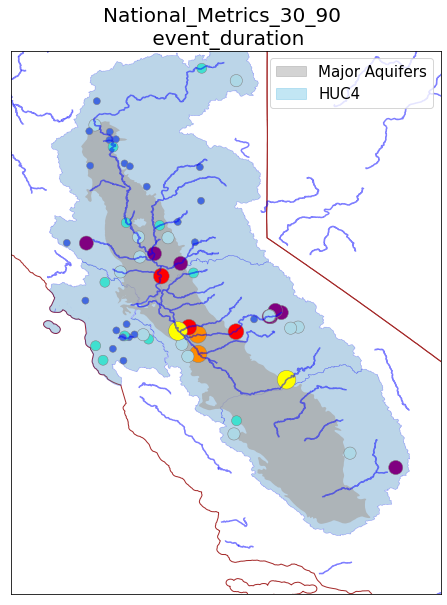

In [727]:
fig, ax = plt.subplots(figsize=(10, 10))
plt.title(f'{dataset[:-5]} \n {metric}', loc='center', fontsize=20)

# Lower-48 Plot
fn.plot_lower_48(ax)

# Plot streams
filepath = 'C:\\Users\\kondr\\Documents\\GitHub\\DahlkeLab_LAWR'
folder = 'Streams_us'
file = 'us_streams.shp'
shapefile_path = f'{filepath}\\ShapeFiles\\{folder}\\{file}'
st = gpd.read_file(shapefile_path)
#st = st.to_crs(epsg=4269)
st_plot = st.plot(ax=ax, edgecolor='blue', alpha = 0.5, legend=True)

# HUC4 Region Plot
for root, dirs, files in os.walk(aquifer.wb_dir):
    #print(root, dirs, files)
    if os.path.basename(root).startswith('NHD_H_'):
        if aquifer.wb_shapefiles in files:
            shapefile_aq_path = os.path.join(root, aquifer.wb_shapefiles)
            ws_gdf = gpd.read_file(shapefile_aq_path)
            ws_gdf = ws_gdf.to_crs(epsg=4269)
            ws_gdf.plot(ax=ax, edgecolor='blue', alpha=0.30, linewidth=0.5)

# Plot aquifers
high_plains_gdf = get_aquifer_gdf(cl.high_plains_aquifer)
high_plains_gdf.plot(ax=ax, edgecolor='none', facecolor='darkgrey', linewidth=1.25, alpha=0.75)

central_valley_gdf = get_aquifer_gdf(cl.central_valley_aquifer)
central_valley_gdf.plot(ax=ax, edgecolor='none', facecolor='darkgrey', linewidth=1.25, alpha=0.75)

meras_gdf = get_aquifer_gdf(cl.upper_clairborne_aquifer)
meras_gdf.plot(ax=ax, edgecolor='none', facecolor='darkgrey', linewidth=1.25, alpha=0.75)

xmin, ymin, xmax, ymax = central_valley_gdf.total_bounds
padding = 1.0
xmin -= padding
ymin -= padding
xmax += padding
ymax += padding

# aq_gdf.plot(ax=ax, edgecolor='red', facecolor='none', linewidth=1.25)
ax.set_xlim(xmin, xmax)
ax.set_ylim(ymin, ymax)

# Convert decimal lat/long to geo points
df_valid_geo = df_valid.reset_index()
geo_df = fn.convert_geometry(df_valid_geo)
geo_df.crs = 4269
geo_df = geo_df.merge(df_valid_geo, how='left', left_index=True, right_index=True)
#geo_df.dropna(subset=[metric+'_bin'], inplace=True)

# Set colorbar limits and theme using undivided dataset so that scale is static
#cmap, mappable = fn.scale_colorbar(df_valid, metric)
#div = make_axes_locatable(ax)
#cax = div.append_axes("bottom", size="5%", pad=0.05)

# Watergauges plot - colormap
#bx = geo_df.plot(ax=ax, column='inter_annual', markersize=300, marker='.', cmap=cmap, edgecolor='black', linewidth=1, alpha=0.75)
#cbx = plt.colorbar(mappable, cax=cax, pad=0.05, aspect=25, orientation='horizontal', alpha=1.0)
#cbx.set_label(fn.FLOW_METRIC_UNITS[metric])

# Watergages plot - marker size
bx = geo_df.plot(ax=ax, markersize=geo_df[metric+'_bin'], marker='.', 
                 color=[bin_colors[bin_val] for bin_val in geo_df[metric+'_bin']], linewidth=0.5, alpha=1.0, edgecolor='grey') #column=metric
#cbx = plt.colorbar(mappable, cax=cax, pad=0.05, aspect=25, orientation='horizontal', alpha=1.0)
#cbx.set_label(fn.FLOW_METRIC_UNITS[metric])

ax.set_yticks([])
ax.set_xticks([])

# Plot legend
handles = []  # Store handles for legend
labels = []   # Store labels for legend
handles.extend([Patch(color='darkgrey', alpha=0.5), Patch(color='skyblue', alpha=0.5)])  # Add the handle for legend
labels.extend(['Major Aquifers', 'HUC4'])  # Add the label for legend
ax.legend(handles, labels, loc='upper right', fontsize=15)

# Save images if they don't exist or if overwrite is True
if save_img:
    img_path = f'Saved_Visuals/{dataset[:-5]}_{metric}.png'
    fn.save_plot_as_image(img_path, overwrite)
    
plt.savefig(f'Saved_Visuals/hyd201b_presentation/{aquifer_name}_{metric}.png', bbox_inches='tight')

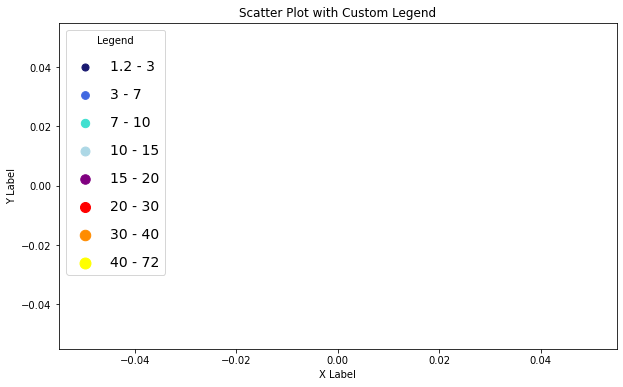

In [730]:
import matplotlib.patches as mpatches

# Define bin values and corresponding colors
bin_values = [bin_value_1, bin_value_2, bin_value_3, bin_value_4, bin_value_5, bin_value_6, bin_value_7, bin_value_8]
bin_colors = ['midnightblue', 'royalblue', 'turquoise', 'lightblue', 'purple', 'red', 'darkorange', 'yellow']

# Define bin ranges
bin_ranges = [(1.2, bin_1), (bin_1, bin_2), (bin_2, bin_3), (bin_3, bin_4), (bin_4, bin_5), (bin_5, bin_6), (bin_6, bin_7), (bin_7, bin_8)]

# Define marker sizes corresponding to bin values
marker_sizes = [50, 60, 70, 80, 90, 100, 110, 120]

# Plot dummy points for the legend
plt.figure(figsize=(10, 6))
for i in range(len(bin_values)):
    plt.scatter([], [], c=bin_colors[i], s=marker_sizes[i], label=f'{bin_ranges[i][0]} - {bin_ranges[i][1]}')

# Create custom legend with markers, sizes, bin ranges, and colors
plt.legend(scatterpoints=1, frameon=True, labelspacing=1, title='Legend', loc='upper left', fontsize=14)

plt.xlabel('X Label')
plt.ylabel('Y Label')
plt.title('Scatter Plot with Custom Legend')

plt.savefig(f'Saved_Visuals/hyd201b_presentation/{dataset[:-5]}_{metric}_legend.png', bbox_inches='tight')

plt.show()

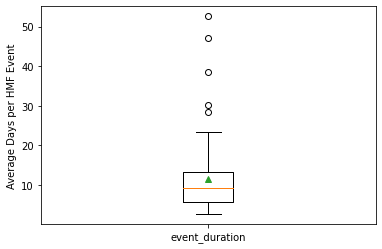

count    67.000000
mean     11.639546
std       9.584691
min       2.697730
25%       5.626018
50%       9.328794
75%      13.333633
max      52.569444
Name: event_duration, dtype: float64

In [731]:
def plot_hmf_metric_boxplot(df, metric):
    plt.boxplot(df[metric], showmeans=True)
    #print(boxplot['fliers'])
    plt.xticks(ticks=[1], labels=[f'{metric}'])
    plt.ylabel(fn.FLOW_METRIC_UNITS[metric])
    plt.show()
    return

def get_boxplot_outliers(df, metric):
    boxplot = plt.boxplot(df[metric], showmeans=True)
    plt.xticks(ticks=[1], labels=[f'{metric}'])
    plt.ylabel(fn.FLOW_METRIC_UNITS[metric])
    plt.show()
    
    # Extract outliers
    outliers = [flier.get_ydata() for flier in boxplot['fliers']] # note: boxplot['fliers'] is a graphical object
    # Flatten the outliers list
    outliers = [item for sublist in outliers for item in sublist]
    outlier_site_nos = df.loc[df[metric].isin(outliers), 'site_no']
    return outliers, outlier_site_nos

# All HMF metrics
#for metric in metric_list:
#    plot_hmf_metric_boxplot(df_natl_30_90, metric)

# Singular HMF metric
#plot_hmf_metric_boxplot(df_natl_30_90, metric)
outliers, outlier_site_nos = get_boxplot_outliers(df_valid, metric)
df_valid[metric].describe()

## Plot HMF metrics - High Plains Aquifer

In [814]:
# Load dataset
data_range = 30
percentile = 90
folder = 'National_Metrics'
dataset = f'National_Metrics_{data_range}_{percentile}.xlsx'
datapath = f'Prelim_Data/{folder}/{dataset}'
lower_48_shp_path = 'ShapeFiles/Lower48/lower48.shp'

df_metrics = pd.read_excel(datapath, sheet_name='site_metrics')
df_valid = df_metrics[df_metrics['valid'] == True]

In [815]:
# Select aquifer
aquifer = cl.high_plains_aquifer
aquifer_name = 'high_plains'
df_valid = df_valid[df_valid['huc4_code'].isin(aquifer.huc4s)]

### Annual HMF

In [677]:
# Metric to be plotted where metrics are column names from the dataset
metric = 'annual_hmf'

# True if you want to overwrite current images
overwrite = False
save_img = False

In [678]:
# Annual HMF 
bin_1 = 0.2
bin_2 = 0.7
bin_3 = 1.6
bin_4 = 3.0
bin_5 = 6.0
bin_6 = 14.1

bin_value_1 = 100
bin_value_2 = 500
bin_value_3 = 1000
bin_value_4 = 1500
bin_value_5 = 2000
bin_value_6 = 5000

for idx, value in df_valid[metric].iteritems():
    if value >= 0 and value < bin_1:
        df_valid.at[idx, metric+'_bin'] = bin_value_1
    elif value >= bin_1 and value < bin_2:
        df_valid.at[idx, metric+'_bin'] = bin_value_2
    elif value >= bin_2 and value < bin_3:
        df_valid.at[idx, metric+'_bin'] = bin_value_3
    elif value >= bin_3 and value < bin_4:
        df_valid.at[idx, metric+'_bin'] = bin_value_4
    elif value >= bin_4 and value < bin_5:
        df_valid.at[idx, metric+'_bin'] = bin_value_5
    elif value >= bin_5 and value < bin_6:
        df_valid.at[idx, metric+'_bin'] = bin_value_6

#print(df_valid['annual_hmf_bin'])
#print(df_valid['annual_hmf'])

bin_colors = {
    bin_value_1: 'midnightblue',
    bin_value_2: 'royalblue',
    bin_value_3: 'turquoise',
    bin_value_4: 'lightgreen',
    bin_value_5: 'yellow',
    bin_value_6: 'darkorange'
}

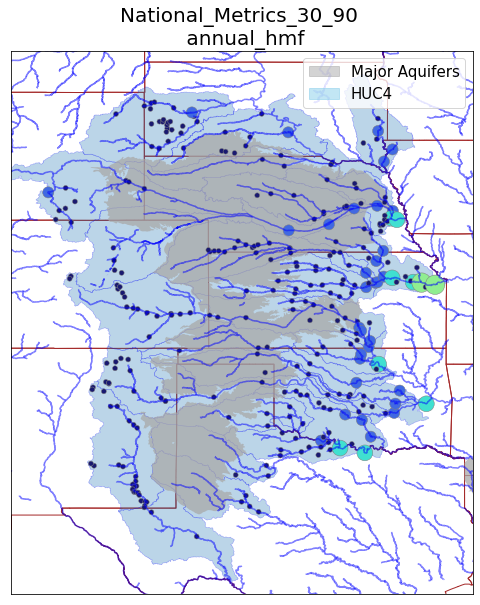

In [681]:
fig, ax = plt.subplots(figsize=(10, 10))
plt.title(f'{dataset[:-5]} \n {metric}', loc='center', fontsize=20)

# Lower-48 Plot
fn.plot_lower_48(ax)

# Plot streams
filepath = 'C:\\Users\\kondr\\Documents\\GitHub\\DahlkeLab_LAWR'
folder = 'Streams_us'
file = 'us_streams.shp'
shapefile_path = f'{filepath}\\ShapeFiles\\{folder}\\{file}'
st = gpd.read_file(shapefile_path)
#st = st.to_crs(epsg=4269)
st_plot = st.plot(ax=ax, edgecolor='blue', alpha = 0.5, legend=True)

# HUC4 Region Plot
for root, dirs, files in os.walk(aquifer.wb_dir):
    #print(root, dirs, files)
    if os.path.basename(root).startswith('NHD_H_'):
        if aquifer.wb_shapefiles in files:
            shapefile_aq_path = os.path.join(root, aquifer.wb_shapefiles)
            ws_gdf = gpd.read_file(shapefile_aq_path)
            ws_gdf = ws_gdf.to_crs(epsg=4269)
            ws_gdf.plot(ax=ax, edgecolor='blue', alpha=0.30, linewidth=0.5)

# Plot aquifers
high_plains_gdf = get_aquifer_gdf(cl.high_plains_aquifer)
high_plains_gdf.plot(ax=ax, edgecolor='none', facecolor='darkgrey', linewidth=1.25, alpha=0.75)

central_valley_gdf = get_aquifer_gdf(cl.central_valley_aquifer)
central_valley_gdf.plot(ax=ax, edgecolor='none', facecolor='darkgrey', linewidth=1.25, alpha=0.75)

meras_gdf = get_aquifer_gdf(cl.upper_clairborne_aquifer)
meras_gdf.plot(ax=ax, edgecolor='none', facecolor='darkgrey', linewidth=1.25, alpha=0.75)

xmin, ymin, xmax, ymax = high_plains_gdf.total_bounds
padding = 2.5
xmin -= padding
ymin -= padding
xmax += padding
ymax += padding

#aq_gdf.plot(ax=ax, edgecolor='red', facecolor='none', linewidth=1.25)
ax.set_xlim(xmin, xmax)
ax.set_ylim(ymin, ymax)

# Convert decimal lat/long to geo points
df_valid_geo = df_valid.reset_index()
geo_df = fn.convert_geometry(df_valid_geo)
geo_df.crs = 4269
geo_df = geo_df.merge(df_valid_geo, how='left', left_index=True, right_index=True)
geo_df.dropna(subset=[metric+'_bin'], inplace=True)

# Set colorbar limits and theme using undivided dataset so that scale is static
#cmap, mappable = fn.scale_colorbar(df_valid, metric)
#div = make_axes_locatable(ax)
#cax = div.append_axes("bottom", size="5%", pad=0.05)

# Watergauges plot - colormap
#bx = geo_df.plot(ax=ax, column='inter_annual', markersize=300, marker='.', cmap=cmap, edgecolor='black', linewidth=1, alpha=0.75)
#cbx = plt.colorbar(mappable, cax=cax, pad=0.05, aspect=25, orientation='horizontal', alpha=1.0)
#cbx.set_label(fn.FLOW_METRIC_UNITS[metric])

# Watergages plot - marker size
bx = geo_df.plot(ax=ax, markersize=geo_df[metric+'_bin'], marker='.', 
                 color=[bin_colors[bin_val] for bin_val in geo_df[metric+'_bin']], linewidth=0.5, alpha=1.0, edgecolor='grey') #column=metric
#cbx = plt.colorbar(mappable, cax=cax, pad=0.05, aspect=25, orientation='horizontal', alpha=1.0)
#cbx.set_label(fn.FLOW_METRIC_UNITS[metric])

ax.set_yticks([])
ax.set_xticks([])

# Plot legend
handles = []  # Store handles for legend
labels = []   # Store labels for legend
handles.extend([Patch(color='darkgrey', alpha=0.5), Patch(color='skyblue', alpha=0.5)])  # Add the handle for legend
labels.extend(['Major Aquifers', 'HUC4'])  # Add the label for legend
ax.legend(handles, labels, loc='upper right', fontsize=15)

# Save images if they don't exist or if overwrite is True
if save_img:
    img_path = f'Saved_Visuals/{dataset[:-5]}_{metric}.png'
    fn.save_plot_as_image(img_path, overwrite)

plt.savefig(f'Saved_Visuals/hyd201b_presentation/{aquifer_name}_{metric}.png', bbox_inches='tight')

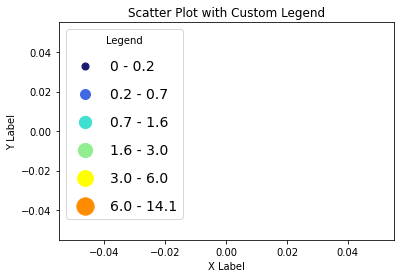

In [682]:
import matplotlib.patches as mpatches

# Define bin values and corresponding colors
bin_values = [bin_value_1, bin_value_2, bin_value_3, bin_value_4, bin_value_5, bin_value_6]
bin_colors = ['midnightblue', 'royalblue', 'turquoise', 'lightgreen', 'yellow', 'darkorange']

# Define bin ranges
bin_ranges = [(0, bin_1), (bin_1, bin_2), (bin_2, bin_3), (bin_3, bin_4), (bin_4, bin_5), (bin_5, bin_6)]

# Define marker sizes corresponding to bin values
marker_sizes = [50, 100, 150, 200, 250, 300]

# Plot dummy points for the legend
for i in range(len(bin_values)):
    plt.scatter([], [], c=bin_colors[i], s=marker_sizes[i], label=f'{bin_ranges[i][0]} - {bin_ranges[i][1]}')

# Create custom legend with markers, sizes, bin ranges, and colors
plt.legend(scatterpoints=1, frameon=True, labelspacing=1, title='Legend', loc='upper left', fontsize=14)

plt.xlabel('X Label')
plt.ylabel('Y Label')
plt.title('Scatter Plot with Custom Legend')
plt.savefig(f'Saved_Visuals/hyd201b_presentation/{aquifer_name}_{metric}_legend.png', bbox_inches='tight')
plt.show()

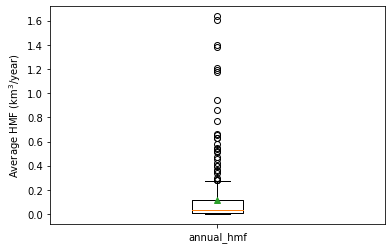

count    303.000000
mean       0.118938
std        0.243410
min        0.000144
25%        0.009850
50%        0.032665
75%        0.117224
max        1.636035
Name: annual_hmf, dtype: float64

In [683]:
def plot_hmf_metric_boxplot(df, metric):
    plt.boxplot(df[metric], showmeans=True)
    #print(boxplot['fliers'])
    plt.xticks(ticks=[1], labels=[f'{metric}'])
    plt.ylabel(fn.FLOW_METRIC_UNITS[metric])
    plt.show()
    return

def get_boxplot_outliers(df, metric):
    boxplot = plt.boxplot(df[metric], showmeans=True)
    plt.xticks(ticks=[1], labels=[f'{metric}'])
    plt.ylabel(fn.FLOW_METRIC_UNITS[metric])
    plt.show()
    
    # Extract outliers
    outliers = [flier.get_ydata() for flier in boxplot['fliers']] # note: boxplot['fliers'] is a graphical object
    # Flatten the outliers list
    outliers = [item for sublist in outliers for item in sublist]
    outlier_site_nos = df.loc[df[metric].isin(outliers), 'site_no']
    return outliers, outlier_site_nos

# All HMF metrics
#for metric in metric_list:
#    plot_hmf_metric_boxplot(df_natl_30_90, metric)

# Singular HMF metric
#plot_hmf_metric_boxplot(df_natl_30_90, metric)
outliers, outlier_site_nos = get_boxplot_outliers(df_valid, metric)
df_valid[metric].describe()

In [504]:
df_valid_hp = df_valid.sort_values(by='annual_hmf')
df_valid_hp.tail(10)

,site_no,analyze_start,analyze_end,analyze_range,quantile,valid,missing_data%,threshold,hmf_years,annual_hmf,...,dec_long_va,data_start,data_end,total_record,state,huc2_code,huc4_code,aquifer,HCDN_2009,annual_hmf_bin
2404,6801000,1990-10-01,2020-09-30,30,0.9,True,0,12900.0,29,0.766976,...,-96.324514,1928-09-01,2020-09-30,92.1,NE,10,1020,NaN,False,1000.0
2809,7315500,1990-10-01,2020-09-30,30,0.9,True,0,5510.0,29,0.863681,...,-97.934480,1938-04-01,2020-09-30,82.5,OK,11,1113,NaN,False,1000.0
2412,6805500,1990-10-01,2020-09-30,30,0.9,True,0,15000.0,29,0.941096,...,-96.157500,1953-06-01,2020-09-30,67.3,NE,10,1020,NaN,False,1000.0
2496,6887500,1990-10-01,2020-09-30,30,0.9,True,0,13800.0,25,1.174337,...,-96.305553,1919-01-23,2020-09-30,101.7,KS,10,1027,NaN,False,1000.0
2761,7245000,1990-10-01,2020-09-30,30,0.9,True,0,18300.0,26,1.193985,...,-95.237189,1938-10-01,2020-09-30,82.0,OK,11,1109,NaN,False,1000.0
2811,7316000,1990-10-01,2020-09-30,30,0.9,True,0,7473.0,27,1.210374,...,-97.160013,1936-10-01,2020-09-30,84.0,OK,11,1113,NaN,False,1000.0
2500,6889000,1990-10-01,2020-09-30,30,0.9,True,0,15330.0,25,1.384255,...,-95.649703,1917-06-12,2020-09-30,103.3,KS,10,1027,NaN,False,1000.0
2676,7152500,1990-10-01,2020-09-30,30,0.9,True,0,17500.0,27,1.400728,...,-96.728367,1925-10-01,2020-09-30,95.0,OK,11,1106,NaN,False,1000.0
2505,6891000,1990-10-01,2020-09-30,30,0.9,True,0,18200.0,24,1.609582,...,-95.386363,1936-03-16,2020-09-30,84.5,KS,10,1027,NaN,False,1500.0
2508,6892350,1990-10-01,2020-09-30,30,0.9,True,0,20100.0,25,1.636035,...,-94.964689,1917-07-08,2020-09-30,103.2,KS,10,1027,NaN,False,1500.0


### Annual duration

In [816]:
# Metric to be plotted where metrics are column names from the dataset
metric = 'annual_duration' #'annual_hmf'

# True if you want to overwrite current images
overwrite = False
save_img = False

In [817]:
# Annual duration
bin_1 = 20
bin_2 = 30
bin_3 = 35
bin_4 = 40
bin_5 = 45
bin_6 = 55
bin_7 = 75
bin_8 = 157

bin_value_1 = 10
bin_value_2 = 200
bin_value_3 = 400
bin_value_4 = 600
bin_value_5 = 800
bin_value_6 = 1000
bin_value_7 = 1200
bin_value_8 = 1400

for idx, value in df_valid[metric].iteritems():
    if value >= 0 and value < bin_1:
        df_valid.at[idx, metric+'_bin'] = bin_value_1
    elif value >= bin_1 and value < bin_2:
        df_valid.at[idx, metric+'_bin'] = bin_value_2
    elif value >= bin_2 and value < bin_3:
        df_valid.at[idx, metric+'_bin'] = bin_value_3
    elif value >= bin_3 and value < bin_4:
        df_valid.at[idx, metric+'_bin'] = bin_value_4
    elif value >= bin_4 and value < bin_5:
        df_valid.at[idx, metric+'_bin'] = bin_value_5
    elif value >= bin_5 and value < bin_6:
        df_valid.at[idx, metric+'_bin'] = bin_value_6
    elif value >= bin_6 and value < bin_7:
        df_valid.at[idx, metric+'_bin'] = bin_value_7
    elif value >= bin_7 and value < bin_8:
        df_valid.at[idx, metric+'_bin'] = bin_value_8
        
#print(df_valid['annual_hmf_bin'])
#print(df_valid['annual_hmf'])

bin_colors = {
    bin_value_1: 'midnightblue',
    bin_value_2: 'royalblue',
    bin_value_3: 'turquoise',
    bin_value_4: 'lightblue',
    bin_value_5: 'purple',
    bin_value_6: 'red',
    bin_value_7: 'darkorange',
    bin_value_8: 'yellow'
}

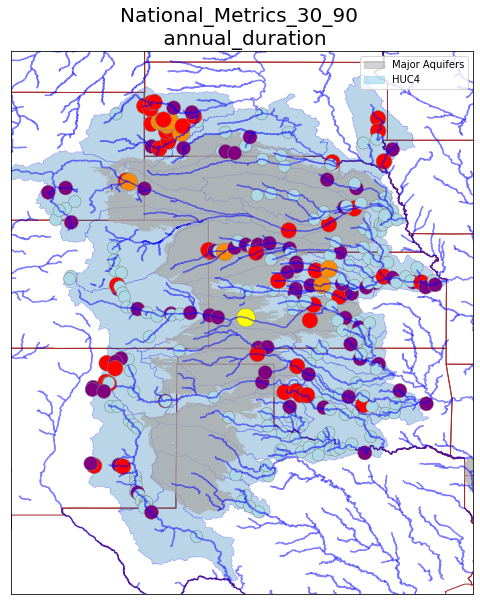

In [818]:
fig, ax = plt.subplots(figsize=(10, 10))
plt.title(f'{dataset[:-5]} \n {metric}', loc='center', fontsize=20)

# Lower-48 Plot
fn.plot_lower_48(ax)

# Plot streams
filepath = 'C:\\Users\\kondr\\Documents\\GitHub\\DahlkeLab_LAWR'
folder = 'Streams_us'
file = 'us_streams.shp'
shapefile_path = f'{filepath}\\ShapeFiles\\{folder}\\{file}'
st = gpd.read_file(shapefile_path)
#st = st.to_crs(epsg=4269)
st_plot = st.plot(ax=ax, edgecolor='blue', alpha = 0.5, legend=True)

# HUC4 Region Plot
for root, dirs, files in os.walk(aquifer.wb_dir):
    #print(root, dirs, files)
    if os.path.basename(root).startswith('NHD_H_'):
        if aquifer.wb_shapefiles in files:
            shapefile_aq_path = os.path.join(root, aquifer.wb_shapefiles)
            ws_gdf = gpd.read_file(shapefile_aq_path)
            ws_gdf = ws_gdf.to_crs(epsg=4269)
            ws_gdf.plot(ax=ax, edgecolor='blue', alpha=0.30, linewidth=0.5)

# Plot aquifers
high_plains_gdf = get_aquifer_gdf(cl.high_plains_aquifer)
high_plains_gdf.plot(ax=ax, edgecolor='none', facecolor='darkgrey', linewidth=1.25, alpha=0.75)

central_valley_gdf = get_aquifer_gdf(cl.central_valley_aquifer)
central_valley_gdf.plot(ax=ax, edgecolor='none', facecolor='darkgrey', linewidth=1.25, alpha=0.75)

meras_gdf = get_aquifer_gdf(cl.upper_clairborne_aquifer)
meras_gdf.plot(ax=ax, edgecolor='none', facecolor='darkgrey', linewidth=1.25, alpha=0.75)

xmin, ymin, xmax, ymax = high_plains_gdf.total_bounds
padding = 2.5
xmin -= padding
ymin -= padding
xmax += padding
ymax += padding

# aq_gdf.plot(ax=ax, edgecolor='red', facecolor='none', linewidth=1.25)
ax.set_xlim(xmin, xmax)
ax.set_ylim(ymin, ymax)

# Convert decimal lat/long to geo points
df_valid_geo = df_valid.reset_index()
geo_df = fn.convert_geometry(df_valid_geo)
geo_df.crs = 4269
geo_df = geo_df.merge(df_valid_geo, how='left', left_index=True, right_index=True)
geo_df.dropna(subset=[metric+'_bin'], inplace=True)

# Set colorbar limits and theme using undivided dataset so that scale is static
#cmap, mappable = fn.scale_colorbar(df_valid, metric)
#div = make_axes_locatable(ax)
#cax = div.append_axes("bottom", size="5%", pad=0.05)

# Watergauges plot - colormap
#bx = geo_df.plot(ax=ax, column='inter_annual', markersize=300, marker='.', cmap=cmap, edgecolor='black', linewidth=1, alpha=0.75)
#cbx = plt.colorbar(mappable, cax=cax, pad=0.05, aspect=25, orientation='horizontal', alpha=1.0)
#cbx.set_label(fn.FLOW_METRIC_UNITS[metric])

# Watergages plot - marker size
bx = geo_df.plot(ax=ax, markersize=geo_df[metric+'_bin'], marker='.', 
                 color=[bin_colors[bin_val] for bin_val in geo_df[metric+'_bin']], linewidth=0.5, alpha=1.0, edgecolor='grey') #column=metric
#cbx = plt.colorbar(mappable, cax=cax, pad=0.05, aspect=25, orientation='horizontal', alpha=1.0)
#cbx.set_label(fn.FLOW_METRIC_UNITS[metric])

ax.set_yticks([])
ax.set_xticks([])

# Plot legend
handles = []  # Store handles for legend
labels = []   # Store labels for legend
handles.extend([Patch(color='darkgrey', alpha=0.5), Patch(color='skyblue', alpha=0.5)])  # Add the handle for legend
labels.extend(['Major Aquifers', 'HUC4'])  # Add the label for legend
ax.legend(handles, labels, loc='upper right', fontsize=10)

# Save images if they don't exist or if overwrite is True
if save_img:
    img_path = f'Saved_Visuals/{dataset[:-5]}_{metric}.png'
    fn.save_plot_as_image(img_path, overwrite)

plt.savefig(f'Saved_Visuals/hyd201b_presentation/{aquifer_name}_{metric}.png', bbox_inches='tight')

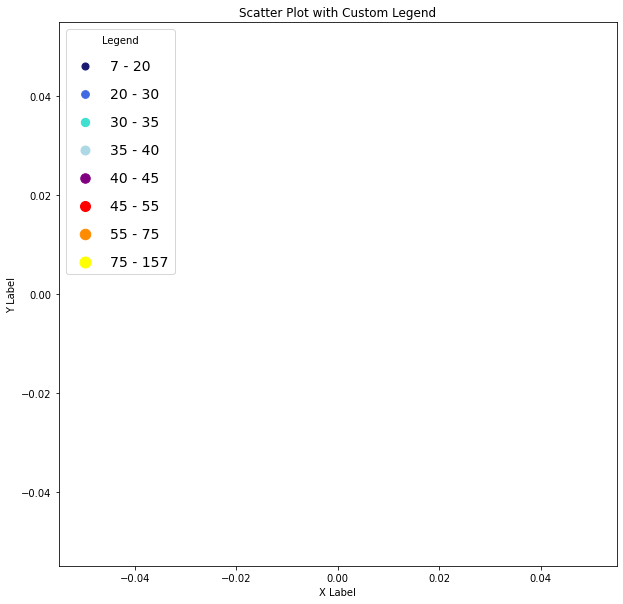

In [819]:
import matplotlib.patches as mpatches

# Define bin values and corresponding colors
bin_values = [bin_value_1, bin_value_2, bin_value_3, bin_value_4, bin_value_5, bin_value_6, bin_value_7, bin_value_8]
bin_colors = ['midnightblue', 'royalblue', 'turquoise', 'lightblue', 'purple', 'red', 'darkorange', 'yellow']

# Define bin ranges
bin_ranges = [(7, bin_1), (bin_1, bin_2), (bin_2, bin_3), (bin_3, bin_4), (bin_4, bin_5), (bin_5, bin_6), (bin_6, bin_7), (bin_7, bin_8)]

# Define marker sizes corresponding to bin values
marker_sizes = [50, 60, 70, 80, 90, 100, 110, 120]

# Plot dummy points for the legend
plt.figure(figsize=(10, 10))
for i in range(len(bin_values)):
    plt.scatter([], [], c=bin_colors[i], s=marker_sizes[i], label=f'{bin_ranges[i][0]} - {bin_ranges[i][1]}')

# Create custom legend with markers, sizes, bin ranges, and colors
plt.legend(scatterpoints=1, frameon=True, labelspacing=1, title='Legend', loc='upper left', fontsize=14)

plt.xlabel('X Label')
plt.ylabel('Y Label')
plt.title('Scatter Plot with Custom Legend')

plt.savefig(f'Saved_Visuals/hyd201b_presentation/{dataset[:-5]}_{metric}_legend.png', bbox_inches='tight')

plt.show()

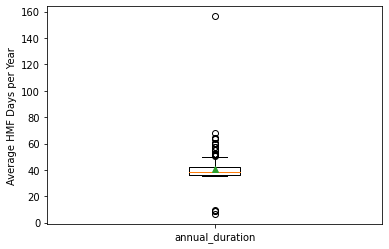

count    303.000000
mean      40.742600
std        9.559061
min        6.583333
25%       36.533333
50%       38.678571
75%       42.115385
max      156.428571
Name: annual_duration, dtype: float64

In [820]:
def plot_hmf_metric_boxplot(df, metric):
    plt.boxplot(df[metric], showmeans=True)
    #print(boxplot['fliers'])
    plt.xticks(ticks=[1], labels=[f'{metric}'])
    plt.ylabel(fn.FLOW_METRIC_UNITS[metric])
    plt.show()
    return

def get_boxplot_outliers(df, metric):
    boxplot = plt.boxplot(df[metric], showmeans=True)
    plt.xticks(ticks=[1], labels=[f'{metric}'])
    plt.ylabel(fn.FLOW_METRIC_UNITS[metric])
    plt.show()
    
    # Extract outliers
    outliers = [flier.get_ydata() for flier in boxplot['fliers']] # note: boxplot['fliers'] is a graphical object
    # Flatten the outliers list
    outliers = [item for sublist in outliers for item in sublist]
    outlier_site_nos = df.loc[df[metric].isin(outliers), 'site_no']
    return outliers, outlier_site_nos

# All HMF metrics
#for metric in metric_list:
#    plot_hmf_metric_boxplot(df_natl_30_90, metric)

# Singular HMF metric
#plot_hmf_metric_boxplot(df_natl_30_90, metric)
outliers, outlier_site_nos = get_boxplot_outliers(df_valid, metric)
df_valid[metric].describe()

### Inter-annual frequency

In [686]:
# Metric to be plotted where metrics are column names from the dataset
metric = 'inter_annual%'

# True if you want to overwrite current images
overwrite = False
save_img = False

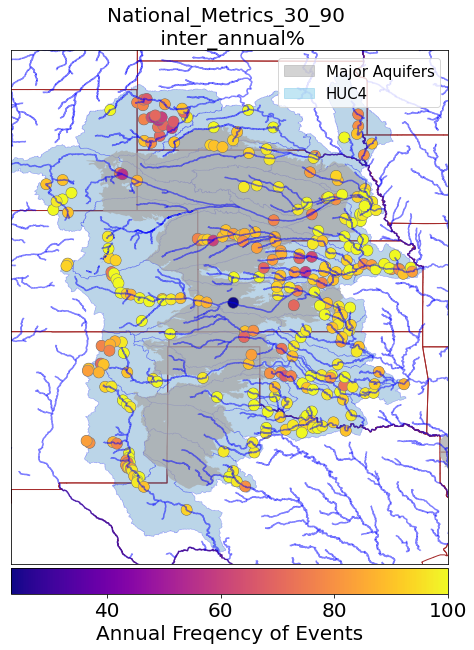

In [689]:
fig, ax = plt.subplots(figsize=(10, 10))
plt.title(f'{dataset[:-5]} \n {metric}', loc='center', fontsize=20)

# Lower-48 Plot
fn.plot_lower_48(ax)

# Plot streams
filepath = 'C:\\Users\\kondr\\Documents\\GitHub\\DahlkeLab_LAWR'
folder = 'Streams_us'
file = 'us_streams.shp'
shapefile_path = f'{filepath}\\ShapeFiles\\{folder}\\{file}'
st = gpd.read_file(shapefile_path)
#st = st.to_crs(epsg=4269)
st_plot = st.plot(ax=ax, edgecolor='blue', alpha = 0.5, legend=True)

# HUC4 Region Plot
for root, dirs, files in os.walk(aquifer.wb_dir):
    #print(root, dirs, files)
    if os.path.basename(root).startswith('NHD_H_'):
        if aquifer.wb_shapefiles in files:
            shapefile_aq_path = os.path.join(root, aquifer.wb_shapefiles)
            ws_gdf = gpd.read_file(shapefile_aq_path)
            ws_gdf = ws_gdf.to_crs(epsg=4269)
            ws_gdf.plot(ax=ax, edgecolor='blue', alpha=0.30, linewidth=0.5)

# Plot aquifers
high_plains_gdf = get_aquifer_gdf(cl.high_plains_aquifer)
high_plains_gdf.plot(ax=ax, edgecolor='none', facecolor='darkgrey', linewidth=1.25, alpha=0.75)

central_valley_gdf = get_aquifer_gdf(cl.central_valley_aquifer)
central_valley_gdf.plot(ax=ax, edgecolor='none', facecolor='darkgrey', linewidth=1.25, alpha=0.75)

meras_gdf = get_aquifer_gdf(cl.upper_clairborne_aquifer)
meras_gdf.plot(ax=ax, edgecolor='none', facecolor='darkgrey', linewidth=1.25, alpha=0.75)

xmin, ymin, xmax, ymax = high_plains_gdf.total_bounds
padding = 2.5
xmin -= padding
ymin -= padding
xmax += padding
ymax += padding

#aq_gdf.plot(ax=ax, edgecolor='red', facecolor='none', linewidth=1.25)
ax.set_xlim(xmin, xmax)
ax.set_ylim(ymin, ymax)

# Convert decimal lat/long to geo points
df_valid_geo = df_valid.reset_index()
geo_df = fn.convert_geometry(df_valid_geo)
geo_df.crs = 4269
geo_df = geo_df.merge(df_valid_geo, how='left', left_index=True, right_index=True)
#geo_df.dropna(subset=[metric+'_bin'], inplace=True)

# Set colorbar limits and theme using undivided dataset so that scale is static
cmap, mappable = fn.scale_colorbar(df_valid, metric, cmap='plasma')
div = make_axes_locatable(ax)
cax = div.append_axes("bottom", size="5%", pad=0.05)

# Watergauges plot - colormap
bx = geo_df.plot(ax=ax, column=metric, markersize=400, marker='.', cmap=cmap, edgecolor='black', linewidth=1, alpha=0.75)
cbx = plt.colorbar(mappable, cax=cax, pad=0.05, aspect=25, orientation='horizontal', alpha=1.0)
cbx.set_label(fn.FLOW_METRIC_UNITS[metric], fontsize=20)

# Watergages plot - marker size
bx = geo_df.plot(ax=ax, column=metric, markersize=500, marker='.', 
                 cmap='plasma', linewidth=0.5, alpha=1.0, edgecolor='grey')
cbx = plt.colorbar(mappable, cax=cax, pad=0.05, aspect=25, orientation='horizontal', alpha=1.0)
cbx.set_label(fn.FLOW_METRIC_UNITS[metric])
cbx.ax.tick_params(labelsize=20)

ax.set_yticks([])
ax.set_xticks([])

# num_ticks = 12

# # Calculate the tick positions
# tick_positions = np.linspace(0, 365, num_ticks)

# # Set the tick positions and labels on the color bar
# cbx.set_ticks(tick_positions)
# cbx.set_ticklabels([f'{tick:.2f}' for tick in tick_positions])  # Format the tick labels as desired

# Plot legend
handles = []  # Store handles for legend
labels = []   # Store labels for legend
handles.extend([Patch(color='darkgrey', alpha=0.5), Patch(color='skyblue', alpha=0.5)])  # Add the handle for legend
labels.extend(['Major Aquifers', 'HUC4'])  # Add the label for legend
ax.legend(handles, labels, loc='upper right', fontsize=15)

# Save images if they don't exist or if overwrite is True
if save_img:
    img_path = f'Saved_Visuals/{dataset[:-5]}_{metric}.png'
    fn.save_plot_as_image(img_path, overwrite)
    
plt.savefig(f'Saved_Visuals/hyd201b_presentation/{aquifer_name}_{metric}.png', bbox_inches='tight')

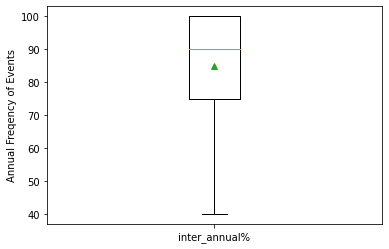

count     67.000000
mean      84.985075
std       17.151281
min       40.000000
25%       75.000000
50%       90.000000
75%      100.000000
max      100.000000
Name: inter_annual%, dtype: float64

In [674]:
def plot_hmf_metric_boxplot(df, metric):
    plt.boxplot(df[metric], showmeans=True)
    #print(boxplot['fliers'])
    plt.xticks(ticks=[1], labels=[f'{metric}'])
    plt.ylabel(fn.FLOW_METRIC_UNITS[metric])
    plt.show()
    return

def get_boxplot_outliers(df, metric):
    boxplot = plt.boxplot(df[metric], showmeans=True)
    plt.xticks(ticks=[1], labels=[f'{metric}'])
    plt.ylabel(fn.FLOW_METRIC_UNITS[metric])
    plt.show()
    
    # Extract outliers
    outliers = [flier.get_ydata() for flier in boxplot['fliers']] # note: boxplot['fliers'] is a graphical object
    # Flatten the outliers list
    outliers = [item for sublist in outliers for item in sublist]
    outlier_site_nos = df.loc[df[metric].isin(outliers), 'site_no']
    return outliers, outlier_site_nos

# All HMF metrics
#for metric in metric_list:
#    plot_hmf_metric_boxplot(df_natl_30_90, metric)

# Singular HMF metric
#plot_hmf_metric_boxplot(df_natl_30_90, metric)
outliers, outlier_site_nos = get_boxplot_outliers(df_valid, metric)
df_valid[metric].describe()

### Intra-annual

In [757]:
# Metric to be plotted where metrics are column names from the dataset
metric = 'intra_annual' #'annual_hmf'

# True if you want to overwrite current images
overwrite = False
save_img = False

In [758]:
bin_1 = 3
bin_2 = 6
bin_3 = 10
bin_4 = 15
bin_5 = 20
bin_6 = 28

bin_value_1 = 100
bin_value_2 = 500
bin_value_3 = 1000
bin_value_4 = 1500
bin_value_5 = 2000
bin_value_6 = 4000

for idx, value in df_valid[metric].iteritems():
    if value >= 0 and value < bin_1:
        df_valid.at[idx, metric+'_bin'] = bin_value_1
    elif value >= bin_1 and value < bin_2:
        df_valid.at[idx, metric+'_bin'] = bin_value_2
    elif value >= bin_2 and value < bin_3:
        df_valid.at[idx, metric+'_bin'] = bin_value_3
    elif value >= bin_3 and value < bin_4:
        df_valid.at[idx, metric+'_bin'] = bin_value_4
    elif value >= bin_4 and value < bin_5:
        df_valid.at[idx, metric+'_bin'] = bin_value_5
    elif value >= bin_5 and value <= bin_6:
        df_valid.at[idx, metric+'_bin'] = bin_value_6

#print(df_valid['annual_hmf_bin'])
#print(df_valid['annual_hmf'])

bin_colors = {
    bin_value_1: 'red',
    bin_value_2: 'darkorange',
    bin_value_3: 'yellow',
    bin_value_4: 'magenta',
    bin_value_5: 'purple',
    bin_value_6: 'royalblue'
}

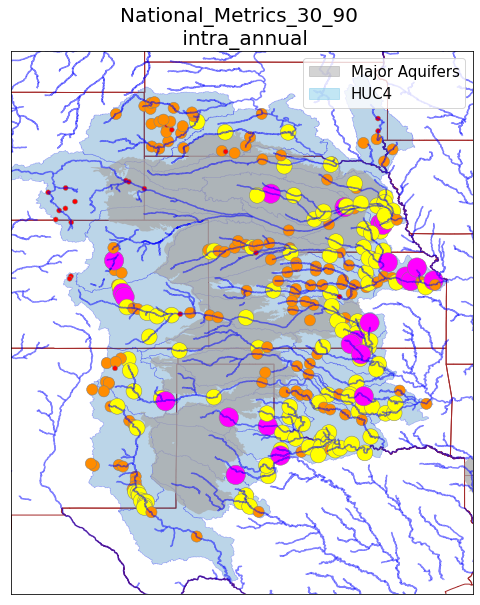

In [759]:
fig, ax = plt.subplots(figsize=(10, 10))
plt.title(f'{dataset[:-5]} \n {metric}', loc='center', fontsize=20)

# Lower-48 Plot
fn.plot_lower_48(ax)

# Plot streams
filepath = 'C:\\Users\\kondr\\Documents\\GitHub\\DahlkeLab_LAWR'
folder = 'Streams_us'
file = 'us_streams.shp'
shapefile_path = f'{filepath}\\ShapeFiles\\{folder}\\{file}'
st = gpd.read_file(shapefile_path)
#st = st.to_crs(epsg=4269)
st_plot = st.plot(ax=ax, edgecolor='blue', alpha = 0.5, legend=True)

# HUC4 Region Plot
for root, dirs, files in os.walk(aquifer.wb_dir):
    #print(root, dirs, files)
    if os.path.basename(root).startswith('NHD_H_'):
        if aquifer.wb_shapefiles in files:
            shapefile_aq_path = os.path.join(root, aquifer.wb_shapefiles)
            ws_gdf = gpd.read_file(shapefile_aq_path)
            ws_gdf = ws_gdf.to_crs(epsg=4269)
            ws_gdf.plot(ax=ax, edgecolor='blue', alpha=0.30, linewidth=0.5)

# Plot aquifers
high_plains_gdf = get_aquifer_gdf(cl.high_plains_aquifer)
high_plains_gdf.plot(ax=ax, edgecolor='none', facecolor='darkgrey', linewidth=1.25, alpha=0.75)

central_valley_gdf = get_aquifer_gdf(cl.central_valley_aquifer)
central_valley_gdf.plot(ax=ax, edgecolor='none', facecolor='darkgrey', linewidth=1.25, alpha=0.75)

meras_gdf = get_aquifer_gdf(cl.upper_clairborne_aquifer)
meras_gdf.plot(ax=ax, edgecolor='none', facecolor='darkgrey', linewidth=1.25, alpha=0.75)

xmin, ymin, xmax, ymax = high_plains_gdf.total_bounds
padding = 2.5
xmin -= padding
ymin -= padding
xmax += padding
ymax += padding

# aq_gdf.plot(ax=ax, edgecolor='red', facecolor='none', linewidth=1.25)
ax.set_xlim(xmin, xmax)
ax.set_ylim(ymin, ymax)

# Convert decimal lat/long to geo points
df_valid_geo = df_valid.reset_index()
geo_df = fn.convert_geometry(df_valid_geo)
geo_df.crs = 4269
geo_df = geo_df.merge(df_valid_geo, how='left', left_index=True, right_index=True)
geo_df.dropna(subset=[metric+'_bin'], inplace=True)

# Set colorbar limits and theme using undivided dataset so that scale is static
#cmap, mappable = fn.scale_colorbar(df_valid, metric)
#div = make_axes_locatable(ax)
#cax = div.append_axes("bottom", size="5%", pad=0.05)

# Watergauges plot - colormap
#bx = geo_df.plot(ax=ax, column='inter_annual', markersize=300, marker='.', cmap=cmap, edgecolor='black', linewidth=1, alpha=0.75)
#cbx = plt.colorbar(mappable, cax=cax, pad=0.05, aspect=25, orientation='horizontal', alpha=1.0)
#cbx.set_label(fn.FLOW_METRIC_UNITS[metric])

# Watergages plot - marker size
bx = geo_df.plot(ax=ax, markersize=geo_df[metric+'_bin'], marker='.', 
                 color=[bin_colors[bin_val] for bin_val in geo_df[metric+'_bin']], linewidth=0.5, alpha=1.0, edgecolor='grey') #column=metric
#cbx = plt.colorbar(mappable, cax=cax, pad=0.05, aspect=25, orientation='horizontal', alpha=1.0)
#cbx.set_label(fn.FLOW_METRIC_UNITS[metric])

ax.set_yticks([])
ax.set_xticks([])

# Plot legend
handles = []  # Store handles for legend
labels = []   # Store labels for legend
handles.extend([Patch(color='darkgrey', alpha=0.5), Patch(color='skyblue', alpha=0.5)])  # Add the handle for legend
labels.extend(['Major Aquifers', 'HUC4'])  # Add the label for legend
ax.legend(handles, labels, loc='upper right', fontsize=15)

# Save images if they don't exist or if overwrite is True
if save_img:
    img_path = f'Saved_Visuals/{dataset[:-5]}_{metric}.png'
    fn.save_plot_as_image(img_path, overwrite)
    
plt.savefig(f'Saved_Visuals/hyd201b_presentation/{aquifer_name}_{metric}.png', bbox_inches='tight')

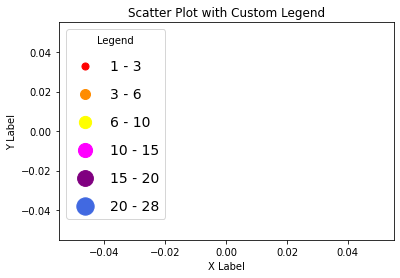

In [753]:
import matplotlib.patches as mpatches

# Define bin values and corresponding colors
bin_values = [bin_value_1, bin_value_2, bin_value_3, bin_value_4, bin_value_5, bin_value_6]
bin_colors = ['red', 'darkorange', 'yellow', 'magenta', 'purple', 'royalblue']

# Define bin ranges
bin_ranges = [(1, bin_1), (bin_1, bin_2), (bin_2, bin_3), (bin_3, bin_4), (bin_4, bin_5), (bin_5, bin_6)]

# Define marker sizes corresponding to bin values
marker_sizes = [50, 100, 150, 200, 250, 300]

# Plot dummy points for the legend
for i in range(len(bin_values)):
    plt.scatter([], [], c=bin_colors[i], s=marker_sizes[i], label=f'{bin_ranges[i][0]} - {bin_ranges[i][1]}')

# Create custom legend with markers, sizes, bin ranges, and colors
plt.legend(scatterpoints=1, frameon=True, labelspacing=1, title='Legend', loc='upper left', fontsize=14)

plt.xlabel('X Label')
plt.ylabel('Y Label')
plt.title('Scatter Plot with Custom Legend')

plt.savefig(f'Saved_Visuals/hyd201b_presentation/{dataset[:-5]}_{metric}_legend.png', bbox_inches='tight')

plt.show()

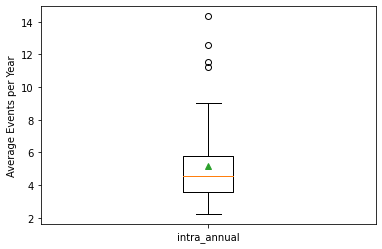

count    67.000000
mean      5.143611
std       2.402736
min       2.230769
25%       3.560386
50%       4.538462
75%       5.806034
max      14.333333
Name: intra_annual, dtype: float64

In [754]:
def plot_hmf_metric_boxplot(df, metric):
    plt.boxplot(df[metric], showmeans=True)
    #print(boxplot['fliers'])
    plt.xticks(ticks=[1], labels=[f'{metric}'])
    plt.ylabel(fn.FLOW_METRIC_UNITS[metric])
    plt.show()
    return

def get_boxplot_outliers(df, metric):
    boxplot = plt.boxplot(df[metric], showmeans=True)
    plt.xticks(ticks=[1], labels=[f'{metric}'])
    plt.ylabel(fn.FLOW_METRIC_UNITS[metric])
    plt.show()
    
    # Extract outliers
    outliers = [flier.get_ydata() for flier in boxplot['fliers']] # note: boxplot['fliers'] is a graphical object
    # Flatten the outliers list
    outliers = [item for sublist in outliers for item in sublist]
    outlier_site_nos = df.loc[df[metric].isin(outliers), 'site_no']
    return outliers, outlier_site_nos

# All HMF metrics
#for metric in metric_list:
#    plot_hmf_metric_boxplot(df_natl_30_90, metric)

# Singular HMF metric
#plot_hmf_metric_boxplot(df_natl_30_90, metric)
outliers, outlier_site_nos = get_boxplot_outliers(df_valid, metric)
df_valid[metric].describe()

### Timing

In [799]:
# Metric to be plotted where metrics are column names from the dataset
metric = 'timing' #'annual_hmf'

# True if you want to overwrite current images
overwrite = False
save_img = False

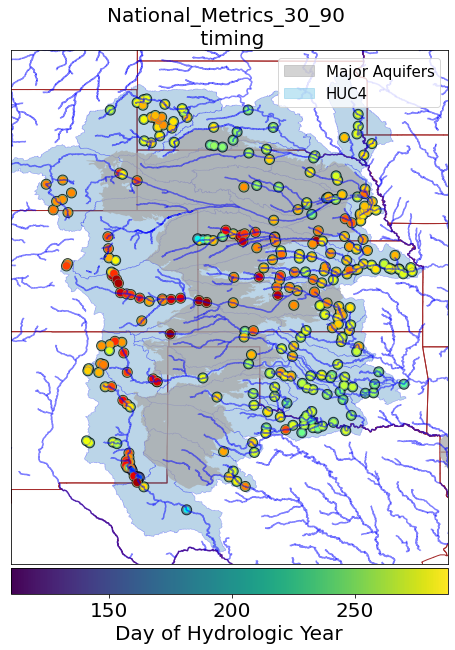

In [800]:
fig, ax = plt.subplots(figsize=(10, 10))
plt.title(f'{dataset[:-5]} \n {metric}', loc='center', fontsize=20)

# Lower-48 Plot
fn.plot_lower_48(ax)

# Plot streams
filepath = 'C:\\Users\\kondr\\Documents\\GitHub\\DahlkeLab_LAWR'
folder = 'Streams_us'
file = 'us_streams.shp'
shapefile_path = f'{filepath}\\ShapeFiles\\{folder}\\{file}'
st = gpd.read_file(shapefile_path)
#st = st.to_crs(epsg=4269)
st_plot = st.plot(ax=ax, edgecolor='blue', alpha = 0.5, legend=True)

# HUC4 Region Plot
for root, dirs, files in os.walk(aquifer.wb_dir):
    #print(root, dirs, files)
    if os.path.basename(root).startswith('NHD_H_'):
        if aquifer.wb_shapefiles in files:
            shapefile_aq_path = os.path.join(root, aquifer.wb_shapefiles)
            ws_gdf = gpd.read_file(shapefile_aq_path)
            ws_gdf = ws_gdf.to_crs(epsg=4269)
            ws_gdf.plot(ax=ax, edgecolor='blue', alpha=0.30, linewidth=0.5)

# Plot aquifers
high_plains_gdf = get_aquifer_gdf(cl.high_plains_aquifer)
high_plains_gdf.plot(ax=ax, edgecolor='none', facecolor='darkgrey', linewidth=1.25, alpha=0.75)

central_valley_gdf = get_aquifer_gdf(cl.central_valley_aquifer)
central_valley_gdf.plot(ax=ax, edgecolor='none', facecolor='darkgrey', linewidth=1.25, alpha=0.75)

meras_gdf = get_aquifer_gdf(cl.upper_clairborne_aquifer)
meras_gdf.plot(ax=ax, edgecolor='none', facecolor='darkgrey', linewidth=1.25, alpha=0.75)

xmin, ymin, xmax, ymax = high_plains_gdf.total_bounds
padding = 2.5
xmin -= padding
ymin -= padding
xmax += padding
ymax += padding

# aq_gdf.plot(ax=ax, edgecolor='red', facecolor='none', linewidth=1.25)
ax.set_xlim(xmin, xmax)
ax.set_ylim(ymin, ymax)

# Convert decimal lat/long to geo points
df_valid_geo = df_valid.reset_index()
geo_df = fn.convert_geometry(df_valid_geo)
geo_df.crs = 4269
geo_df = geo_df.merge(df_valid_geo, how='left', left_index=True, right_index=True)
#geo_df.dropna(subset=[metric+'_bin'], inplace=True)

# Set colorbar limits and theme using undivided dataset so that scale is static
cmap, mappable = fn.scale_colorbar(df_valid, metric)
div = make_axes_locatable(ax)
cax = div.append_axes("bottom", size="5%", pad=0.05)

# Watergauges plot - colormap
bx = geo_df.plot(ax=ax, column=metric, markersize=400, marker='.', cmap=cmap, edgecolor='black', linewidth=1, alpha=0.75)
cbx = plt.colorbar(mappable, cax=cax, pad=0.05, aspect=25, orientation='horizontal', alpha=1.0)
cbx.set_label(fn.FLOW_METRIC_UNITS[metric], fontsize=20)

# Watergages plot - marker size
bx = geo_df.plot(ax=ax, column=metric, markersize=geo_df[metric], marker='.', 
                 cmap='jet', linewidth=0.5, alpha=1.0, edgecolor='grey')
cbx = plt.colorbar(mappable, cax=cax, pad=0.05, aspect=25, orientation='horizontal', alpha=1.0)
cbx.set_label(fn.FLOW_METRIC_UNITS[metric])
cbx.ax.tick_params(labelsize=20)

ax.set_yticks([])
ax.set_xticks([])

# num_ticks = 12

# # Calculate the tick positions
# tick_positions = np.linspace(0, 365, num_ticks)

# # Set the tick positions and labels on the color bar
# cbx.set_ticks(tick_positions)
# cbx.set_ticklabels([f'{tick:.2f}' for tick in tick_positions])  # Format the tick labels as desired

# Plot legend
handles = []  # Store handles for legend
labels = []   # Store labels for legend
handles.extend([Patch(color='darkgrey', alpha=0.5), Patch(color='skyblue', alpha=0.5)])  # Add the handle for legend
labels.extend(['Major Aquifers', 'HUC4'])  # Add the label for legend
ax.legend(handles, labels, loc='upper right', fontsize=15)

# Save images if they don't exist or if overwrite is True
if save_img:
    img_path = f'Saved_Visuals/{dataset[:-5]}_{metric}.png'
    fn.save_plot_as_image(img_path, overwrite)
    
plt.savefig(f'Saved_Visuals/hyd201b_presentation/{aquifer_name}_{metric}.png', bbox_inches='tight')

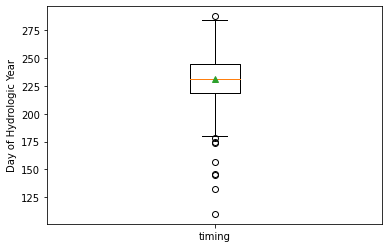

count    303.000000
mean     230.921827
std       24.676918
min      110.000000
25%      218.342262
50%      231.233333
75%      245.001277
max      287.758621
Name: timing, dtype: float64

In [801]:
def plot_hmf_metric_boxplot(df, metric):
    plt.boxplot(df[metric], showmeans=True)
    #print(boxplot['fliers'])
    plt.xticks(ticks=[1], labels=[f'{metric}'])
    plt.ylabel(fn.FLOW_METRIC_UNITS[metric])
    plt.show()
    return

def get_boxplot_outliers(df, metric):
    boxplot = plt.boxplot(df[metric], showmeans=True)
    plt.xticks(ticks=[1], labels=[f'{metric}'])
    plt.ylabel(fn.FLOW_METRIC_UNITS[metric])
    plt.show()
    
    # Extract outliers
    outliers = [flier.get_ydata() for flier in boxplot['fliers']] # note: boxplot['fliers'] is a graphical object
    # Flatten the outliers list
    outliers = [item for sublist in outliers for item in sublist]
    outlier_site_nos = df.loc[df[metric].isin(outliers), 'site_no']
    return outliers, outlier_site_nos

# All HMF metrics
#for metric in metric_list:
#    plot_hmf_metric_boxplot(df_natl_30_90, metric)

# Singular HMF metric
#plot_hmf_metric_boxplot(df_natl_30_90, metric)
outliers, outlier_site_nos = get_boxplot_outliers(df_valid, metric)
df_valid[metric].describe()

### Event HMF

In [711]:
# Metric to be plotted where metrics are column names from the dataset
metric = 'event_hmf' #'annual_hmf'

# True if you want to overwrite current images
overwrite = False
save_img = False

In [712]:
bin_1 = 0.005
bin_2 = 0.01
bin_3 = 0.1
bin_4 = 0.5
bin_5 = 1.0
bin_6 = 5.8

bin_value_1 = 100
bin_value_2 = 500
bin_value_3 = 1000
bin_value_4 = 1500
bin_value_5 = 2000
bin_value_6 = 5000

for idx, value in df_valid[metric].iteritems():
    if value >= 0 and value < bin_1:
        df_valid.at[idx, metric+'_bin'] = bin_value_1
    elif value >= bin_1 and value < bin_2:
        df_valid.at[idx, metric+'_bin'] = bin_value_2
    elif value >= bin_2 and value < bin_3:
        df_valid.at[idx, metric+'_bin'] = bin_value_3
    elif value >= bin_3 and value < bin_4:
        df_valid.at[idx, metric+'_bin'] = bin_value_4
    elif value >= bin_4 and value < bin_5:
        df_valid.at[idx, metric+'_bin'] = bin_value_5
    elif value >= bin_5 and value < bin_6:
        df_valid.at[idx, metric+'_bin'] = bin_value_6

#print(df_valid['annual_hmf_bin'])
#print(df_valid['annual_hmf'])

bin_colors = {
    bin_value_1: 'midnightblue',
    bin_value_2: 'royalblue',
    bin_value_3: 'turquoise',
    bin_value_4: 'lightgreen',
    bin_value_5: 'yellow',
    bin_value_6: 'darkorange'
}

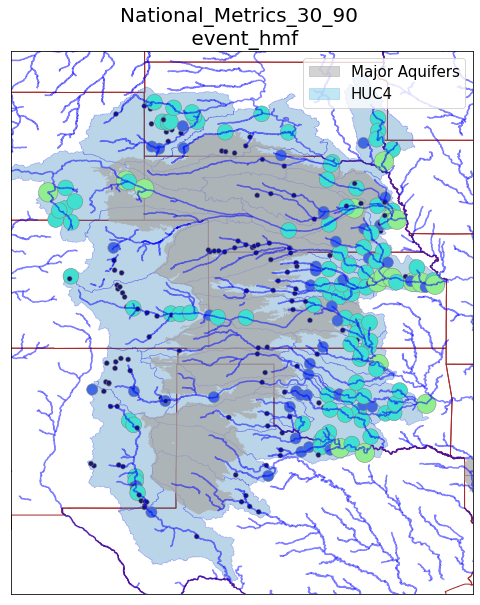

In [713]:
fig, ax = plt.subplots(figsize=(10, 10))
plt.title(f'{dataset[:-5]} \n {metric}', loc='center', fontsize=20)

# Lower-48 Plot
fn.plot_lower_48(ax)

# Plot streams
filepath = 'C:\\Users\\kondr\\Documents\\GitHub\\DahlkeLab_LAWR'
folder = 'Streams_us'
file = 'us_streams.shp'
shapefile_path = f'{filepath}\\ShapeFiles\\{folder}\\{file}'
st = gpd.read_file(shapefile_path)
#st = st.to_crs(epsg=4269)
st_plot = st.plot(ax=ax, edgecolor='blue', alpha = 0.5, legend=True)

# HUC4 Region Plot
for root, dirs, files in os.walk(aquifer.wb_dir):
    #print(root, dirs, files)
    if os.path.basename(root).startswith('NHD_H_'):
        if aquifer.wb_shapefiles in files:
            shapefile_aq_path = os.path.join(root, aquifer.wb_shapefiles)
            ws_gdf = gpd.read_file(shapefile_aq_path)
            ws_gdf = ws_gdf.to_crs(epsg=4269)
            ws_gdf.plot(ax=ax, edgecolor='blue', alpha=0.30, linewidth=0.5)

# Plot aquifers
high_plains_gdf = get_aquifer_gdf(cl.high_plains_aquifer)
high_plains_gdf.plot(ax=ax, edgecolor='none', facecolor='darkgrey', linewidth=1.25, alpha=0.75)

central_valley_gdf = get_aquifer_gdf(cl.central_valley_aquifer)
central_valley_gdf.plot(ax=ax, edgecolor='none', facecolor='darkgrey', linewidth=1.25, alpha=0.75)

meras_gdf = get_aquifer_gdf(cl.upper_clairborne_aquifer)
meras_gdf.plot(ax=ax, edgecolor='none', facecolor='darkgrey', linewidth=1.25, alpha=0.75)

xmin, ymin, xmax, ymax = high_plains_gdf.total_bounds
padding = 2.5
xmin -= padding
ymin -= padding
xmax += padding
ymax += padding

# aq_gdf.plot(ax=ax, edgecolor='red', facecolor='none', linewidth=1.25)
ax.set_xlim(xmin, xmax)
ax.set_ylim(ymin, ymax)

# Convert decimal lat/long to geo points
df_valid_geo = df_valid.reset_index()
geo_df = fn.convert_geometry(df_valid_geo)
geo_df.crs = 4269
geo_df = geo_df.merge(df_valid_geo, how='left', left_index=True, right_index=True)
geo_df.dropna(subset=[metric+'_bin'], inplace=True)

# Set colorbar limits and theme using undivided dataset so that scale is static
#cmap, mappable = fn.scale_colorbar(df_valid, metric)
#div = make_axes_locatable(ax)
#cax = div.append_axes("bottom", size="5%", pad=0.05)

# Watergauges plot - colormap
#bx = geo_df.plot(ax=ax, column='inter_annual', markersize=300, marker='.', cmap=cmap, edgecolor='black', linewidth=1, alpha=0.75)
#cbx = plt.colorbar(mappable, cax=cax, pad=0.05, aspect=25, orientation='horizontal', alpha=1.0)
#cbx.set_label(fn.FLOW_METRIC_UNITS[metric])

# Watergages plot - marker size
bx = geo_df.plot(ax=ax, markersize=geo_df[metric+'_bin'], marker='.', 
                 color=[bin_colors[bin_val] for bin_val in geo_df[metric+'_bin']], linewidth=0.5, alpha=1.0, edgecolor='grey') #column=metric
#cbx = plt.colorbar(mappable, cax=cax, pad=0.05, aspect=25, orientation='horizontal', alpha=1.0)
#cbx.set_label(fn.FLOW_METRIC_UNITS[metric])

ax.set_yticks([])
ax.set_xticks([])

# Plot legend
handles = []  # Store handles for legend
labels = []   # Store labels for legend
handles.extend([Patch(color='darkgrey', alpha=0.5), Patch(color='skyblue', alpha=0.5)])  # Add the handle for legend
labels.extend(['Major Aquifers', 'HUC4'])  # Add the label for legend
ax.legend(handles, labels, loc='upper right', fontsize=15)

# Save images if they don't exist or if overwrite is True
if save_img:
    img_path = f'Saved_Visuals/{dataset[:-5]}_{metric}.png'
    fn.save_plot_as_image(img_path, overwrite)
    
plt.savefig(f'Saved_Visuals/hyd201b_presentation/{aquifer_name}_{metric}.png', bbox_inches='tight')

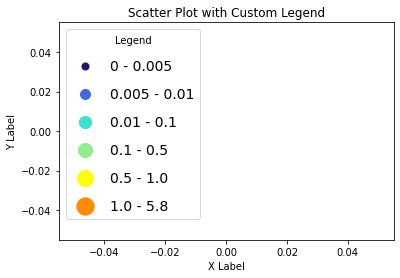

In [714]:
import matplotlib.patches as mpatches

# Define bin values and corresponding colors
bin_values = [bin_value_1, bin_value_2, bin_value_3, bin_value_4, bin_value_5, bin_value_6]
bin_colors = ['midnightblue', 'royalblue', 'turquoise', 'lightgreen', 'yellow', 'darkorange']

# Define bin ranges
bin_ranges = [(0, bin_1), (bin_1, bin_2), (bin_2, bin_3), (bin_3, bin_4), (bin_4, bin_5), (bin_5, bin_6)]

# Define marker sizes corresponding to bin values
marker_sizes = [50, 100, 150, 200, 250, 300]

# Plot dummy points for the legend
for i in range(len(bin_values)):
    plt.scatter([], [], c=bin_colors[i], s=marker_sizes[i], label=f'{bin_ranges[i][0]} - {bin_ranges[i][1]}')

# Create custom legend with markers, sizes, bin ranges, and colors
plt.legend(scatterpoints=1, frameon=True, labelspacing=1, title='Legend', loc='upper left', fontsize=14)

plt.xlabel('X Label')
plt.ylabel('Y Label')
plt.title('Scatter Plot with Custom Legend')

plt.savefig(f'Saved_Visuals/hyd201b_presentation/{dataset[:-5]}_{metric}_legend.png', bbox_inches='tight')

plt.show()

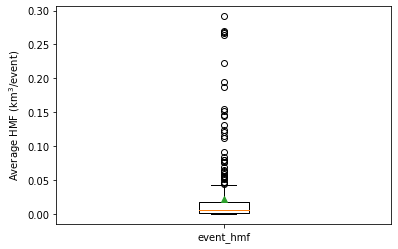

count    303.000000
mean       0.022097
std        0.045998
min        0.000036
25%        0.001871
50%        0.005892
75%        0.018439
max        0.291462
Name: event_hmf, dtype: float64

In [715]:
def plot_hmf_metric_boxplot(df, metric):
    plt.boxplot(df[metric], showmeans=True)
    #print(boxplot['fliers'])
    plt.xticks(ticks=[1], labels=[f'{metric}'])
    plt.ylabel(fn.FLOW_METRIC_UNITS[metric])
    plt.show()
    return

def get_boxplot_outliers(df, metric):
    boxplot = plt.boxplot(df[metric], showmeans=True)
    plt.xticks(ticks=[1], labels=[f'{metric}'])
    plt.ylabel(fn.FLOW_METRIC_UNITS[metric])
    plt.show()
    
    # Extract outliers
    outliers = [flier.get_ydata() for flier in boxplot['fliers']] # note: boxplot['fliers'] is a graphical object
    # Flatten the outliers list
    outliers = [item for sublist in outliers for item in sublist]
    outlier_site_nos = df.loc[df[metric].isin(outliers), 'site_no']
    return outliers, outlier_site_nos

# All HMF metrics
#for metric in metric_list:
#    plot_hmf_metric_boxplot(df_natl_30_90, metric)

# Singular HMF metric
#plot_hmf_metric_boxplot(df_natl_30_90, metric)
outliers, outlier_site_nos = get_boxplot_outliers(df_valid, metric)
df_valid[metric].describe()

### Event duration

In [734]:
# Metric to be plotted where metrics are column names from the dataset
metric = 'event_duration' #'annual_hmf'

# True if you want to overwrite current images
overwrite = False
save_img = False

In [735]:
# Event duration
bin_1 = 3
bin_2 = 7
bin_3 = 10
bin_4 = 15
bin_5 = 20
bin_6 = 30
bin_7 = 40
bin_8 = 72

bin_value_1 = 10
bin_value_2 = 200
bin_value_3 = 400
bin_value_4 = 600
bin_value_5 = 800
bin_value_6 = 1000
bin_value_7 = 1200
bin_value_8 = 1400

for idx, value in df_valid[metric].iteritems():
    if value >= 0 and value < bin_1:
        df_valid.at[idx, metric+'_bin'] = bin_value_1
    elif value >= bin_1 and value < bin_2:
        df_valid.at[idx, metric+'_bin'] = bin_value_2
    elif value >= bin_2 and value < bin_3:
        df_valid.at[idx, metric+'_bin'] = bin_value_3
    elif value >= bin_3 and value < bin_4:
        df_valid.at[idx, metric+'_bin'] = bin_value_4
    elif value >= bin_4 and value < bin_5:
        df_valid.at[idx, metric+'_bin'] = bin_value_5
    elif value >= bin_5 and value < bin_6:
        df_valid.at[idx, metric+'_bin'] = bin_value_6
    elif value >= bin_6 and value < bin_7:
        df_valid.at[idx, metric+'_bin'] = bin_value_7
    elif value >= bin_7 and value < bin_8:
        df_valid.at[idx, metric+'_bin'] = bin_value_8
        
#print(df_valid['annual_hmf_bin'])
#print(df_valid['annual_hmf'])

bin_colors = {
    bin_value_1: 'midnightblue',
    bin_value_2: 'royalblue',
    bin_value_3: 'turquoise',
    bin_value_4: 'lightblue',
    bin_value_5: 'purple',
    bin_value_6: 'red',
    bin_value_7: 'darkorange',
    bin_value_8: 'yellow'
}

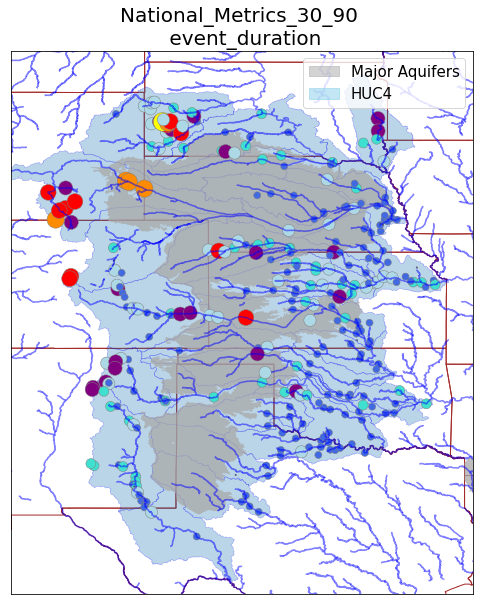

In [736]:
fig, ax = plt.subplots(figsize=(10, 10))
plt.title(f'{dataset[:-5]} \n {metric}', loc='center', fontsize=20)

# Lower-48 Plot
fn.plot_lower_48(ax)

# Plot streams
filepath = 'C:\\Users\\kondr\\Documents\\GitHub\\DahlkeLab_LAWR'
folder = 'Streams_us'
file = 'us_streams.shp'
shapefile_path = f'{filepath}\\ShapeFiles\\{folder}\\{file}'
st = gpd.read_file(shapefile_path)
#st = st.to_crs(epsg=4269)
st_plot = st.plot(ax=ax, edgecolor='blue', alpha = 0.5, legend=True)

# HUC4 Region Plot
for root, dirs, files in os.walk(aquifer.wb_dir):
    #print(root, dirs, files)
    if os.path.basename(root).startswith('NHD_H_'):
        if aquifer.wb_shapefiles in files:
            shapefile_aq_path = os.path.join(root, aquifer.wb_shapefiles)
            ws_gdf = gpd.read_file(shapefile_aq_path)
            ws_gdf = ws_gdf.to_crs(epsg=4269)
            ws_gdf.plot(ax=ax, edgecolor='blue', alpha=0.30, linewidth=0.5)

# Plot aquifers
high_plains_gdf = get_aquifer_gdf(cl.high_plains_aquifer)
high_plains_gdf.plot(ax=ax, edgecolor='none', facecolor='darkgrey', linewidth=1.25, alpha=0.75)

central_valley_gdf = get_aquifer_gdf(cl.central_valley_aquifer)
central_valley_gdf.plot(ax=ax, edgecolor='none', facecolor='darkgrey', linewidth=1.25, alpha=0.75)

meras_gdf = get_aquifer_gdf(cl.upper_clairborne_aquifer)
meras_gdf.plot(ax=ax, edgecolor='none', facecolor='darkgrey', linewidth=1.25, alpha=0.75)

xmin, ymin, xmax, ymax = high_plains_gdf.total_bounds
padding = 2.5
xmin -= padding
ymin -= padding
xmax += padding
ymax += padding

# aq_gdf.plot(ax=ax, edgecolor='red', facecolor='none', linewidth=1.25)
ax.set_xlim(xmin, xmax)
ax.set_ylim(ymin, ymax)

# Convert decimal lat/long to geo points
df_valid_geo = df_valid.reset_index()
geo_df = fn.convert_geometry(df_valid_geo)
geo_df.crs = 4269
geo_df = geo_df.merge(df_valid_geo, how='left', left_index=True, right_index=True)
#geo_df.dropna(subset=[metric+'_bin'], inplace=True)

# Set colorbar limits and theme using undivided dataset so that scale is static
#cmap, mappable = fn.scale_colorbar(df_valid, metric)
#div = make_axes_locatable(ax)
#cax = div.append_axes("bottom", size="5%", pad=0.05)

# Watergauges plot - colormap
#bx = geo_df.plot(ax=ax, column='inter_annual', markersize=300, marker='.', cmap=cmap, edgecolor='black', linewidth=1, alpha=0.75)
#cbx = plt.colorbar(mappable, cax=cax, pad=0.05, aspect=25, orientation='horizontal', alpha=1.0)
#cbx.set_label(fn.FLOW_METRIC_UNITS[metric])

# Watergages plot - marker size
bx = geo_df.plot(ax=ax, markersize=geo_df[metric+'_bin'], marker='.', 
                 color=[bin_colors[bin_val] for bin_val in geo_df[metric+'_bin']], linewidth=0.5, alpha=1.0, edgecolor='grey') #column=metric
#cbx = plt.colorbar(mappable, cax=cax, pad=0.05, aspect=25, orientation='horizontal', alpha=1.0)
#cbx.set_label(fn.FLOW_METRIC_UNITS[metric])

ax.set_yticks([])
ax.set_xticks([])

# Plot legend
handles = []  # Store handles for legend
labels = []   # Store labels for legend
handles.extend([Patch(color='darkgrey', alpha=0.5), Patch(color='skyblue', alpha=0.5)])  # Add the handle for legend
labels.extend(['Major Aquifers', 'HUC4'])  # Add the label for legend
ax.legend(handles, labels, loc='upper right', fontsize=15)

# Save images if they don't exist or if overwrite is True
if save_img:
    img_path = f'Saved_Visuals/{dataset[:-5]}_{metric}.png'
    fn.save_plot_as_image(img_path, overwrite)
    
plt.savefig(f'Saved_Visuals/hyd201b_presentation/{aquifer_name}_{metric}.png', bbox_inches='tight')

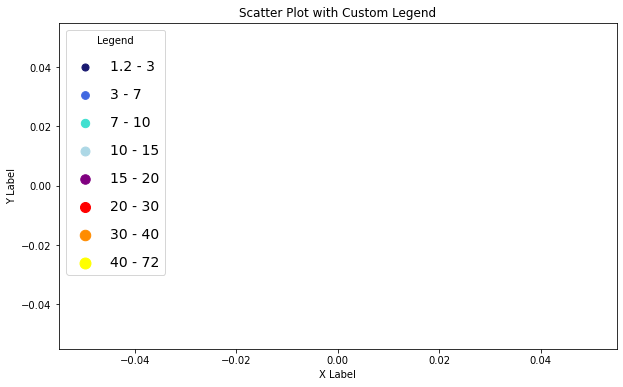

In [737]:
import matplotlib.patches as mpatches

# Define bin values and corresponding colors
bin_values = [bin_value_1, bin_value_2, bin_value_3, bin_value_4, bin_value_5, bin_value_6, bin_value_7, bin_value_8]
bin_colors = ['midnightblue', 'royalblue', 'turquoise', 'lightblue', 'purple', 'red', 'darkorange', 'yellow']

# Define bin ranges
bin_ranges = [(1.2, bin_1), (bin_1, bin_2), (bin_2, bin_3), (bin_3, bin_4), (bin_4, bin_5), (bin_5, bin_6), (bin_6, bin_7), (bin_7, bin_8)]

# Define marker sizes corresponding to bin values
marker_sizes = [50, 60, 70, 80, 90, 100, 110, 120]

# Plot dummy points for the legend
plt.figure(figsize=(10, 6))
for i in range(len(bin_values)):
    plt.scatter([], [], c=bin_colors[i], s=marker_sizes[i], label=f'{bin_ranges[i][0]} - {bin_ranges[i][1]}')

# Create custom legend with markers, sizes, bin ranges, and colors
plt.legend(scatterpoints=1, frameon=True, labelspacing=1, title='Legend', loc='upper left', fontsize=14)

plt.xlabel('X Label')
plt.ylabel('Y Label')
plt.title('Scatter Plot with Custom Legend')

plt.savefig(f'Saved_Visuals/hyd201b_presentation/{dataset[:-5]}_{metric}_legend.png', bbox_inches='tight')

plt.show()

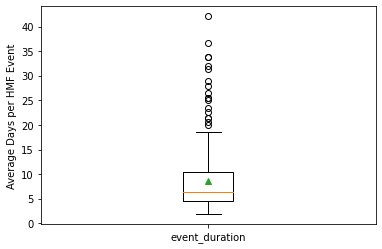

count    303.000000
mean       8.590697
std        6.290736
min        1.884343
25%        4.617310
50%        6.361530
75%       10.433288
max       42.077083
Name: event_duration, dtype: float64

In [738]:
def plot_hmf_metric_boxplot(df, metric):
    plt.boxplot(df[metric], showmeans=True)
    #print(boxplot['fliers'])
    plt.xticks(ticks=[1], labels=[f'{metric}'])
    plt.ylabel(fn.FLOW_METRIC_UNITS[metric])
    plt.show()
    return

def get_boxplot_outliers(df, metric):
    boxplot = plt.boxplot(df[metric], showmeans=True)
    plt.xticks(ticks=[1], labels=[f'{metric}'])
    plt.ylabel(fn.FLOW_METRIC_UNITS[metric])
    plt.show()
    
    # Extract outliers
    outliers = [flier.get_ydata() for flier in boxplot['fliers']] # note: boxplot['fliers'] is a graphical object
    # Flatten the outliers list
    outliers = [item for sublist in outliers for item in sublist]
    outlier_site_nos = df.loc[df[metric].isin(outliers), 'site_no']
    return outliers, outlier_site_nos

# All HMF metrics
#for metric in metric_list:
#    plot_hmf_metric_boxplot(df_natl_30_90, metric)

# Singular HMF metric
#plot_hmf_metric_boxplot(df_natl_30_90, metric)
outliers, outlier_site_nos = get_boxplot_outliers(df_valid, metric)
df_valid[metric].describe()

## Plot HMF metrics - MERAS Aquifer

In [886]:
# Load dataset
data_range = 30
percentile = 90
folder = 'National_Metrics'
dataset = f'National_Metrics_{data_range}_{percentile}.xlsx'
datapath = f'Prelim_Data/{folder}/{dataset}'
lower_48_shp_path = 'ShapeFiles/Lower48/lower48.shp'

df_metrics = pd.read_excel(datapath, sheet_name='site_metrics')
df_valid = df_metrics[df_metrics['valid'] == True]

In [887]:
# Select aquifer
aquifer = cl.upper_clairborne_aquifer
aquifer_name = 'meras'
df_valid = df_valid[df_valid['huc4_code'].isin(aquifer.huc4s)]

### Annual HMF

In [692]:
# Metric to be plotted where metrics are column names from the dataset
metric = 'annual_hmf'

# True if you want to overwrite current images
overwrite = False
save_img = False

In [693]:
# Annual HMF 
bin_1 = 0.2
bin_2 = 0.7
bin_3 = 1.6
bin_4 = 3.0
bin_5 = 6.0
bin_6 = 14.1

bin_value_1 = 100
bin_value_2 = 500
bin_value_3 = 1000
bin_value_4 = 1500
bin_value_5 = 2000
bin_value_6 = 5000

for idx, value in df_valid[metric].iteritems():
    if value >= 0 and value < bin_1:
        df_valid.at[idx, metric+'_bin'] = bin_value_1
    elif value >= bin_1 and value < bin_2:
        df_valid.at[idx, metric+'_bin'] = bin_value_2
    elif value >= bin_2 and value < bin_3:
        df_valid.at[idx, metric+'_bin'] = bin_value_3
    elif value >= bin_3 and value < bin_4:
        df_valid.at[idx, metric+'_bin'] = bin_value_4
    elif value >= bin_4 and value < bin_5:
        df_valid.at[idx, metric+'_bin'] = bin_value_5
    elif value >= bin_5 and value < bin_6:
        df_valid.at[idx, metric+'_bin'] = bin_value_6

#print(df_valid['annual_hmf_bin'])
#print(df_valid['annual_hmf'])

bin_colors = {
    bin_value_1: 'midnightblue',
    bin_value_2: 'royalblue',
    bin_value_3: 'turquoise',
    bin_value_4: 'lightgreen',
    bin_value_5: 'yellow',
    bin_value_6: 'darkorange'
}

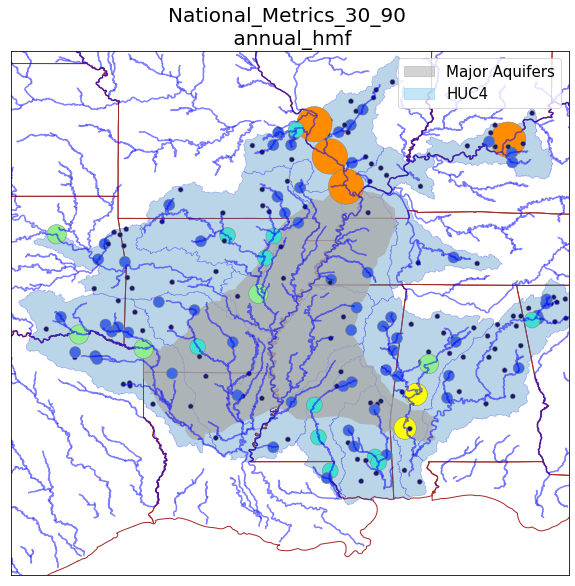

In [694]:
fig, ax = plt.subplots(figsize=(10, 10))
plt.title(f'{dataset[:-5]} \n {metric}', loc='center', fontsize=20)

# Lower-48 Plot
fn.plot_lower_48(ax)

# Plot streams
filepath = 'C:\\Users\\kondr\\Documents\\GitHub\\DahlkeLab_LAWR'
folder = 'Streams_us'
file = 'us_streams.shp'
shapefile_path = f'{filepath}\\ShapeFiles\\{folder}\\{file}'
st = gpd.read_file(shapefile_path)
#st = st.to_crs(epsg=4269)
st_plot = st.plot(ax=ax, edgecolor='blue', alpha = 0.5, legend=True)

# HUC4 Region Plot
for root, dirs, files in os.walk(aquifer.wb_dir):
    #print(root, dirs, files)
    if os.path.basename(root).startswith('NHD_H_'):
        if aquifer.wb_shapefiles in files:
            shapefile_aq_path = os.path.join(root, aquifer.wb_shapefiles)
            ws_gdf = gpd.read_file(shapefile_aq_path)
            ws_gdf = ws_gdf.to_crs(epsg=4269)
            ws_gdf.plot(ax=ax, edgecolor='blue', alpha=0.30, linewidth=0.5)

# Plot aquifers
high_plains_gdf = get_aquifer_gdf(cl.high_plains_aquifer)
high_plains_gdf.plot(ax=ax, edgecolor='none', facecolor='darkgrey', linewidth=1.25, alpha=0.75)

central_valley_gdf = get_aquifer_gdf(cl.central_valley_aquifer)
central_valley_gdf.plot(ax=ax, edgecolor='none', facecolor='darkgrey', linewidth=1.25, alpha=0.75)

meras_gdf = get_aquifer_gdf(cl.upper_clairborne_aquifer)
meras_gdf.plot(ax=ax, edgecolor='none', facecolor='darkgrey', linewidth=1.25, alpha=0.75)

xmin, ymin, xmax, ymax = meras_gdf.total_bounds
padding = 3.0
xmin -= padding
ymin -= padding
xmax += padding
ymax += padding

#aq_gdf.plot(ax=ax, edgecolor='red', facecolor='none', linewidth=1.25)
ax.set_xlim(xmin, xmax)
ax.set_ylim(ymin, ymax)

# Convert decimal lat/long to geo points
df_valid_geo = df_valid.reset_index()
geo_df = fn.convert_geometry(df_valid_geo)
geo_df.crs = 4269
geo_df = geo_df.merge(df_valid_geo, how='left', left_index=True, right_index=True)
geo_df.dropna(subset=[metric+'_bin'], inplace=True)

# Set colorbar limits and theme using undivided dataset so that scale is static
#cmap, mappable = fn.scale_colorbar(df_valid, metric)
#div = make_axes_locatable(ax)
#cax = div.append_axes("bottom", size="5%", pad=0.05)

# Watergauges plot - colormap
#bx = geo_df.plot(ax=ax, column='inter_annual', markersize=300, marker='.', cmap=cmap, edgecolor='black', linewidth=1, alpha=0.75)
#cbx = plt.colorbar(mappable, cax=cax, pad=0.05, aspect=25, orientation='horizontal', alpha=1.0)
#cbx.set_label(fn.FLOW_METRIC_UNITS[metric])

# Watergages plot - marker size
bx = geo_df.plot(ax=ax, markersize=geo_df[metric+'_bin'], marker='.', 
                 color=[bin_colors[bin_val] for bin_val in geo_df[metric+'_bin']], linewidth=0.5, alpha=1.0, edgecolor='grey') #column=metric
#cbx = plt.colorbar(mappable, cax=cax, pad=0.05, aspect=25, orientation='horizontal', alpha=1.0)
#cbx.set_label(fn.FLOW_METRIC_UNITS[metric])

ax.set_yticks([])
ax.set_xticks([])

# Plot legend
handles = []  # Store handles for legend
labels = []   # Store labels for legend
handles.extend([Patch(color='darkgrey', alpha=0.5), Patch(color='skyblue', alpha=0.5)])  # Add the handle for legend
labels.extend(['Major Aquifers', 'HUC4'])  # Add the label for legend
ax.legend(handles, labels, loc='upper right', fontsize=15)

# Save images if they don't exist or if overwrite is True
if save_img:
    img_path = f'Saved_Visuals/{dataset[:-5]}_{metric}.png'
    fn.save_plot_as_image(img_path, overwrite)

plt.savefig(f'Saved_Visuals/hyd201b_presentation/{aquifer_name}_{metric}.png', bbox_inches='tight')

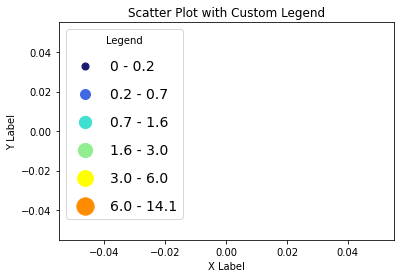

In [489]:
import matplotlib.patches as mpatches

# Define bin values and corresponding colors
bin_values = [bin_value_1, bin_value_2, bin_value_3, bin_value_4, bin_value_5, bin_value_6]
bin_colors = ['midnightblue', 'royalblue', 'turquoise', 'lightgreen', 'yellow', 'darkorange']

# Define bin ranges
bin_ranges = [(0, bin_1), (bin_1, bin_2), (bin_2, bin_3), (bin_3, bin_4), (bin_4, bin_5), (bin_5, bin_6)]

# Define marker sizes corresponding to bin values
marker_sizes = [50, 100, 150, 200, 250, 300]

# Plot dummy points for the legend
for i in range(len(bin_values)):
    plt.scatter([], [], c=bin_colors[i], s=marker_sizes[i], label=f'{bin_ranges[i][0]} - {bin_ranges[i][1]}')

# Create custom legend with markers, sizes, bin ranges, and colors
plt.legend(scatterpoints=1, frameon=True, labelspacing=1, title='Legend', loc='upper left', fontsize=14)

plt.xlabel('X Label')
plt.ylabel('Y Label')
plt.title('Scatter Plot with Custom Legend')
plt.savefig(f'Saved_Visuals/hyd201b_presentation/{aquifer_name}_{metric}_legend.png', bbox_inches='tight')
plt.show()

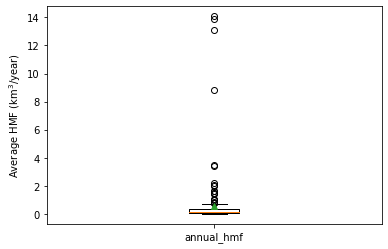

count    200.000000
mean       0.545303
std        1.799911
min        0.004318
25%        0.076886
50%        0.147637
75%        0.340781
max       14.069366
Name: annual_hmf, dtype: float64

In [490]:
def plot_hmf_metric_boxplot(df, metric):
    plt.boxplot(df[metric], showmeans=True)
    #print(boxplot['fliers'])
    plt.xticks(ticks=[1], labels=[f'{metric}'])
    plt.ylabel(fn.FLOW_METRIC_UNITS[metric])
    plt.show()
    return

def get_boxplot_outliers(df, metric):
    boxplot = plt.boxplot(df[metric], showmeans=True)
    plt.xticks(ticks=[1], labels=[f'{metric}'])
    plt.ylabel(fn.FLOW_METRIC_UNITS[metric])
    plt.show()
    
    # Extract outliers
    outliers = [flier.get_ydata() for flier in boxplot['fliers']] # note: boxplot['fliers'] is a graphical object
    # Flatten the outliers list
    outliers = [item for sublist in outliers for item in sublist]
    outlier_site_nos = df.loc[df[metric].isin(outliers), 'site_no']
    return outliers, outlier_site_nos

# All HMF metrics
#for metric in metric_list:
#    plot_hmf_metric_boxplot(df_natl_30_90, metric)

# Singular HMF metric
#plot_hmf_metric_boxplot(df_natl_30_90, metric)
outliers, outlier_site_nos = get_boxplot_outliers(df_valid, metric)
df_valid[metric].describe()

In [494]:
df_valid_meras = df_valid.sort_values(by='annual_hmf')
df_valid_meras.tail(10)

,site_no,analyze_start,analyze_end,analyze_range,quantile,valid,missing_data%,threshold,hmf_years,annual_hmf,...,dec_long_va,data_start,data_end,total_record,state,huc2_code,huc4_code,aquifer,HCDN_2009,annual_hmf_bin
2827,7335500,1990-10-01,2020-09-30,30,0.9,True,0,29100.0,24,1.649502,...,-95.501902,1905-10-01,2020-09-30,115.0,OK,11,1114,NaN,False,1500.0
2685,7164500,1990-10-01,2020-09-30,30,0.9,True,0,24300.0,24,1.975803,...,-96.006387,1925-10-01,2020-09-30,95.0,OK,11,1111,NaN,False,1500.0
2628,7077000,1990-10-01,2020-09-30,30,0.9,True,0,55600.0,23,2.052730,...,-91.444722,1949-10-01,2020-09-30,71.0,AR,8,802,NaN,False,1500.0
2829,7337000,1990-10-01,2020-09-30,30,0.9,True,0,39800.0,23,2.211587,...,-94.041111,1936-10-01,2020-09-30,84.0,AR,11,1114,NaN,False,1500.0
1047,2467000,1990-10-01,2019-10-08,30,0.9,True,3,65600.0,29,3.424506,...,-87.878348,1928-08-01,2019-10-08,91.2,AL,3,316,NaN,False,2000.0
1049,2469761,1990-10-01,2020-09-30,30,0.9,True,0,77800.0,29,3.461525,...,-88.129176,1960-10-01,2020-09-30,60.0,AL,3,316,NaN,False,2000.0
1323,3294500,1990-10-01,2020-09-30,30,0.9,True,0,306000.0,30,8.846980,...,-85.799131,1928-01-01,2020-09-30,92.7,KY,5,514,NaN,False,5000.0
2567,7010000,1990-10-01,2020-09-30,30,0.9,True,0,453000.0,23,13.082159,...,-90.179778,1900-10-01,2020-09-30,120.0,MO,7,714,NaN,False,5000.0
2579,7022000,1990-10-01,2020-09-30,30,0.9,True,0,491000.0,22,13.891322,...,-89.463167,1933-04-01,2020-09-30,87.5,IL,7,714,NaN,False,5000.0
2577,7020500,1990-10-01,2020-09-30,30,0.9,True,0,471000.0,22,14.069366,...,-89.830222,1942-07-01,2020-09-30,78.3,IL,7,714,NaN,False,5000.0


### Annual duration

In [823]:
# Metric to be plotted where metrics are column names from the dataset
metric = 'annual_duration' #'annual_hmf'

# True if you want to overwrite current images
overwrite = False
save_img = False

In [824]:
# Annual duration
bin_1 = 20
bin_2 = 30
bin_3 = 35
bin_4 = 40
bin_5 = 45
bin_6 = 55
bin_7 = 75
bin_8 = 157

bin_value_1 = 10
bin_value_2 = 200
bin_value_3 = 400
bin_value_4 = 600
bin_value_5 = 800
bin_value_6 = 1000
bin_value_7 = 1200
bin_value_8 = 1400

for idx, value in df_valid[metric].iteritems():
    if value >= 0 and value < bin_1:
        df_valid.at[idx, metric+'_bin'] = bin_value_1
    elif value >= bin_1 and value < bin_2:
        df_valid.at[idx, metric+'_bin'] = bin_value_2
    elif value >= bin_2 and value < bin_3:
        df_valid.at[idx, metric+'_bin'] = bin_value_3
    elif value >= bin_3 and value < bin_4:
        df_valid.at[idx, metric+'_bin'] = bin_value_4
    elif value >= bin_4 and value < bin_5:
        df_valid.at[idx, metric+'_bin'] = bin_value_5
    elif value >= bin_5 and value < bin_6:
        df_valid.at[idx, metric+'_bin'] = bin_value_6
    elif value >= bin_6 and value < bin_7:
        df_valid.at[idx, metric+'_bin'] = bin_value_7
    elif value >= bin_7 and value < bin_8:
        df_valid.at[idx, metric+'_bin'] = bin_value_8
        
#print(df_valid['annual_hmf_bin'])
#print(df_valid['annual_hmf'])

bin_colors = {
    bin_value_1: 'midnightblue',
    bin_value_2: 'royalblue',
    bin_value_3: 'turquoise',
    bin_value_4: 'lightblue',
    bin_value_5: 'purple',
    bin_value_6: 'red',
    bin_value_7: 'darkorange',
    bin_value_8: 'yellow'
}

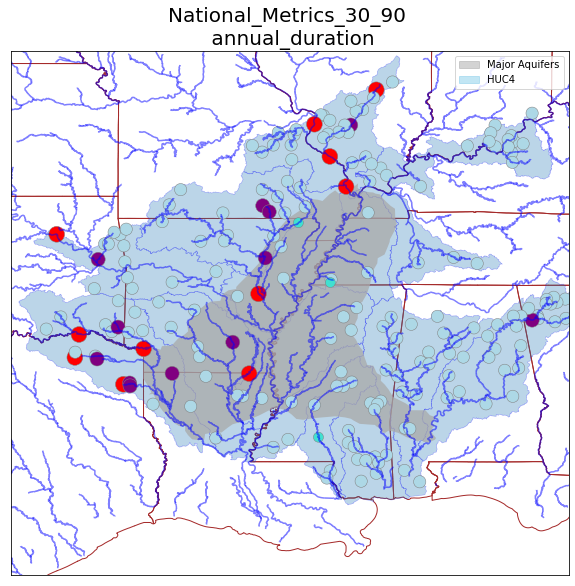

In [825]:
fig, ax = plt.subplots(figsize=(10, 10))
plt.title(f'{dataset[:-5]} \n {metric}', loc='center', fontsize=20)

# Lower-48 Plot
fn.plot_lower_48(ax)

# Plot streams
filepath = 'C:\\Users\\kondr\\Documents\\GitHub\\DahlkeLab_LAWR'
folder = 'Streams_us'
file = 'us_streams.shp'
shapefile_path = f'{filepath}\\ShapeFiles\\{folder}\\{file}'
st = gpd.read_file(shapefile_path)
#st = st.to_crs(epsg=4269)
st_plot = st.plot(ax=ax, edgecolor='blue', alpha = 0.5, legend=True)

# HUC4 Region Plot
for root, dirs, files in os.walk(aquifer.wb_dir):
    #print(root, dirs, files)
    if os.path.basename(root).startswith('NHD_H_'):
        if aquifer.wb_shapefiles in files:
            shapefile_aq_path = os.path.join(root, aquifer.wb_shapefiles)
            ws_gdf = gpd.read_file(shapefile_aq_path)
            ws_gdf = ws_gdf.to_crs(epsg=4269)
            ws_gdf.plot(ax=ax, edgecolor='blue', alpha=0.30, linewidth=0.5)

# Plot aquifers
high_plains_gdf = get_aquifer_gdf(cl.high_plains_aquifer)
high_plains_gdf.plot(ax=ax, edgecolor='none', facecolor='darkgrey', linewidth=1.25, alpha=0.75)

central_valley_gdf = get_aquifer_gdf(cl.central_valley_aquifer)
central_valley_gdf.plot(ax=ax, edgecolor='none', facecolor='darkgrey', linewidth=1.25, alpha=0.75)

meras_gdf = get_aquifer_gdf(cl.upper_clairborne_aquifer)
meras_gdf.plot(ax=ax, edgecolor='none', facecolor='darkgrey', linewidth=1.25, alpha=0.75)

xmin, ymin, xmax, ymax = meras_gdf.total_bounds
padding = 3.0
xmin -= padding
ymin -= padding
xmax += padding
ymax += padding

# aq_gdf.plot(ax=ax, edgecolor='red', facecolor='none', linewidth=1.25)
ax.set_xlim(xmin, xmax)
ax.set_ylim(ymin, ymax)

# Convert decimal lat/long to geo points
df_valid_geo = df_valid.reset_index()
geo_df = fn.convert_geometry(df_valid_geo)
geo_df.crs = 4269
geo_df = geo_df.merge(df_valid_geo, how='left', left_index=True, right_index=True)
geo_df.dropna(subset=[metric+'_bin'], inplace=True)

# Set colorbar limits and theme using undivided dataset so that scale is static
#cmap, mappable = fn.scale_colorbar(df_valid, metric)
#div = make_axes_locatable(ax)
#cax = div.append_axes("bottom", size="5%", pad=0.05)

# Watergauges plot - colormap
#bx = geo_df.plot(ax=ax, column='inter_annual', markersize=300, marker='.', cmap=cmap, edgecolor='black', linewidth=1, alpha=0.75)
#cbx = plt.colorbar(mappable, cax=cax, pad=0.05, aspect=25, orientation='horizontal', alpha=1.0)
#cbx.set_label(fn.FLOW_METRIC_UNITS[metric])

# Watergages plot - marker size
bx = geo_df.plot(ax=ax, markersize=geo_df[metric+'_bin'], marker='.', 
                 color=[bin_colors[bin_val] for bin_val in geo_df[metric+'_bin']], linewidth=0.5, alpha=1.0, edgecolor='grey') #column=metric
#cbx = plt.colorbar(mappable, cax=cax, pad=0.05, aspect=25, orientation='horizontal', alpha=1.0)
#cbx.set_label(fn.FLOW_METRIC_UNITS[metric])

ax.set_yticks([])
ax.set_xticks([])

# Plot legend
handles = []  # Store handles for legend
labels = []   # Store labels for legend
handles.extend([Patch(color='darkgrey', alpha=0.5), Patch(color='skyblue', alpha=0.5)])  # Add the handle for legend
labels.extend(['Major Aquifers', 'HUC4'])  # Add the label for legend
ax.legend(handles, labels, loc='upper right', fontsize=10)

# Save images if they don't exist or if overwrite is True
if save_img:
    img_path = f'Saved_Visuals/{dataset[:-5]}_{metric}.png'
    fn.save_plot_as_image(img_path, overwrite)

plt.savefig(f'Saved_Visuals/hyd201b_presentation/{aquifer_name}_{metric}.png', bbox_inches='tight')

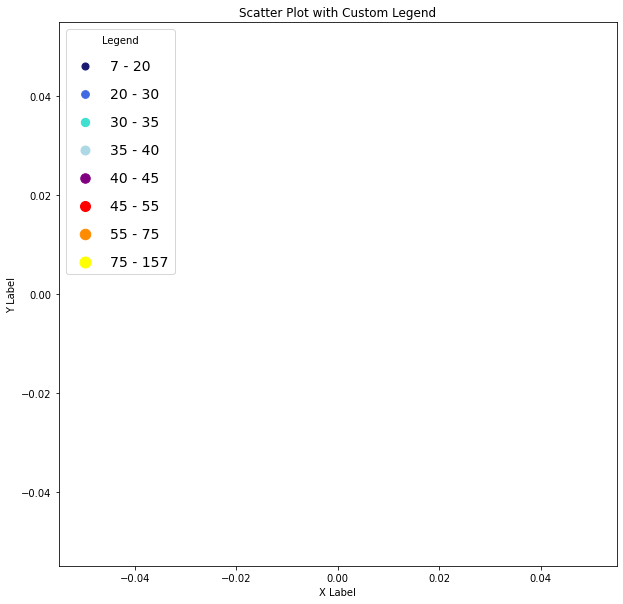

In [812]:
import matplotlib.patches as mpatches

# Define bin values and corresponding colors
bin_values = [bin_value_1, bin_value_2, bin_value_3, bin_value_4, bin_value_5, bin_value_6, bin_value_7, bin_value_8]
bin_colors = ['midnightblue', 'royalblue', 'turquoise', 'lightblue', 'purple', 'red', 'darkorange', 'yellow']

# Define bin ranges
bin_ranges = [(7, bin_1), (bin_1, bin_2), (bin_2, bin_3), (bin_3, bin_4), (bin_4, bin_5), (bin_5, bin_6), (bin_6, bin_7), (bin_7, bin_8)]

# Define marker sizes corresponding to bin values
marker_sizes = [50, 60, 70, 80, 90, 100, 110, 120]

# Plot dummy points for the legend
plt.figure(figsize=(10, 10))
for i in range(len(bin_values)):
    plt.scatter([], [], c=bin_colors[i], s=marker_sizes[i], label=f'{bin_ranges[i][0]} - {bin_ranges[i][1]}')

# Create custom legend with markers, sizes, bin ranges, and colors
plt.legend(scatterpoints=1, frameon=True, labelspacing=1, title='Legend', loc='upper left', fontsize=14)

plt.xlabel('X Label')
plt.ylabel('Y Label')
plt.title('Scatter Plot with Custom Legend')

plt.savefig(f'Saved_Visuals/hyd201b_presentation/{dataset[:-5]}_{metric}_legend.png', bbox_inches='tight')

plt.show()

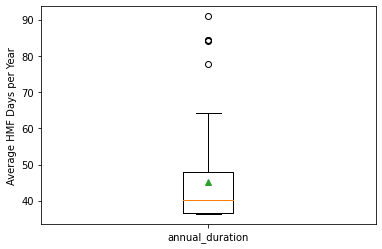

count    67.000000
mean     45.232667
std      13.099989
min      36.333333
25%      36.533333
50%      40.333333
75%      47.871542
max      90.916667
Name: annual_duration, dtype: float64

In [813]:
def plot_hmf_metric_boxplot(df, metric):
    plt.boxplot(df[metric], showmeans=True)
    #print(boxplot['fliers'])
    plt.xticks(ticks=[1], labels=[f'{metric}'])
    plt.ylabel(fn.FLOW_METRIC_UNITS[metric])
    plt.show()
    return

def get_boxplot_outliers(df, metric):
    boxplot = plt.boxplot(df[metric], showmeans=True)
    plt.xticks(ticks=[1], labels=[f'{metric}'])
    plt.ylabel(fn.FLOW_METRIC_UNITS[metric])
    plt.show()
    
    # Extract outliers
    outliers = [flier.get_ydata() for flier in boxplot['fliers']] # note: boxplot['fliers'] is a graphical object
    # Flatten the outliers list
    outliers = [item for sublist in outliers for item in sublist]
    outlier_site_nos = df.loc[df[metric].isin(outliers), 'site_no']
    return outliers, outlier_site_nos

# All HMF metrics
#for metric in metric_list:
#    plot_hmf_metric_boxplot(df_natl_30_90, metric)

# Singular HMF metric
#plot_hmf_metric_boxplot(df_natl_30_90, metric)
outliers, outlier_site_nos = get_boxplot_outliers(df_valid, metric)
df_valid[metric].describe()

In [ ]:
site_no_meras = ['7020500', '3294500', '2469761']

### Inter-annual frequency

In [695]:
# Metric to be plotted where metrics are column names from the dataset
metric = 'inter_annual%'

# True if you want to overwrite current images
overwrite = False
save_img = False

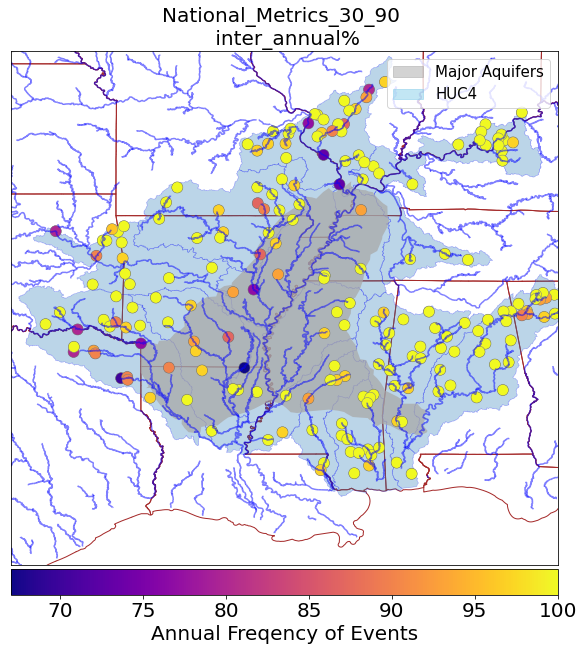

In [696]:
fig, ax = plt.subplots(figsize=(10, 10))
plt.title(f'{dataset[:-5]} \n {metric}', loc='center', fontsize=20)

# Lower-48 Plot
fn.plot_lower_48(ax)

# Plot streams
filepath = 'C:\\Users\\kondr\\Documents\\GitHub\\DahlkeLab_LAWR'
folder = 'Streams_us'
file = 'us_streams.shp'
shapefile_path = f'{filepath}\\ShapeFiles\\{folder}\\{file}'
st = gpd.read_file(shapefile_path)
#st = st.to_crs(epsg=4269)
st_plot = st.plot(ax=ax, edgecolor='blue', alpha = 0.5, legend=True)

# HUC4 Region Plot
for root, dirs, files in os.walk(aquifer.wb_dir):
    #print(root, dirs, files)
    if os.path.basename(root).startswith('NHD_H_'):
        if aquifer.wb_shapefiles in files:
            shapefile_aq_path = os.path.join(root, aquifer.wb_shapefiles)
            ws_gdf = gpd.read_file(shapefile_aq_path)
            ws_gdf = ws_gdf.to_crs(epsg=4269)
            ws_gdf.plot(ax=ax, edgecolor='blue', alpha=0.30, linewidth=0.5)

# Plot aquifers
high_plains_gdf = get_aquifer_gdf(cl.high_plains_aquifer)
high_plains_gdf.plot(ax=ax, edgecolor='none', facecolor='darkgrey', linewidth=1.25, alpha=0.75)

central_valley_gdf = get_aquifer_gdf(cl.central_valley_aquifer)
central_valley_gdf.plot(ax=ax, edgecolor='none', facecolor='darkgrey', linewidth=1.25, alpha=0.75)

meras_gdf = get_aquifer_gdf(cl.upper_clairborne_aquifer)
meras_gdf.plot(ax=ax, edgecolor='none', facecolor='darkgrey', linewidth=1.25, alpha=0.75)

xmin, ymin, xmax, ymax = meras_gdf.total_bounds
padding = 3.0
xmin -= padding
ymin -= padding
xmax += padding
ymax += padding

#aq_gdf.plot(ax=ax, edgecolor='red', facecolor='none', linewidth=1.25)
ax.set_xlim(xmin, xmax)
ax.set_ylim(ymin, ymax)

# Convert decimal lat/long to geo points
df_valid_geo = df_valid.reset_index()
geo_df = fn.convert_geometry(df_valid_geo)
geo_df.crs = 4269
geo_df = geo_df.merge(df_valid_geo, how='left', left_index=True, right_index=True)
#geo_df.dropna(subset=[metric+'_bin'], inplace=True)

# Set colorbar limits and theme using undivided dataset so that scale is static
cmap, mappable = fn.scale_colorbar(df_valid, metric, cmap='plasma')
div = make_axes_locatable(ax)
cax = div.append_axes("bottom", size="5%", pad=0.05)

# Watergauges plot - colormap
bx = geo_df.plot(ax=ax, column=metric, markersize=400, marker='.', cmap=cmap, edgecolor='black', linewidth=1, alpha=0.75)
cbx = plt.colorbar(mappable, cax=cax, pad=0.05, aspect=25, orientation='horizontal', alpha=1.0)
cbx.set_label(fn.FLOW_METRIC_UNITS[metric], fontsize=20)

# Watergages plot - marker size
bx = geo_df.plot(ax=ax, column=metric, markersize=500, marker='.', 
                 cmap='plasma', linewidth=0.5, alpha=1.0, edgecolor='grey')
cbx = plt.colorbar(mappable, cax=cax, pad=0.05, aspect=25, orientation='horizontal', alpha=1.0)
cbx.set_label(fn.FLOW_METRIC_UNITS[metric])
cbx.ax.tick_params(labelsize=20)

ax.set_yticks([])
ax.set_xticks([])

# num_ticks = 12

# # Calculate the tick positions
# tick_positions = np.linspace(0, 365, num_ticks)

# # Set the tick positions and labels on the color bar
# cbx.set_ticks(tick_positions)
# cbx.set_ticklabels([f'{tick:.2f}' for tick in tick_positions])  # Format the tick labels as desired

# Plot legend
handles = []  # Store handles for legend
labels = []   # Store labels for legend
handles.extend([Patch(color='darkgrey', alpha=0.5), Patch(color='skyblue', alpha=0.5)])  # Add the handle for legend
labels.extend(['Major Aquifers', 'HUC4'])  # Add the label for legend
ax.legend(handles, labels, loc='upper right', fontsize=15)

# Save images if they don't exist or if overwrite is True
if save_img:
    img_path = f'Saved_Visuals/{dataset[:-5]}_{metric}.png'
    fn.save_plot_as_image(img_path, overwrite)
    
plt.savefig(f'Saved_Visuals/hyd201b_presentation/{aquifer_name}_{metric}.png', bbox_inches='tight')

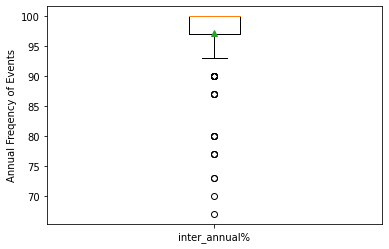

count    200.000000
mean      97.170000
std        6.084092
min       67.000000
25%       97.000000
50%      100.000000
75%      100.000000
max      100.000000
Name: inter_annual%, dtype: float64

In [697]:
def plot_hmf_metric_boxplot(df, metric):
    plt.boxplot(df[metric], showmeans=True)
    #print(boxplot['fliers'])
    plt.xticks(ticks=[1], labels=[f'{metric}'])
    plt.ylabel(fn.FLOW_METRIC_UNITS[metric])
    plt.show()
    return

def get_boxplot_outliers(df, metric):
    boxplot = plt.boxplot(df[metric], showmeans=True)
    plt.xticks(ticks=[1], labels=[f'{metric}'])
    plt.ylabel(fn.FLOW_METRIC_UNITS[metric])
    plt.show()
    
    # Extract outliers
    outliers = [flier.get_ydata() for flier in boxplot['fliers']] # note: boxplot['fliers'] is a graphical object
    # Flatten the outliers list
    outliers = [item for sublist in outliers for item in sublist]
    outlier_site_nos = df.loc[df[metric].isin(outliers), 'site_no']
    return outliers, outlier_site_nos

# All HMF metrics
#for metric in metric_list:
#    plot_hmf_metric_boxplot(df_natl_30_90, metric)

# Singular HMF metric
#plot_hmf_metric_boxplot(df_natl_30_90, metric)
outliers, outlier_site_nos = get_boxplot_outliers(df_valid, metric)
df_valid[metric].describe()

### Intra-annual

In [764]:
# Metric to be plotted where metrics are column names from the dataset
metric = 'intra_annual' #'annual_hmf'

# True if you want to overwrite current images
overwrite = False
save_img = False

In [765]:
bin_1 = 3
bin_2 = 6
bin_3 = 10
bin_4 = 15
bin_5 = 20
bin_6 = 28

bin_value_1 = 100
bin_value_2 = 500
bin_value_3 = 1000
bin_value_4 = 1500
bin_value_5 = 2000
bin_value_6 = 4000

for idx, value in df_valid[metric].iteritems():
    if value >= 0 and value < bin_1:
        df_valid.at[idx, metric+'_bin'] = bin_value_1
    elif value >= bin_1 and value < bin_2:
        df_valid.at[idx, metric+'_bin'] = bin_value_2
    elif value >= bin_2 and value < bin_3:
        df_valid.at[idx, metric+'_bin'] = bin_value_3
    elif value >= bin_3 and value < bin_4:
        df_valid.at[idx, metric+'_bin'] = bin_value_4
    elif value >= bin_4 and value < bin_5:
        df_valid.at[idx, metric+'_bin'] = bin_value_5
    elif value >= bin_5 and value <= bin_6:
        df_valid.at[idx, metric+'_bin'] = bin_value_6

#print(df_valid['annual_hmf_bin'])
#print(df_valid['annual_hmf'])

bin_colors = {
    bin_value_1: 'red',
    bin_value_2: 'darkorange',
    bin_value_3: 'yellow',
    bin_value_4: 'magenta',
    bin_value_5: 'purple',
    bin_value_6: 'royalblue'
}

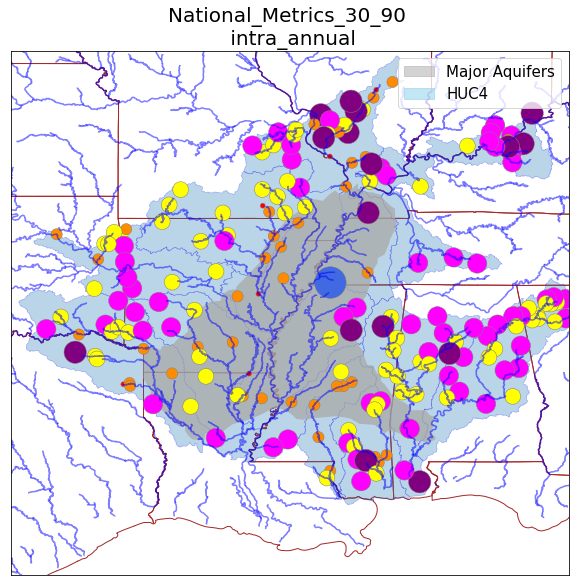

In [766]:
fig, ax = plt.subplots(figsize=(10, 10))
plt.title(f'{dataset[:-5]} \n {metric}', loc='center', fontsize=20)

# Lower-48 Plot
fn.plot_lower_48(ax)

# Plot streams
filepath = 'C:\\Users\\kondr\\Documents\\GitHub\\DahlkeLab_LAWR'
folder = 'Streams_us'
file = 'us_streams.shp'
shapefile_path = f'{filepath}\\ShapeFiles\\{folder}\\{file}'
st = gpd.read_file(shapefile_path)
#st = st.to_crs(epsg=4269)
st_plot = st.plot(ax=ax, edgecolor='blue', alpha = 0.5, legend=True)

# HUC4 Region Plot
for root, dirs, files in os.walk(aquifer.wb_dir):
    #print(root, dirs, files)
    if os.path.basename(root).startswith('NHD_H_'):
        if aquifer.wb_shapefiles in files:
            shapefile_aq_path = os.path.join(root, aquifer.wb_shapefiles)
            ws_gdf = gpd.read_file(shapefile_aq_path)
            ws_gdf = ws_gdf.to_crs(epsg=4269)
            ws_gdf.plot(ax=ax, edgecolor='blue', alpha=0.30, linewidth=0.5)

# Plot aquifers
high_plains_gdf = get_aquifer_gdf(cl.high_plains_aquifer)
high_plains_gdf.plot(ax=ax, edgecolor='none', facecolor='darkgrey', linewidth=1.25, alpha=0.75)

central_valley_gdf = get_aquifer_gdf(cl.central_valley_aquifer)
central_valley_gdf.plot(ax=ax, edgecolor='none', facecolor='darkgrey', linewidth=1.25, alpha=0.75)

meras_gdf = get_aquifer_gdf(cl.upper_clairborne_aquifer)
meras_gdf.plot(ax=ax, edgecolor='none', facecolor='darkgrey', linewidth=1.25, alpha=0.75)

xmin, ymin, xmax, ymax = meras_gdf.total_bounds
padding = 3.0
xmin -= padding
ymin -= padding
xmax += padding
ymax += padding

# aq_gdf.plot(ax=ax, edgecolor='red', facecolor='none', linewidth=1.25)
ax.set_xlim(xmin, xmax)
ax.set_ylim(ymin, ymax)

# Convert decimal lat/long to geo points
df_valid_geo = df_valid.reset_index()
geo_df = fn.convert_geometry(df_valid_geo)
geo_df.crs = 4269
geo_df = geo_df.merge(df_valid_geo, how='left', left_index=True, right_index=True)
geo_df.dropna(subset=[metric+'_bin'], inplace=True)

# Set colorbar limits and theme using undivided dataset so that scale is static
#cmap, mappable = fn.scale_colorbar(df_valid, metric)
#div = make_axes_locatable(ax)
#cax = div.append_axes("bottom", size="5%", pad=0.05)

# Watergauges plot - colormap
#bx = geo_df.plot(ax=ax, column='inter_annual', markersize=300, marker='.', cmap=cmap, edgecolor='black', linewidth=1, alpha=0.75)
#cbx = plt.colorbar(mappable, cax=cax, pad=0.05, aspect=25, orientation='horizontal', alpha=1.0)
#cbx.set_label(fn.FLOW_METRIC_UNITS[metric])

# Watergages plot - marker size
bx = geo_df.plot(ax=ax, markersize=geo_df[metric+'_bin'], marker='.', 
                 color=[bin_colors[bin_val] for bin_val in geo_df[metric+'_bin']], linewidth=0.5, alpha=1.0, edgecolor='grey') #column=metric
#cbx = plt.colorbar(mappable, cax=cax, pad=0.05, aspect=25, orientation='horizontal', alpha=1.0)
#cbx.set_label(fn.FLOW_METRIC_UNITS[metric])

ax.set_yticks([])
ax.set_xticks([])

# Plot legend
handles = []  # Store handles for legend
labels = []   # Store labels for legend
handles.extend([Patch(color='darkgrey', alpha=0.5), Patch(color='skyblue', alpha=0.5)])  # Add the handle for legend
labels.extend(['Major Aquifers', 'HUC4'])  # Add the label for legend
ax.legend(handles, labels, loc='upper right', fontsize=15)

# Save images if they don't exist or if overwrite is True
if save_img:
    img_path = f'Saved_Visuals/{dataset[:-5]}_{metric}.png'
    fn.save_plot_as_image(img_path, overwrite)
    
plt.savefig(f'Saved_Visuals/hyd201b_presentation/{aquifer_name}_{metric}.png', bbox_inches='tight')

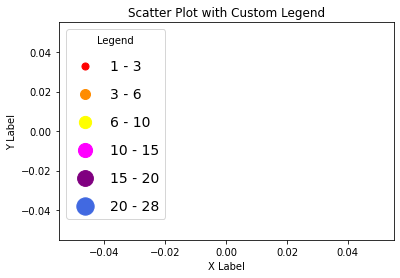

In [767]:
import matplotlib.patches as mpatches

# Define bin values and corresponding colors
bin_values = [bin_value_1, bin_value_2, bin_value_3, bin_value_4, bin_value_5, bin_value_6]
bin_colors = ['red', 'darkorange', 'yellow', 'magenta', 'purple', 'royalblue']

# Define bin ranges
bin_ranges = [(1, bin_1), (bin_1, bin_2), (bin_2, bin_3), (bin_3, bin_4), (bin_4, bin_5), (bin_5, bin_6)]

# Define marker sizes corresponding to bin values
marker_sizes = [50, 100, 150, 200, 250, 300]

# Plot dummy points for the legend
for i in range(len(bin_values)):
    plt.scatter([], [], c=bin_colors[i], s=marker_sizes[i], label=f'{bin_ranges[i][0]} - {bin_ranges[i][1]}')

# Create custom legend with markers, sizes, bin ranges, and colors
plt.legend(scatterpoints=1, frameon=True, labelspacing=1, title='Legend', loc='upper left', fontsize=14)

plt.xlabel('X Label')
plt.ylabel('Y Label')
plt.title('Scatter Plot with Custom Legend')

plt.savefig(f'Saved_Visuals/hyd201b_presentation/{dataset[:-5]}_{metric}_legend.png', bbox_inches='tight')

plt.show()

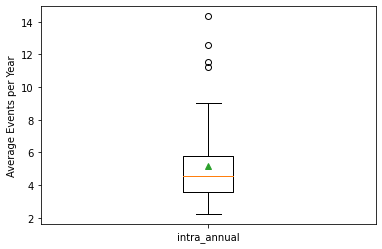

count    67.000000
mean      5.143611
std       2.402736
min       2.230769
25%       3.560386
50%       4.538462
75%       5.806034
max      14.333333
Name: intra_annual, dtype: float64

In [754]:
def plot_hmf_metric_boxplot(df, metric):
    plt.boxplot(df[metric], showmeans=True)
    #print(boxplot['fliers'])
    plt.xticks(ticks=[1], labels=[f'{metric}'])
    plt.ylabel(fn.FLOW_METRIC_UNITS[metric])
    plt.show()
    return

def get_boxplot_outliers(df, metric):
    boxplot = plt.boxplot(df[metric], showmeans=True)
    plt.xticks(ticks=[1], labels=[f'{metric}'])
    plt.ylabel(fn.FLOW_METRIC_UNITS[metric])
    plt.show()
    
    # Extract outliers
    outliers = [flier.get_ydata() for flier in boxplot['fliers']] # note: boxplot['fliers'] is a graphical object
    # Flatten the outliers list
    outliers = [item for sublist in outliers for item in sublist]
    outlier_site_nos = df.loc[df[metric].isin(outliers), 'site_no']
    return outliers, outlier_site_nos

# All HMF metrics
#for metric in metric_list:
#    plot_hmf_metric_boxplot(df_natl_30_90, metric)

# Singular HMF metric
#plot_hmf_metric_boxplot(df_natl_30_90, metric)
outliers, outlier_site_nos = get_boxplot_outliers(df_valid, metric)
df_valid[metric].describe()

### Timing

In [888]:
# Metric to be plotted where metrics are column names from the dataset
metric = 'timing' #'annual_hmf'

# True if you want to overwrite current images
overwrite = False
save_img = False

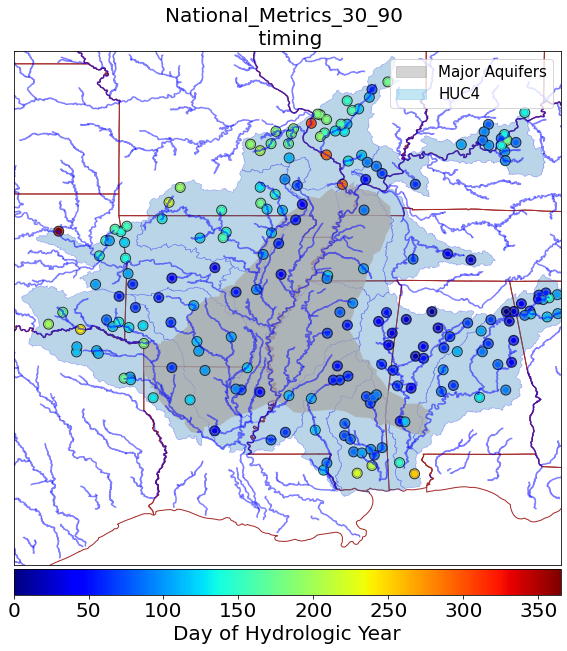

In [890]:
fig, ax = plt.subplots(figsize=(10, 10))
plt.title(f'{dataset[:-5]} \n {metric}', loc='center', fontsize=20)

# Lower-48 Plot
fn.plot_lower_48(ax)

# Plot streams
filepath = 'C:\\Users\\kondr\\Documents\\GitHub\\DahlkeLab_LAWR'
folder = 'Streams_us'
file = 'us_streams.shp'
shapefile_path = f'{filepath}\\ShapeFiles\\{folder}\\{file}'
st = gpd.read_file(shapefile_path)
#st = st.to_crs(epsg=4269)
st_plot = st.plot(ax=ax, edgecolor='blue', alpha = 0.5, legend=True)

# HUC4 Region Plot
for root, dirs, files in os.walk(aquifer.wb_dir):
    #print(root, dirs, files)
    if os.path.basename(root).startswith('NHD_H_'):
        if aquifer.wb_shapefiles in files:
            shapefile_aq_path = os.path.join(root, aquifer.wb_shapefiles)
            ws_gdf = gpd.read_file(shapefile_aq_path)
            ws_gdf = ws_gdf.to_crs(epsg=4269)
            ws_gdf.plot(ax=ax, edgecolor='blue', alpha=0.30, linewidth=0.5)

# Plot aquifers
high_plains_gdf = get_aquifer_gdf(cl.high_plains_aquifer)
high_plains_gdf.plot(ax=ax, edgecolor='none', facecolor='darkgrey', linewidth=1.25, alpha=0.75)

central_valley_gdf = get_aquifer_gdf(cl.central_valley_aquifer)
central_valley_gdf.plot(ax=ax, edgecolor='none', facecolor='darkgrey', linewidth=1.25, alpha=0.75)

meras_gdf = get_aquifer_gdf(cl.upper_clairborne_aquifer)
meras_gdf.plot(ax=ax, edgecolor='none', facecolor='darkgrey', linewidth=1.25, alpha=0.75)

xmin, ymin, xmax, ymax = meras_gdf.total_bounds
padding = 3.0
xmin -= padding
ymin -= padding
xmax += padding
ymax += padding

# aq_gdf.plot(ax=ax, edgecolor='red', facecolor='none', linewidth=1.25)
ax.set_xlim(xmin, xmax)
ax.set_ylim(ymin, ymax)

# Convert decimal lat/long to geo points
df_valid_geo = df_valid.reset_index()
geo_df = fn.convert_geometry(df_valid_geo)
geo_df.crs = 4269
geo_df = geo_df.merge(df_valid_geo, how='left', left_index=True, right_index=True)
#geo_df.dropna(subset=[metric+'_bin'], inplace=True)

# Set colorbar limits and theme using undivided dataset so that scale is static
#cmap, mappable = fn.scale_colorbar(df_valid, metric)
vmin = 0
vmax = 365        
norm = mcolors.Normalize(vmin, vmax)
cmap = 'jet'
mappable = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
mappable.set_array(df_valid[metric])
div = make_axes_locatable(ax)
cax = div.append_axes("bottom", size="5%", pad=0.05)

# Watergauges plot - colormap
bx = geo_df.plot(ax=ax, column=metric, markersize=400, marker='.', cmap=cmap, edgecolor='black', linewidth=1, alpha=0.75)
cbx = plt.colorbar(mappable, cax=cax, pad=0.05, aspect=25, orientation='horizontal', alpha=1.0)
cbx.set_label(fn.FLOW_METRIC_UNITS[metric], fontsize=20)

# Watergages plot - marker size
bx = geo_df.plot(ax=ax, column=metric, markersize=geo_df[metric], marker='.', 
                 cmap='jet', linewidth=0.5, alpha=1.0, edgecolor='grey')
cbx = plt.colorbar(mappable, cax=cax, pad=0.05, aspect=25, orientation='horizontal', alpha=1.0)
cbx.set_label(fn.FLOW_METRIC_UNITS[metric])
cbx.ax.tick_params(labelsize=20)

ax.set_yticks([])
ax.set_xticks([])

# num_ticks = 12

# # Calculate the tick positions
# tick_positions = np.linspace(0, 365, num_ticks)

# # Set the tick positions and labels on the color bar
# cbx.set_ticks(tick_positions)
# cbx.set_ticklabels([f'{tick:.2f}' for tick in tick_positions])  # Format the tick labels as desired

# Plot legend
handles = []  # Store handles for legend
labels = []   # Store labels for legend
handles.extend([Patch(color='darkgrey', alpha=0.5), Patch(color='skyblue', alpha=0.5)])  # Add the handle for legend
labels.extend(['Major Aquifers', 'HUC4'])  # Add the label for legend
ax.legend(handles, labels, loc='upper right', fontsize=15)

# Save images if they don't exist or if overwrite is True
if save_img:
    img_path = f'Saved_Visuals/{dataset[:-5]}_{metric}.png'
    fn.save_plot_as_image(img_path, overwrite)
    
plt.savefig(f'Saved_Visuals/hyd201b_presentation/{aquifer_name}_{metric}.png', bbox_inches='tight')

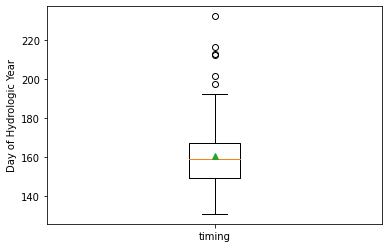

count    200.000000
mean     160.282527
std       15.611949
min      130.766667
25%      148.983333
50%      158.738889
75%      167.166667
max      232.041667
Name: timing, dtype: float64

In [806]:
def plot_hmf_metric_boxplot(df, metric):
    plt.boxplot(df[metric], showmeans=True)
    #print(boxplot['fliers'])
    plt.xticks(ticks=[1], labels=[f'{metric}'])
    plt.ylabel(fn.FLOW_METRIC_UNITS[metric])
    plt.show()
    return

def get_boxplot_outliers(df, metric):
    boxplot = plt.boxplot(df[metric], showmeans=True)
    plt.xticks(ticks=[1], labels=[f'{metric}'])
    plt.ylabel(fn.FLOW_METRIC_UNITS[metric])
    plt.show()
    
    # Extract outliers
    outliers = [flier.get_ydata() for flier in boxplot['fliers']] # note: boxplot['fliers'] is a graphical object
    # Flatten the outliers list
    outliers = [item for sublist in outliers for item in sublist]
    outlier_site_nos = df.loc[df[metric].isin(outliers), 'site_no']
    return outliers, outlier_site_nos

# All HMF metrics
#for metric in metric_list:
#    plot_hmf_metric_boxplot(df_natl_30_90, metric)

# Singular HMF metric
#plot_hmf_metric_boxplot(df_natl_30_90, metric)
outliers, outlier_site_nos = get_boxplot_outliers(df_valid, metric)
df_valid[metric].describe()

### Event HMF

In [718]:
# Metric to be plotted where metrics are column names from the dataset
metric = 'event_hmf' #'annual_hmf'

# True if you want to overwrite current images
overwrite = False
save_img = False

In [719]:
bin_1 = 0.005
bin_2 = 0.01
bin_3 = 0.1
bin_4 = 0.5
bin_5 = 1.0
bin_6 = 5.8

bin_value_1 = 100
bin_value_2 = 500
bin_value_3 = 1000
bin_value_4 = 1500
bin_value_5 = 2000
bin_value_6 = 5000

for idx, value in df_valid[metric].iteritems():
    if value >= 0 and value < bin_1:
        df_valid.at[idx, metric+'_bin'] = bin_value_1
    elif value >= bin_1 and value < bin_2:
        df_valid.at[idx, metric+'_bin'] = bin_value_2
    elif value >= bin_2 and value < bin_3:
        df_valid.at[idx, metric+'_bin'] = bin_value_3
    elif value >= bin_3 and value < bin_4:
        df_valid.at[idx, metric+'_bin'] = bin_value_4
    elif value >= bin_4 and value < bin_5:
        df_valid.at[idx, metric+'_bin'] = bin_value_5
    elif value >= bin_5 and value < bin_6:
        df_valid.at[idx, metric+'_bin'] = bin_value_6

#print(df_valid['annual_hmf_bin'])
#print(df_valid['annual_hmf'])

bin_colors = {
    bin_value_1: 'midnightblue',
    bin_value_2: 'royalblue',
    bin_value_3: 'turquoise',
    bin_value_4: 'lightgreen',
    bin_value_5: 'yellow',
    bin_value_6: 'darkorange'
}

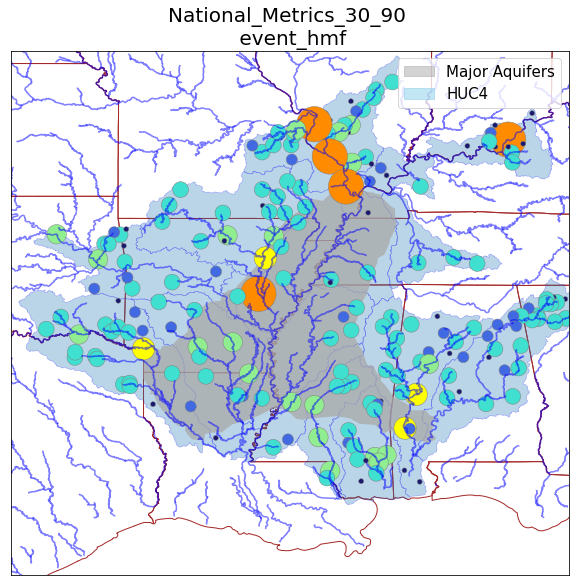

In [720]:
fig, ax = plt.subplots(figsize=(10, 10))
plt.title(f'{dataset[:-5]} \n {metric}', loc='center', fontsize=20)

# Lower-48 Plot
fn.plot_lower_48(ax)

# Plot streams
filepath = 'C:\\Users\\kondr\\Documents\\GitHub\\DahlkeLab_LAWR'
folder = 'Streams_us'
file = 'us_streams.shp'
shapefile_path = f'{filepath}\\ShapeFiles\\{folder}\\{file}'
st = gpd.read_file(shapefile_path)
#st = st.to_crs(epsg=4269)
st_plot = st.plot(ax=ax, edgecolor='blue', alpha = 0.5, legend=True)

# HUC4 Region Plot
for root, dirs, files in os.walk(aquifer.wb_dir):
    #print(root, dirs, files)
    if os.path.basename(root).startswith('NHD_H_'):
        if aquifer.wb_shapefiles in files:
            shapefile_aq_path = os.path.join(root, aquifer.wb_shapefiles)
            ws_gdf = gpd.read_file(shapefile_aq_path)
            ws_gdf = ws_gdf.to_crs(epsg=4269)
            ws_gdf.plot(ax=ax, edgecolor='blue', alpha=0.30, linewidth=0.5)

# Plot aquifers
high_plains_gdf = get_aquifer_gdf(cl.high_plains_aquifer)
high_plains_gdf.plot(ax=ax, edgecolor='none', facecolor='darkgrey', linewidth=1.25, alpha=0.75)

central_valley_gdf = get_aquifer_gdf(cl.central_valley_aquifer)
central_valley_gdf.plot(ax=ax, edgecolor='none', facecolor='darkgrey', linewidth=1.25, alpha=0.75)

meras_gdf = get_aquifer_gdf(cl.upper_clairborne_aquifer)
meras_gdf.plot(ax=ax, edgecolor='none', facecolor='darkgrey', linewidth=1.25, alpha=0.75)

xmin, ymin, xmax, ymax = meras_gdf.total_bounds
padding = 3.0
xmin -= padding
ymin -= padding
xmax += padding
ymax += padding

# aq_gdf.plot(ax=ax, edgecolor='red', facecolor='none', linewidth=1.25)
ax.set_xlim(xmin, xmax)
ax.set_ylim(ymin, ymax)

# Convert decimal lat/long to geo points
df_valid_geo = df_valid.reset_index()
geo_df = fn.convert_geometry(df_valid_geo)
geo_df.crs = 4269
geo_df = geo_df.merge(df_valid_geo, how='left', left_index=True, right_index=True)
geo_df.dropna(subset=[metric+'_bin'], inplace=True)

# Set colorbar limits and theme using undivided dataset so that scale is static
#cmap, mappable = fn.scale_colorbar(df_valid, metric)
#div = make_axes_locatable(ax)
#cax = div.append_axes("bottom", size="5%", pad=0.05)

# Watergauges plot - colormap
#bx = geo_df.plot(ax=ax, column='inter_annual', markersize=300, marker='.', cmap=cmap, edgecolor='black', linewidth=1, alpha=0.75)
#cbx = plt.colorbar(mappable, cax=cax, pad=0.05, aspect=25, orientation='horizontal', alpha=1.0)
#cbx.set_label(fn.FLOW_METRIC_UNITS[metric])

# Watergages plot - marker size
bx = geo_df.plot(ax=ax, markersize=geo_df[metric+'_bin'], marker='.', 
                 color=[bin_colors[bin_val] for bin_val in geo_df[metric+'_bin']], linewidth=0.5, alpha=1.0, edgecolor='grey') #column=metric
#cbx = plt.colorbar(mappable, cax=cax, pad=0.05, aspect=25, orientation='horizontal', alpha=1.0)
#cbx.set_label(fn.FLOW_METRIC_UNITS[metric])

ax.set_yticks([])
ax.set_xticks([])

# Plot legend
handles = []  # Store handles for legend
labels = []   # Store labels for legend
handles.extend([Patch(color='darkgrey', alpha=0.5), Patch(color='skyblue', alpha=0.5)])  # Add the handle for legend
labels.extend(['Major Aquifers', 'HUC4'])  # Add the label for legend
ax.legend(handles, labels, loc='upper right', fontsize=15)

# Save images if they don't exist or if overwrite is True
if save_img:
    img_path = f'Saved_Visuals/{dataset[:-5]}_{metric}.png'
    fn.save_plot_as_image(img_path, overwrite)
    
plt.savefig(f'Saved_Visuals/hyd201b_presentation/{aquifer_name}_{metric}.png', bbox_inches='tight')

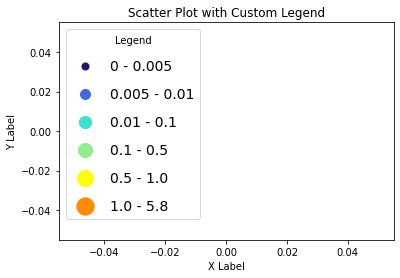

In [721]:
import matplotlib.patches as mpatches

# Define bin values and corresponding colors
bin_values = [bin_value_1, bin_value_2, bin_value_3, bin_value_4, bin_value_5, bin_value_6]
bin_colors = ['midnightblue', 'royalblue', 'turquoise', 'lightgreen', 'yellow', 'darkorange']

# Define bin ranges
bin_ranges = [(0, bin_1), (bin_1, bin_2), (bin_2, bin_3), (bin_3, bin_4), (bin_4, bin_5), (bin_5, bin_6)]

# Define marker sizes corresponding to bin values
marker_sizes = [50, 100, 150, 200, 250, 300]

# Plot dummy points for the legend
for i in range(len(bin_values)):
    plt.scatter([], [], c=bin_colors[i], s=marker_sizes[i], label=f'{bin_ranges[i][0]} - {bin_ranges[i][1]}')

# Create custom legend with markers, sizes, bin ranges, and colors
plt.legend(scatterpoints=1, frameon=True, labelspacing=1, title='Legend', loc='upper left', fontsize=14)

plt.xlabel('X Label')
plt.ylabel('Y Label')
plt.title('Scatter Plot with Custom Legend')

plt.savefig(f'Saved_Visuals/hyd201b_presentation/{dataset[:-5]}_{metric}_legend.png', bbox_inches='tight')

plt.show()

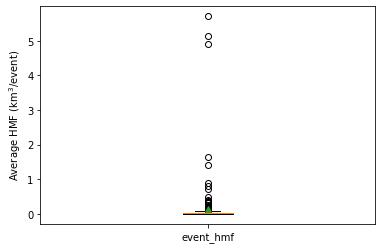

count    200.000000
mean       0.146859
std        0.660269
min        0.000524
25%        0.006855
50%        0.018975
75%        0.042717
max        5.707410
Name: event_hmf, dtype: float64

In [722]:
def plot_hmf_metric_boxplot(df, metric):
    plt.boxplot(df[metric], showmeans=True)
    #print(boxplot['fliers'])
    plt.xticks(ticks=[1], labels=[f'{metric}'])
    plt.ylabel(fn.FLOW_METRIC_UNITS[metric])
    plt.show()
    return

def get_boxplot_outliers(df, metric):
    boxplot = plt.boxplot(df[metric], showmeans=True)
    plt.xticks(ticks=[1], labels=[f'{metric}'])
    plt.ylabel(fn.FLOW_METRIC_UNITS[metric])
    plt.show()
    
    # Extract outliers
    outliers = [flier.get_ydata() for flier in boxplot['fliers']] # note: boxplot['fliers'] is a graphical object
    # Flatten the outliers list
    outliers = [item for sublist in outliers for item in sublist]
    outlier_site_nos = df.loc[df[metric].isin(outliers), 'site_no']
    return outliers, outlier_site_nos

# All HMF metrics
#for metric in metric_list:
#    plot_hmf_metric_boxplot(df_natl_30_90, metric)

# Singular HMF metric
#plot_hmf_metric_boxplot(df_natl_30_90, metric)
outliers, outlier_site_nos = get_boxplot_outliers(df_valid, metric)
df_valid[metric].describe()

### Event duration

In [743]:
# Metric to be plotted where metrics are column names from the dataset
metric = 'event_duration' #'annual_hmf'

# True if you want to overwrite current images
overwrite = False
save_img = False

In [744]:
# Event duration
bin_1 = 3
bin_2 = 7
bin_3 = 10
bin_4 = 15
bin_5 = 20
bin_6 = 30
bin_7 = 40
bin_8 = 72

bin_value_1 = 10
bin_value_2 = 200
bin_value_3 = 400
bin_value_4 = 600
bin_value_5 = 800
bin_value_6 = 1000
bin_value_7 = 1200
bin_value_8 = 1400

for idx, value in df_valid[metric].iteritems():
    if value >= 0 and value < bin_1:
        df_valid.at[idx, metric+'_bin'] = bin_value_1
    elif value >= bin_1 and value < bin_2:
        df_valid.at[idx, metric+'_bin'] = bin_value_2
    elif value >= bin_2 and value < bin_3:
        df_valid.at[idx, metric+'_bin'] = bin_value_3
    elif value >= bin_3 and value < bin_4:
        df_valid.at[idx, metric+'_bin'] = bin_value_4
    elif value >= bin_4 and value < bin_5:
        df_valid.at[idx, metric+'_bin'] = bin_value_5
    elif value >= bin_5 and value < bin_6:
        df_valid.at[idx, metric+'_bin'] = bin_value_6
    elif value >= bin_6 and value < bin_7:
        df_valid.at[idx, metric+'_bin'] = bin_value_7
    elif value >= bin_7 and value < bin_8:
        df_valid.at[idx, metric+'_bin'] = bin_value_8
        
#print(df_valid['annual_hmf_bin'])
#print(df_valid['annual_hmf'])

bin_colors = {
    bin_value_1: 'midnightblue',
    bin_value_2: 'royalblue',
    bin_value_3: 'turquoise',
    bin_value_4: 'lightblue',
    bin_value_5: 'purple',
    bin_value_6: 'red',
    bin_value_7: 'darkorange',
    bin_value_8: 'yellow'
}

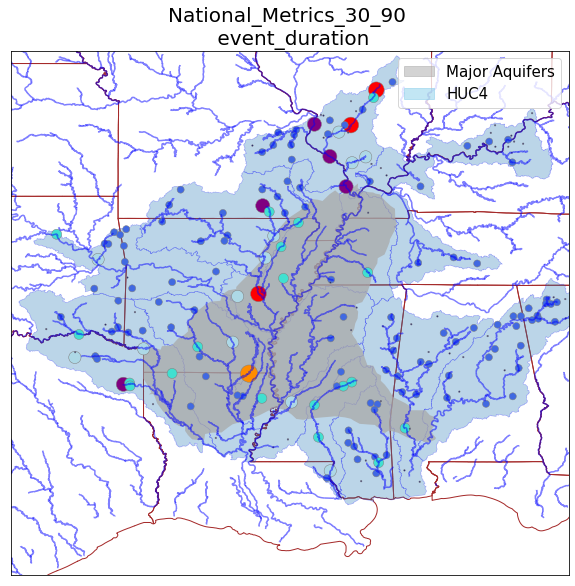

In [745]:
fig, ax = plt.subplots(figsize=(10, 10))
plt.title(f'{dataset[:-5]} \n {metric}', loc='center', fontsize=20)

# Lower-48 Plot
fn.plot_lower_48(ax)

# Plot streams
filepath = 'C:\\Users\\kondr\\Documents\\GitHub\\DahlkeLab_LAWR'
folder = 'Streams_us'
file = 'us_streams.shp'
shapefile_path = f'{filepath}\\ShapeFiles\\{folder}\\{file}'
st = gpd.read_file(shapefile_path)
#st = st.to_crs(epsg=4269)
st_plot = st.plot(ax=ax, edgecolor='blue', alpha = 0.5, legend=True)

# HUC4 Region Plot
for root, dirs, files in os.walk(aquifer.wb_dir):
    #print(root, dirs, files)
    if os.path.basename(root).startswith('NHD_H_'):
        if aquifer.wb_shapefiles in files:
            shapefile_aq_path = os.path.join(root, aquifer.wb_shapefiles)
            ws_gdf = gpd.read_file(shapefile_aq_path)
            ws_gdf = ws_gdf.to_crs(epsg=4269)
            ws_gdf.plot(ax=ax, edgecolor='blue', alpha=0.30, linewidth=0.5)

# Plot aquifers
high_plains_gdf = get_aquifer_gdf(cl.high_plains_aquifer)
high_plains_gdf.plot(ax=ax, edgecolor='none', facecolor='darkgrey', linewidth=1.25, alpha=0.75)

central_valley_gdf = get_aquifer_gdf(cl.central_valley_aquifer)
central_valley_gdf.plot(ax=ax, edgecolor='none', facecolor='darkgrey', linewidth=1.25, alpha=0.75)

meras_gdf = get_aquifer_gdf(cl.upper_clairborne_aquifer)
meras_gdf.plot(ax=ax, edgecolor='none', facecolor='darkgrey', linewidth=1.25, alpha=0.75)

xmin, ymin, xmax, ymax = meras_gdf.total_bounds
padding = 3.0
xmin -= padding
ymin -= padding
xmax += padding
ymax += padding

# aq_gdf.plot(ax=ax, edgecolor='red', facecolor='none', linewidth=1.25)
ax.set_xlim(xmin, xmax)
ax.set_ylim(ymin, ymax)

# Convert decimal lat/long to geo points
df_valid_geo = df_valid.reset_index()
geo_df = fn.convert_geometry(df_valid_geo)
geo_df.crs = 4269
geo_df = geo_df.merge(df_valid_geo, how='left', left_index=True, right_index=True)
#geo_df.dropna(subset=[metric+'_bin'], inplace=True)

# Set colorbar limits and theme using undivided dataset so that scale is static
#cmap, mappable = fn.scale_colorbar(df_valid, metric)
#div = make_axes_locatable(ax)
#cax = div.append_axes("bottom", size="5%", pad=0.05)

# Watergauges plot - colormap
#bx = geo_df.plot(ax=ax, column='inter_annual', markersize=300, marker='.', cmap=cmap, edgecolor='black', linewidth=1, alpha=0.75)
#cbx = plt.colorbar(mappable, cax=cax, pad=0.05, aspect=25, orientation='horizontal', alpha=1.0)
#cbx.set_label(fn.FLOW_METRIC_UNITS[metric])

# Watergages plot - marker size
bx = geo_df.plot(ax=ax, markersize=geo_df[metric+'_bin'], marker='.', 
                 color=[bin_colors[bin_val] for bin_val in geo_df[metric+'_bin']], linewidth=0.5, alpha=1.0, edgecolor='grey') #column=metric
#cbx = plt.colorbar(mappable, cax=cax, pad=0.05, aspect=25, orientation='horizontal', alpha=1.0)
#cbx.set_label(fn.FLOW_METRIC_UNITS[metric])

ax.set_yticks([])
ax.set_xticks([])

# Plot legend
handles = []  # Store handles for legend
labels = []   # Store labels for legend
handles.extend([Patch(color='darkgrey', alpha=0.5), Patch(color='skyblue', alpha=0.5)])  # Add the handle for legend
labels.extend(['Major Aquifers', 'HUC4'])  # Add the label for legend
ax.legend(handles, labels, loc='upper right', fontsize=15)

# Save images if they don't exist or if overwrite is True
if save_img:
    img_path = f'Saved_Visuals/{dataset[:-5]}_{metric}.png'
    fn.save_plot_as_image(img_path, overwrite)
    
plt.savefig(f'Saved_Visuals/hyd201b_presentation/{aquifer_name}_{metric}.png', bbox_inches='tight')

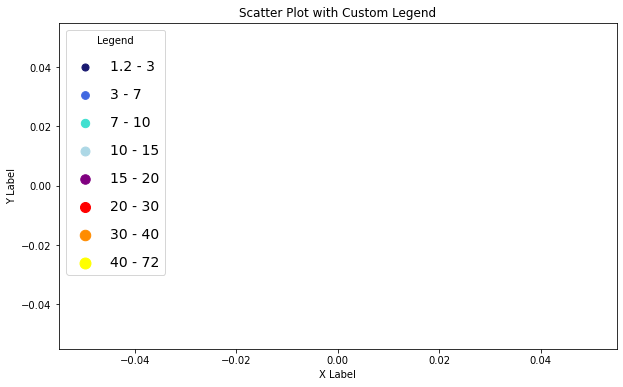

In [746]:
import matplotlib.patches as mpatches

# Define bin values and corresponding colors
bin_values = [bin_value_1, bin_value_2, bin_value_3, bin_value_4, bin_value_5, bin_value_6, bin_value_7, bin_value_8]
bin_colors = ['midnightblue', 'royalblue', 'turquoise', 'lightblue', 'purple', 'red', 'darkorange', 'yellow']

# Define bin ranges
bin_ranges = [(1.2, bin_1), (bin_1, bin_2), (bin_2, bin_3), (bin_3, bin_4), (bin_4, bin_5), (bin_5, bin_6), (bin_6, bin_7), (bin_7, bin_8)]

# Define marker sizes corresponding to bin values
marker_sizes = [50, 60, 70, 80, 90, 100, 110, 120]

# Plot dummy points for the legend
plt.figure(figsize=(10, 6))
for i in range(len(bin_values)):
    plt.scatter([], [], c=bin_colors[i], s=marker_sizes[i], label=f'{bin_ranges[i][0]} - {bin_ranges[i][1]}')

# Create custom legend with markers, sizes, bin ranges, and colors
plt.legend(scatterpoints=1, frameon=True, labelspacing=1, title='Legend', loc='upper left', fontsize=14)

plt.xlabel('X Label')
plt.ylabel('Y Label')
plt.title('Scatter Plot with Custom Legend')

plt.savefig(f'Saved_Visuals/hyd201b_presentation/{dataset[:-5]}_{metric}_legend.png', bbox_inches='tight')

plt.show()

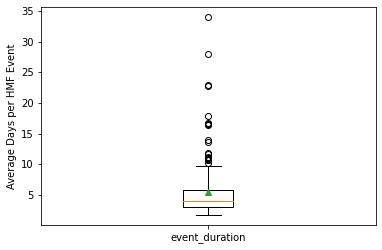

count    200.000000
mean       5.441067
std        4.421415
min        1.714487
25%        3.012257
50%        3.939523
75%        5.841929
max       33.966667
Name: event_duration, dtype: float64

In [747]:
def plot_hmf_metric_boxplot(df, metric):
    plt.boxplot(df[metric], showmeans=True)
    #print(boxplot['fliers'])
    plt.xticks(ticks=[1], labels=[f'{metric}'])
    plt.ylabel(fn.FLOW_METRIC_UNITS[metric])
    plt.show()
    return

def get_boxplot_outliers(df, metric):
    boxplot = plt.boxplot(df[metric], showmeans=True)
    plt.xticks(ticks=[1], labels=[f'{metric}'])
    plt.ylabel(fn.FLOW_METRIC_UNITS[metric])
    plt.show()
    
    # Extract outliers
    outliers = [flier.get_ydata() for flier in boxplot['fliers']] # note: boxplot['fliers'] is a graphical object
    # Flatten the outliers list
    outliers = [item for sublist in outliers for item in sublist]
    outlier_site_nos = df.loc[df[metric].isin(outliers), 'site_no']
    return outliers, outlier_site_nos

# All HMF metrics
#for metric in metric_list:
#    plot_hmf_metric_boxplot(df_natl_30_90, metric)

# Singular HMF metric
#plot_hmf_metric_boxplot(df_natl_30_90, metric)
outliers, outlier_site_nos = get_boxplot_outliers(df_valid, metric)
df_valid[metric].describe()